# Importing Libraries

In [205]:
import numpy as np
import pandas as pd

import seaborn as sns 
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.impute import SimpleImputer

from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV, StratifiedKFold, cross_val_score
from sklearn.preprocessing import MinMaxScaler, StandardScaler, LabelEncoder, OneHotEncoder, OrdinalEncoder

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, VotingClassifier, GradientBoostingClassifier,AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier
from sklearn.dummy import DummyClassifier
from pandas_profiling import ProfileReport

from sklearn.feature_selection import mutual_info_classif
from sklearn.feature_selection import VarianceThreshold
from sklearn.feature_selection import RFECV

from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay

import warnings

warnings.filterwarnings('ignore')
pd.options.display.max_columns = None

# Importing Dataset

In [206]:
aav = pd.read_csv('Virus Datasets/AAV2_integration.csv')
ebv = pd.read_csv('Virus Datasets/EBV_integration.csv')
hbv = pd.read_csv('Virus Datasets/HBV_integration.csv')
hiv = pd.read_csv('Virus Datasets/HIV_integration.csv')
hpv = pd.read_csv('Virus Datasets/HPV_integration.csv')
htlv = pd.read_csv('Virus Datasets/HTLV1_integration.csv')
mcv = pd.read_csv('Virus Datasets/MCV_integration.csv')
xmrv = pd.read_csv('Virus Datasets/XMRV_integration.csv')

### Creating columns for each dataset Virus Name and Virus Type, Each virus can be classified by either DNA or RNA virus

In [207]:
aav['Virus Name'] = "AAV2"
aav['Virus Type'] = "DNA"

ebv['Virus Name'] = "EBV"
ebv['Virus Type'] = "DNA"

hbv['Virus Name'] = "HBV"
hbv['Virus Type'] = "DNA"

hiv['Virus Name'] = "HIV"
hiv['Virus Type'] = "RNA"

hpv['Virus Name'] = "HPV"
hpv['Virus Type'] = "DNA"

htlv['Virus Name'] = "HTLV1"
htlv['Virus Type'] = "RNA"

mcv['Virus Name'] = "MCV"
mcv['Virus Type'] = "DNA"

xmrv['Virus Name'] = "XMRV"
xmrv['Virus Type'] = "RNA"

## Merging Datasets

In [208]:
df_list = [aav, ebv, hbv, hiv, hpv, htlv, mcv, xmrv]
merged_df = pd.concat(df_list, ignore_index=True)

In [209]:
output_path = 'Virus Datasets/raw_dataframe.xlsx'
merged_df.to_excel(output_path, index=False)

In [210]:
merged_df.head()

,DVID,Reference Human Genome,Chromosome,Begin Location,End Location,Histone,Factor,Chromatin Accessibility,Sum Overlaps,VRG,Disease,Sample,Target Gene,PMID,VISID,Virus Name,Virus Type
0,2000001,GRCh38,chr19,29811984,29811985,736,623,1342,2701,AF043303.1,Hepatocellular carcinoma,Tumor,CCNE1,30531861,TVIS10017439,AAV2,DNA
1,2000002,GRCh38,chr19,29812128,29812146,1530,397,296,2223,AF043303.1,Hepatocellular carcinoma,Tumor,CCNE1,26301494,TVIS10000442,AAV2,DNA
2,2000003,GRCh38,chr3,172506360,172866610,7223,6817,2155,16195,AF043303.1,Hepatocellular carcinoma,Tumor,TNFSF10,26301494,TVIS10000439,AAV2,DNA
3,2000004,GRCh38,chr19,29812833,29812836,1347,39,1,1387,AF043303.1,Hepatocellular carcinoma,Tumor,CCNE1,30531861,TVIS10017438,AAV2,DNA
4,2000005,GRCh38,chr5,1295176,1295193,808,223,314,1345,AF043303.1,Hepatocellular carcinoma,Tumor,TERT,26301494,TVIS10000434,AAV2,DNA


In [211]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105607 entries, 0 to 105606
Data columns (total 17 columns):
 #   Column                   Non-Null Count   Dtype 
---  ------                   --------------   ----- 
 0   DVID                     105607 non-null  int64 
 1   Reference Human Genome   105607 non-null  object
 2   Chromosome               105607 non-null  object
 3   Begin Location           105607 non-null  int64 
 4   End Location             105607 non-null  int64 
 5   Histone                  105607 non-null  int64 
 6   Factor                   105607 non-null  int64 
 7   Chromatin Accessibility  105607 non-null  int64 
 8   Sum Overlaps             105607 non-null  int64 
 9   VRG                      76347 non-null   object
 10  Disease                  85882 non-null   object
 11  Sample                   93018 non-null   object
 12  Target Gene              56872 non-null   object
 13  PMID                     105607 non-null  int64 
 14  VISID               

## Cleaning the dataset

In [212]:
merged_df['Sample'].value_counts()

Sample
Nontumor                                                 42590
Tumor                                                    21056
Cell line                                                14579
unsure                                                    6030
tumor                                                     3748
PBMC                                                      3735
Adjacent tissue                                            254
Adjacent Liver                                             198
liver tissue                                               190
paratumor tissues                                          183
 tumor and paired cfDNA samples                            125
T cell                                                      74
Adjacent Liver and tumor                                    55
normal                                                      41
saliva and paired cfDNA                                     32
BHY                                             

In [213]:
merged_df['Sample'] = merged_df['Sample'].str.strip().str.lower()

## correcting and combining mispelled Tumor
mapping_tumor = {
    "Tumor": "Tumor",
    "tumor": "Tumor",
    "tumor tissue": "Tumor",
    "tumor tissue": "Tumor",
    "tumour": "Tumor",
}

## unsure or unknown considering both as unsure
mapping_unk = {
    'unsure' : 'unsure',
    'unknown' : 'unsure'
}

merged_df['Sample'] = merged_df['Sample'].replace(mapping_tumor)
merged_df['Sample'] = merged_df['Sample'].replace(mapping_unk)
## Found an unnecessary character
merged_df["Sample"] = merged_df["Sample"].str.replace("�", "", regex=False)

In [214]:
merged_df['Sample'].value_counts()

Sample
nontumor                                                42590
Tumor                                                   24826
cell line                                               14580
unsure                                                   6039
pbmc                                                     3735
adjacent tissue                                           254
adjacent liver                                            210
liver tissue                                              190
paratumor tissues                                         183
tumor and paired cfdna samples                            125
t cell                                                     74
adjacent liver and tumor                                   55
normal                                                     41
saliva and paired cfdna                                    32
bhy                                                        20
nci-n417                                                   14
h

In [215]:
merged_df['VRG'].value_counts()

VRG
Not given                                             45339
NC_003977                                             10272
KF242506                                               5623
AF090842.1;AB033554.1;AB014381.1;M32138.1;AB032431     4181
NC_001526.2                                            2476
                                                      ...  
GU815645.1                                                1
JX026886.1                                                1
KC792890.1                                                1
MH818373.1                                                1
FJ562281.1                                                1
Name: count, Length: 82, dtype: int64

In [216]:
## Several viral genomes contributed so written as AF090842.1;AB033554.1;AB014381.1;M32138.1;AB032431
## Splitting them by semicolon
merged_df['VRG'] = merged_df['VRG'].str.split(";")
cleaned_df = merged_df.explode("VRG")

In [217]:
cleaned_df['VRG'].value_counts()

VRG
Not given     45339
NC_003977     10272
KF242506       5623
AB014381.1     4309
AB032431       4181
              ...  
FJ562281.1        1
MG571336.1        1
JX507212.1        1
D00329.1          1
KC792890.1        1
Name: count, Length: 79, dtype: int64

In [218]:
cleaned_df.head()

,DVID,Reference Human Genome,Chromosome,Begin Location,End Location,Histone,Factor,Chromatin Accessibility,Sum Overlaps,VRG,Disease,Sample,Target Gene,PMID,VISID,Virus Name,Virus Type
0,2000001,GRCh38,chr19,29811984,29811985,736,623,1342,2701,AF043303.1,Hepatocellular carcinoma,Tumor,CCNE1,30531861,TVIS10017439,AAV2,DNA
1,2000002,GRCh38,chr19,29812128,29812146,1530,397,296,2223,AF043303.1,Hepatocellular carcinoma,Tumor,CCNE1,26301494,TVIS10000442,AAV2,DNA
2,2000003,GRCh38,chr3,172506360,172866610,7223,6817,2155,16195,AF043303.1,Hepatocellular carcinoma,Tumor,TNFSF10,26301494,TVIS10000439,AAV2,DNA
3,2000004,GRCh38,chr19,29812833,29812836,1347,39,1,1387,AF043303.1,Hepatocellular carcinoma,Tumor,CCNE1,30531861,TVIS10017438,AAV2,DNA
4,2000005,GRCh38,chr5,1295176,1295193,808,223,314,1345,AF043303.1,Hepatocellular carcinoma,Tumor,TERT,26301494,TVIS10000434,AAV2,DNA


In [219]:
cleaned_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 124625 entries, 0 to 105606
Data columns (total 17 columns):
 #   Column                   Non-Null Count   Dtype 
---  ------                   --------------   ----- 
 0   DVID                     124625 non-null  int64 
 1   Reference Human Genome   124625 non-null  object
 2   Chromosome               124625 non-null  object
 3   Begin Location           124625 non-null  int64 
 4   End Location             124625 non-null  int64 
 5   Histone                  124625 non-null  int64 
 6   Factor                   124625 non-null  int64 
 7   Chromatin Accessibility  124625 non-null  int64 
 8   Sum Overlaps             124625 non-null  int64 
 9   VRG                      95365 non-null   object
 10  Disease                  103492 non-null  object
 11  Sample                   112036 non-null  object
 12  Target Gene              66096 non-null   object
 13  PMID                     124625 non-null  int64 
 14  VISID                    

In [220]:
# pandas profiling report for the merged_data
merged_profile = ProfileReport(cleaned_df, title="Merged Data Frame Profiling Report")
merged_profile.to_file("Classification Output.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [221]:
cleaned_df['Disease'].value_counts()

Disease
Hepatocellular carcinoma                                                       50572
HIV infection/AIDS                                                             17225
Adult T cell leukemia/lymphoma                                                 16314
HTLV-1 associated myelopathy/tropical spastic paraparesis                       8809
Cervical carcinoma                                                              7116
Cervical intraepithelial neoplasia                                               690
B-cell lymphoma                                                                  569
Head and neck squamous cell carcinoma                                            477
Nasopharyngeal carcinoma                                                         396
Non-Hodgkin lymphoma                                                             308
Lung carcinoma                                                                   288
Squamous-cell carcinoma                                  

In [222]:
disease_counts = cleaned_df['Disease'].value_counts()
disease_to_keep = disease_counts[disease_counts >= 30].index
cleaned_df = cleaned_df[cleaned_df['Disease'].isin(disease_to_keep)]

In [223]:
cleaned_df['Disease'].value_counts()

Disease
Hepatocellular carcinoma                                     50572
HIV infection/AIDS                                           17225
Adult T cell leukemia/lymphoma                               16314
HTLV-1 associated myelopathy/tropical spastic paraparesis     8809
Cervical carcinoma                                            7116
Cervical intraepithelial neoplasia                             690
B-cell lymphoma                                                569
Head and neck squamous cell carcinoma                          477
Nasopharyngeal carcinoma                                       396
Non-Hodgkin lymphoma                                           308
Lung carcinoma                                                 288
Squamous-cell carcinoma                                        250
Gastric carcinoma                                              155
Merkel cell carcinoma                                           66
Oropharyngeal squamous cell carcinoma                 

In [224]:
cleaned_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 103282 entries, 0 to 105542
Data columns (total 17 columns):
 #   Column                   Non-Null Count   Dtype 
---  ------                   --------------   ----- 
 0   DVID                     103282 non-null  int64 
 1   Reference Human Genome   103282 non-null  object
 2   Chromosome               103282 non-null  object
 3   Begin Location           103282 non-null  int64 
 4   End Location             103282 non-null  int64 
 5   Histone                  103282 non-null  int64 
 6   Factor                   103282 non-null  int64 
 7   Chromatin Accessibility  103282 non-null  int64 
 8   Sum Overlaps             103282 non-null  int64 
 9   VRG                      80946 non-null   object
 10  Disease                  103282 non-null  object
 11  Sample                   90951 non-null   object
 12  Target Gene              57710 non-null   object
 13  PMID                     103282 non-null  int64 
 14  VISID                    

In [225]:
cleaned_df['Target Gene'].value_counts()

Target Gene
TERT      1271
KMT2B      571
FN1        386
MRTFB      135
CCNE1      134
          ... 
AP3M1        1
ANGEL2       1
DDX59        1
NTRK1        1
INPP5E       1
Name: count, Length: 15263, dtype: int64

In [226]:
cleaned_df['Chromosome'].value_counts()

Chromosome
chr1                    8021
chr2                    7875
chr5                    7524
chr4                    6528
chr3                    5859
chr8                    5382
chr11                   5015
chr7                    4944
chr6                    4899
chr12                   4874
chr17                   4786
chr10                   4610
chr9                    4255
chr16                   4234
chr19                   4164
chr13                   3260
chr14                   2830
chr15                   2809
chrX                    2689
chr18                   2673
chr20                   2371
chr22                   1598
chr21                   1575
chrY                     455
chrUn_gl000220            26
chrM                      10
chr6_mcf_hap5              3
chr6_cox_hap2              3
chr4_gl000193_random       2
chr6_qbl_hap6              2
chr6_mann_hap4             2
chr6_ssto_hap7             1
chr17_ctg5_hap1            1
chr7_gl000195_random       1
chr

In [227]:
chrom_counts = cleaned_df['Chromosome'].value_counts()
chrom_to_keep = chrom_counts[chrom_counts >= 400].index
cleaned_df = cleaned_df[cleaned_df['Chromosome'].isin(chrom_to_keep)]

In [228]:
cleaned_df['Chromosome'].value_counts()

Chromosome
chr1     8021
chr2     7875
chr5     7524
chr4     6528
chr3     5859
chr8     5382
chr11    5015
chr7     4944
chr6     4899
chr12    4874
chr17    4786
chr10    4610
chr9     4255
chr16    4234
chr19    4164
chr13    3260
chr14    2830
chr15    2809
chrX     2689
chr18    2673
chr20    2371
chr22    1598
chr21    1575
chrY      455
Name: count, dtype: int64

In [229]:
cleaned_df['VRG'].value_counts()

VRG
Not given     41479
NC_003977     10272
AB014381.1     4309
AF090842.1     4181
AB033554.1     4181
              ...  
JX026886.1        1
AB713529.1        1
D00329.1          1
JX507212.1        1
JN827419.1        1
Name: count, Length: 70, dtype: int64

In [230]:
vrg_counts = cleaned_df['VRG'].value_counts()
vrg_to_keep = vrg_counts[vrg_counts >= 5].index
cleaned_df = cleaned_df[cleaned_df['VRG'].isin(vrg_to_keep)]

In [231]:
cleaned_df['VRG'].value_counts()

VRG
Not given      41479
NC_003977      10272
AB014381.1      4309
AF090842.1      4181
AB033554.1      4181
M32138.1        4181
AB032431        4181
AP011098        1682
NC007605        1090
K03455.1         883
NC_003977.1      566
V01460.1         564
DQ089769.1       507
AY800389.1       296
AY800390.1       286
AY800391.1       286
AY800392.1       286
NC_001526.2      253
U95551.1         241
AP011098.1       202
NC_001526.4      130
AY033073.1       107
JQ688404          92
AY686584          89
X72702            76
K02718            73
JQ688405          65
AF125673.1        49
NC_001526.1       47
AY262282.1        37
X70185.1          35
HQ644271.1        32
NC_001357.1       23
AF043303.1        18
AB033550.1        17
HE815465.1        14
EF202167.1        14
AF533983.1        12
AB033556.1        12
EU375803          10
X75657.1           7
HM355825.1         7
V00866             6
NC_001401          6
X02763             5
Name: count, dtype: int64

In [232]:
target_gene_counts = cleaned_df['Target Gene'].value_counts()
target_gene_to_keep = target_gene_counts[target_gene_counts >= 5].index
cleaned_df = cleaned_df[cleaned_df['Target Gene'].isin(target_gene_to_keep)]

In [233]:
cleaned_df['Target Gene'].value_counts()

Target Gene
TERT            1042
KMT2B            506
FN1              370
MRTFB            135
BACH2            117
                ... 
MCF2L2             5
GOPC               5
LOC101928437       5
HERC5              5
LINC01179          5
Name: count, Length: 3023, dtype: int64

In [234]:
cleaned_df['VRG'].value_counts()

VRG
Not given      15687
NC_003977       3363
AB014381.1      2016
AF090842.1      1987
AB033554.1      1987
M32138.1        1987
AB032431        1987
AP011098         575
K03455.1         391
DQ089769.1       292
NC007605         273
NC_003977.1      230
AY800389.1       156
AY800392.1       146
V01460.1         146
AY800391.1       146
AY800390.1       146
NC_001526.2       96
AP011098.1        87
U95551.1          81
JQ688404          51
NC_001526.4       43
AY686584          39
K02718            34
X72702            33
AY033073.1        29
AF125673.1        28
JQ688405          24
AY262282.1        24
NC_001526.1       16
AF043303.1        16
HQ644271.1        14
X70185.1          12
AB033550.1         9
AB033556.1         8
X75657.1           6
NC_001357.1        6
AF533983.1         5
X02763             5
EF202167.1         5
EU375803           5
NC_001401          4
HM355825.1         3
HE815465.1         2
V00866             2
Name: count, dtype: int64

In [235]:
cleaned_df['Sample'].value_counts()

Sample
nontumor           11721
Tumor              10701
cell line           6984
pbmc                2228
adjacent tissue      535
t cell                33
Name: count, dtype: int64

In [236]:
cleaned_df['Sample'].value_counts()

Sample
nontumor           11721
Tumor              10701
cell line           6984
pbmc                2228
adjacent tissue      535
t cell                33
Name: count, dtype: int64

In [237]:
cleaned_df['Chromosome'].value_counts()

Chromosome
chr5     2659
chr2     2621
chr1     2243
chr3     2077
chr17    1932
chr4     1731
chr11    1670
chr19    1609
chr8     1552
chr16    1548
chr7     1528
chr6     1486
chr12    1477
chr9     1372
chr10    1084
chr15     959
chr14     908
chr13     879
chr20     793
chr22     665
chr18     617
chr21     395
chrX      374
chrY       23
Name: count, dtype: int64

In [238]:
cleaned_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 32202 entries, 0 to 105496
Data columns (total 17 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   DVID                     32202 non-null  int64 
 1   Reference Human Genome   32202 non-null  object
 2   Chromosome               32202 non-null  object
 3   Begin Location           32202 non-null  int64 
 4   End Location             32202 non-null  int64 
 5   Histone                  32202 non-null  int64 
 6   Factor                   32202 non-null  int64 
 7   Chromatin Accessibility  32202 non-null  int64 
 8   Sum Overlaps             32202 non-null  int64 
 9   VRG                      32202 non-null  object
 10  Disease                  32202 non-null  object
 11  Sample                   32202 non-null  object
 12  Target Gene              32202 non-null  object
 13  PMID                     32202 non-null  int64 
 14  VISID                    32167 non-null  o

In [239]:
vrg_counts = cleaned_df['VRG'].value_counts()
vrg_to_keep = vrg_counts[vrg_counts > 5].index
cleaned_df = cleaned_df[cleaned_df['VRG'].isin(vrg_to_keep)]

In [240]:
cleaned_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 32171 entries, 0 to 103596
Data columns (total 17 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   DVID                     32171 non-null  int64 
 1   Reference Human Genome   32171 non-null  object
 2   Chromosome               32171 non-null  object
 3   Begin Location           32171 non-null  int64 
 4   End Location             32171 non-null  int64 
 5   Histone                  32171 non-null  int64 
 6   Factor                   32171 non-null  int64 
 7   Chromatin Accessibility  32171 non-null  int64 
 8   Sum Overlaps             32171 non-null  int64 
 9   VRG                      32171 non-null  object
 10  Disease                  32171 non-null  object
 11  Sample                   32171 non-null  object
 12  Target Gene              32171 non-null  object
 13  PMID                     32171 non-null  int64 
 14  VISID                    32138 non-null  o

In [241]:
cleaned_df['Target Gene'].value_counts()

Target Gene
TERT            1037
KMT2B            504
FN1              370
MRTFB            135
BACH2            117
                ... 
GOPC               5
LOC101928437       5
HERC5              5
LINC01179          5
CASZ1              4
Name: count, Length: 3023, dtype: int64

In [242]:
cleaned_df['VRG'].value_counts()

VRG
Not given      15687
NC_003977       3363
AB014381.1      2016
AF090842.1      1987
AB033554.1      1987
M32138.1        1987
AB032431        1987
AP011098         575
K03455.1         391
DQ089769.1       292
NC007605         273
NC_003977.1      230
AY800389.1       156
AY800390.1       146
AY800391.1       146
V01460.1         146
AY800392.1       146
NC_001526.2       96
AP011098.1        87
U95551.1          81
JQ688404          51
NC_001526.4       43
AY686584          39
K02718            34
X72702            33
AY033073.1        29
AF125673.1        28
JQ688405          24
AY262282.1        24
NC_001526.1       16
AF043303.1        16
HQ644271.1        14
X70185.1          12
AB033550.1         9
AB033556.1         8
X75657.1           6
NC_001357.1        6
Name: count, dtype: int64

In [243]:
cleaned_df['Disease'].value_counts()

Disease
Hepatocellular carcinoma                                     15860
HIV infection/AIDS                                            8788
Adult T cell leukemia/lymphoma                                4228
HTLV-1 associated myelopathy/tropical spastic paraparesis     2444
Head and neck squamous cell carcinoma                          256
Cervical carcinoma                                             243
B-cell lymphoma                                                138
Nasopharyngeal carcinoma                                        99
Squamous-cell carcinoma                                         59
Gastric carcinoma                                               36
Oropharyngeal squamous cell carcinoma                           16
Cervical intraepithelial neoplasia                               4
Name: count, dtype: int64

In [244]:
disease_counts = cleaned_df['Disease'].value_counts()
disease_to_keep = disease_counts[disease_counts >= 30].index
cleaned_df = cleaned_df[cleaned_df['Disease'].isin(disease_to_keep)]

In [245]:
cleaned_df['Disease'].value_counts()

Disease
Hepatocellular carcinoma                                     15860
HIV infection/AIDS                                            8788
Adult T cell leukemia/lymphoma                                4228
HTLV-1 associated myelopathy/tropical spastic paraparesis     2444
Head and neck squamous cell carcinoma                          256
Cervical carcinoma                                             243
B-cell lymphoma                                                138
Nasopharyngeal carcinoma                                        99
Squamous-cell carcinoma                                         59
Gastric carcinoma                                               36
Name: count, dtype: int64

In [246]:
cleaned_df['VRG'].value_counts()

VRG
Not given      15687
NC_003977       3363
AB014381.1      2016
AF090842.1      1987
AB033554.1      1987
M32138.1        1987
AB032431        1987
AP011098         575
K03455.1         391
DQ089769.1       292
NC007605         273
NC_003977.1      230
AY800389.1       156
AY800390.1       146
AY800392.1       146
V01460.1         146
AY800391.1       146
NC_001526.2       94
AP011098.1        87
U95551.1          81
JQ688404          51
NC_001526.4       41
AY686584          39
K02718            34
X72702            33
AY033073.1        29
AF125673.1        28
JQ688405          24
AY262282.1        24
AF043303.1        16
HQ644271.1        14
X70185.1          12
AB033550.1         9
AB033556.1         8
X75657.1           6
NC_001357.1        6
Name: count, dtype: int64

In [247]:
cleaned_df['Target Gene'].value_counts()

Target Gene
TERT         1037
KMT2B         504
FN1           370
MRTFB         135
BACH2         117
             ... 
FAM209B         5
LINC01179       5
CASZ1           4
CCNY            4
TRAF3           4
Name: count, Length: 3023, dtype: int64

In [248]:
cleaned_df['Virus Name'].value_counts()

Virus Name
HBV      15844
HIV       8788
HTLV1     6672
HPV        558
EBV        273
AAV2        16
Name: count, dtype: int64

In [249]:
cleaned_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 32151 entries, 0 to 103596
Data columns (total 17 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   DVID                     32151 non-null  int64 
 1   Reference Human Genome   32151 non-null  object
 2   Chromosome               32151 non-null  object
 3   Begin Location           32151 non-null  int64 
 4   End Location             32151 non-null  int64 
 5   Histone                  32151 non-null  int64 
 6   Factor                   32151 non-null  int64 
 7   Chromatin Accessibility  32151 non-null  int64 
 8   Sum Overlaps             32151 non-null  int64 
 9   VRG                      32151 non-null  object
 10  Disease                  32151 non-null  object
 11  Sample                   32151 non-null  object
 12  Target Gene              32151 non-null  object
 13  PMID                     32151 non-null  int64 
 14  VISID                    32118 non-null  o

In [250]:
# cleaned_df.to_excel('Main Dataset Cleaned.xlsx', index=False)
cleaned_df['Sample'].unique

<bound method Series.unique of 0            Tumor
1            Tumor
3            Tumor
4            Tumor
5            Tumor
            ...   
103587    nontumor
103590    nontumor
103594    nontumor
103595    nontumor
103596    nontumor
Name: Sample, Length: 32151, dtype: object>

# Data Visualization

## Countplot for Virus Name

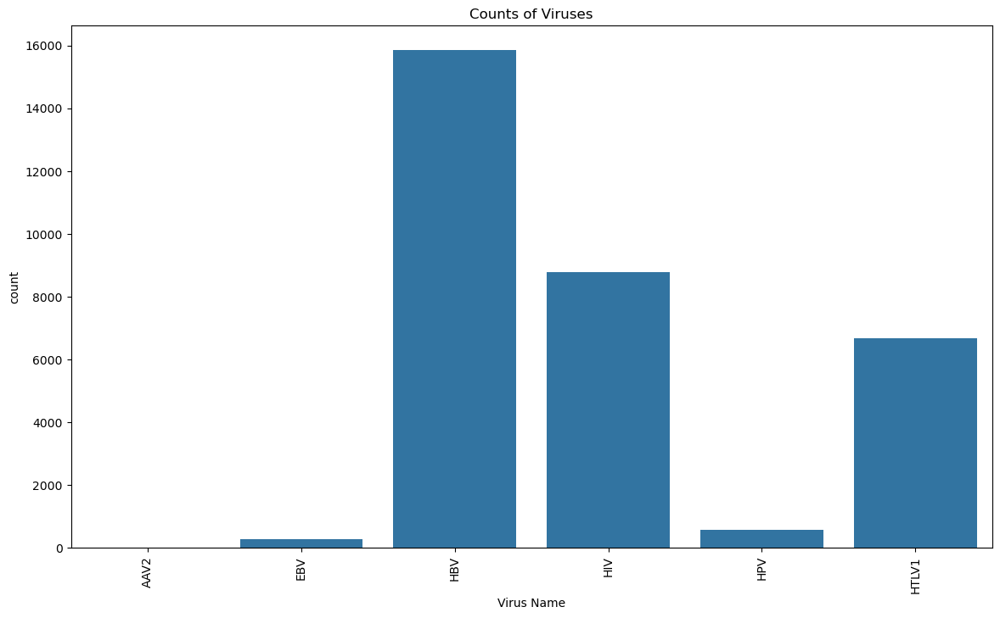

In [152]:
# Visualizatoin of virus as bar plot for visualizing class imbalance 
plt.figure(figsize=(14, 8))
sns.countplot(cleaned_df, x=cleaned_df['Virus Name'])
plt.xticks(rotation=90)
plt.title('Counts of Viruses')
plt.show()

## Pie Chart of Virus Type

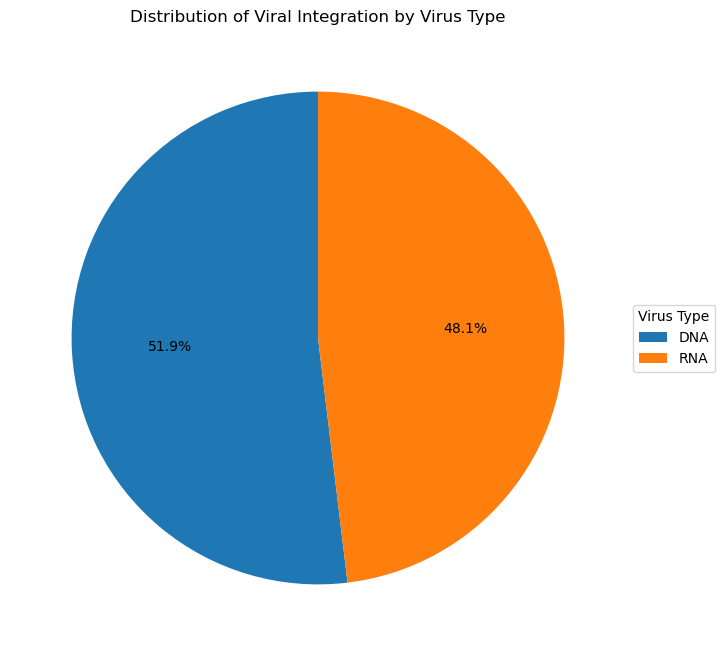

In [153]:
# Pie chart for visualizing the percentage of DNA and RNA virus
virus_type_counts = cleaned_df['Virus Type'].value_counts()

plt.figure(figsize=(8, 8))
patches, texts, autotexts = plt.pie(virus_type_counts, labels=None, autopct='%1.1f%%', startangle=90)
plt.title('Distribution of Viral Integration by Virus Type')
plt.legend(patches, virus_type_counts.index, title="Virus Type", bbox_to_anchor=(1, 0.5), loc='center left')
plt.ylabel('')  
plt.show()

## Countplot of Diseases

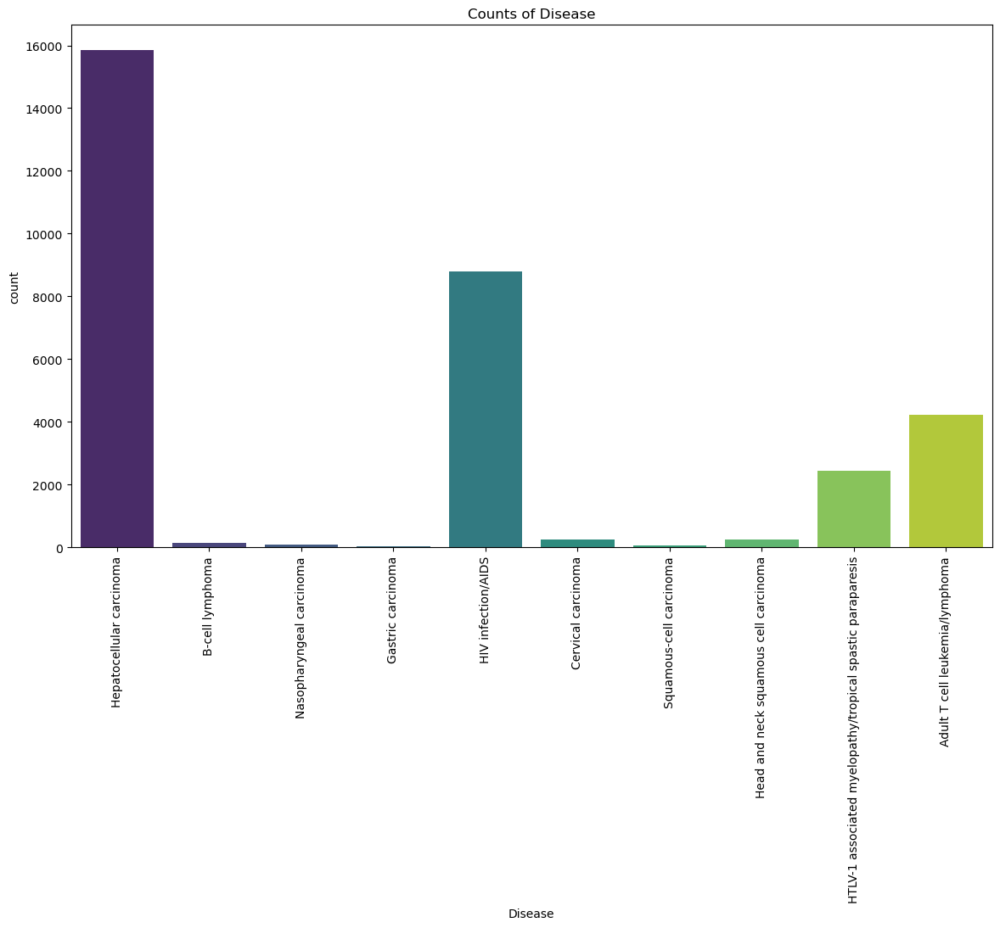

In [154]:
# Visual representation of disease indicating class imbalance
plt.figure(figsize=(14, 8))
sns.countplot(cleaned_df, x=cleaned_df['Disease'], palette='viridis')
plt.xticks(rotation=90)
plt.title('Counts of Disease')
plt.show()

## Distribution of Chromosome

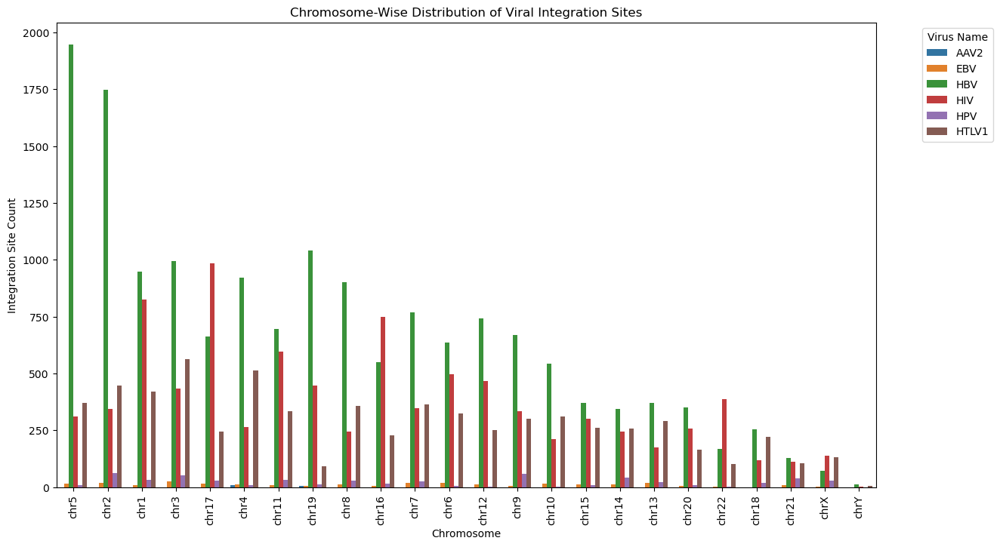

In [155]:
# Hotspot(frequently attacked or chosen to attack by a virus) chromosomes based on virus attacks
plt.figure(figsize=(14, 8))
sns.countplot(data=cleaned_df, x='Chromosome', hue='Virus Name', order=cleaned_df['Chromosome'].value_counts().index)
plt.title('Chromosome-Wise Distribution of Viral Integration Sites')
plt.xlabel('Chromosome')
plt.ylabel('Integration Site Count')
plt.legend(title='Virus Name', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=90)
plt.show()

## Histone Modification Counts By Virus

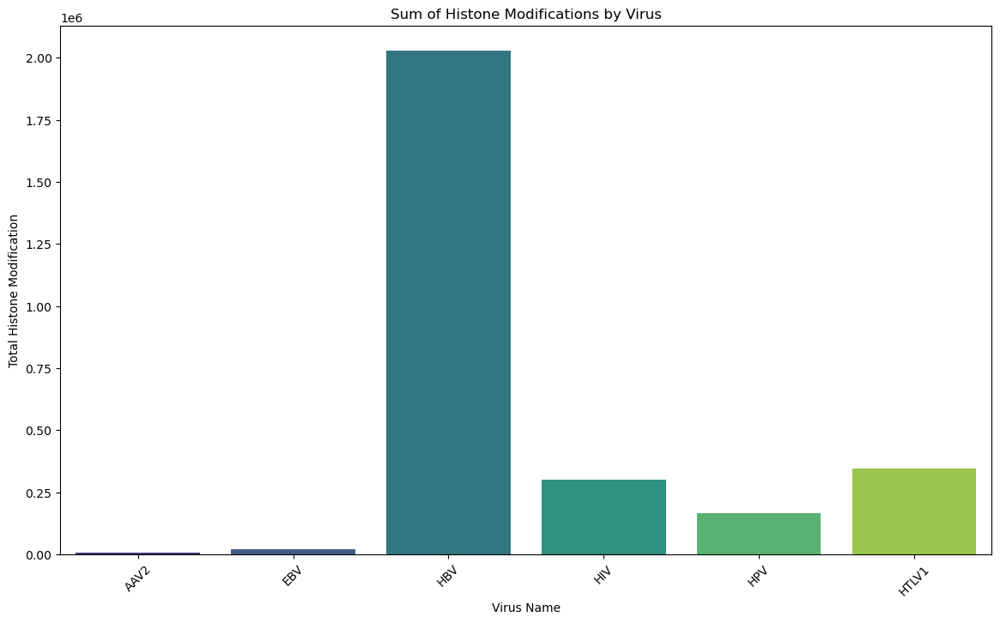

In [156]:
# Visualization of histone modification count by each virus
histone_data = cleaned_df.groupby('Virus Name')['Histone'].sum().reset_index()

plt.figure(figsize=(14, 8))
sns.barplot(data=histone_data, x='Virus Name', y='Histone', palette='viridis')
plt.title('Sum of Histone Modifications by Virus')
plt.xlabel('Virus Name')
plt.ylabel('Total Histone Modification')
plt.xticks(rotation=45)
plt.show()

## Sum Overlaps per Virus

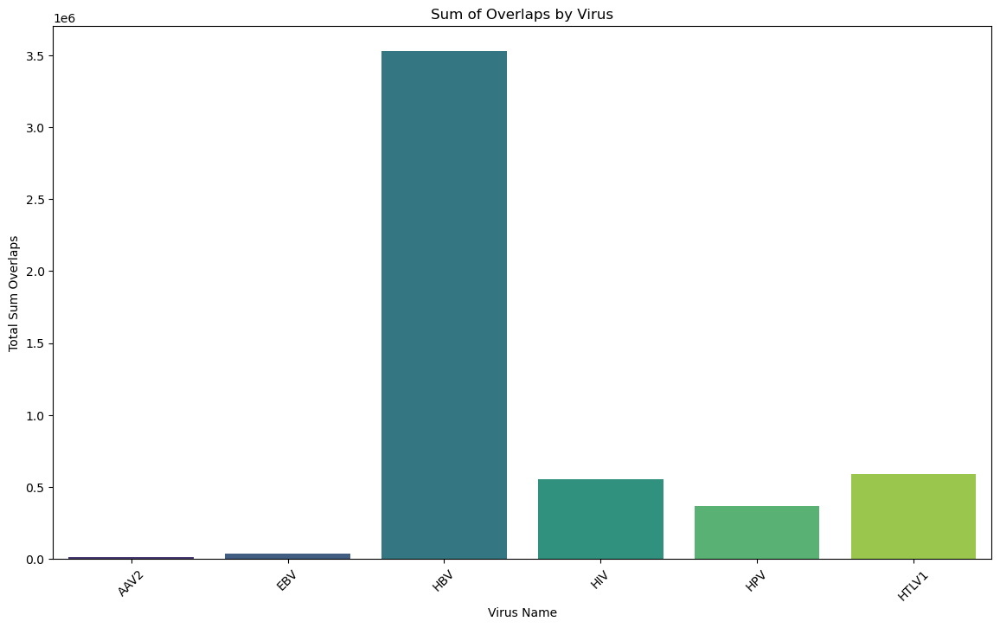

In [157]:
# Visualization of sum overlaps caused by each virus
overlaps_data = cleaned_df.groupby('Virus Name')['Sum Overlaps'].sum().reset_index()

plt.figure(figsize=(14, 8))
sns.barplot(data=overlaps_data, x='Virus Name', y='Sum Overlaps', palette='viridis')
plt.title('Sum of Overlaps by Virus')
plt.xlabel('Virus Name')
plt.ylabel('Total Sum Overlaps')
plt.xticks(rotation=45)
plt.show()

## Distribution of Integration Sites on Chromosomes for All Disease

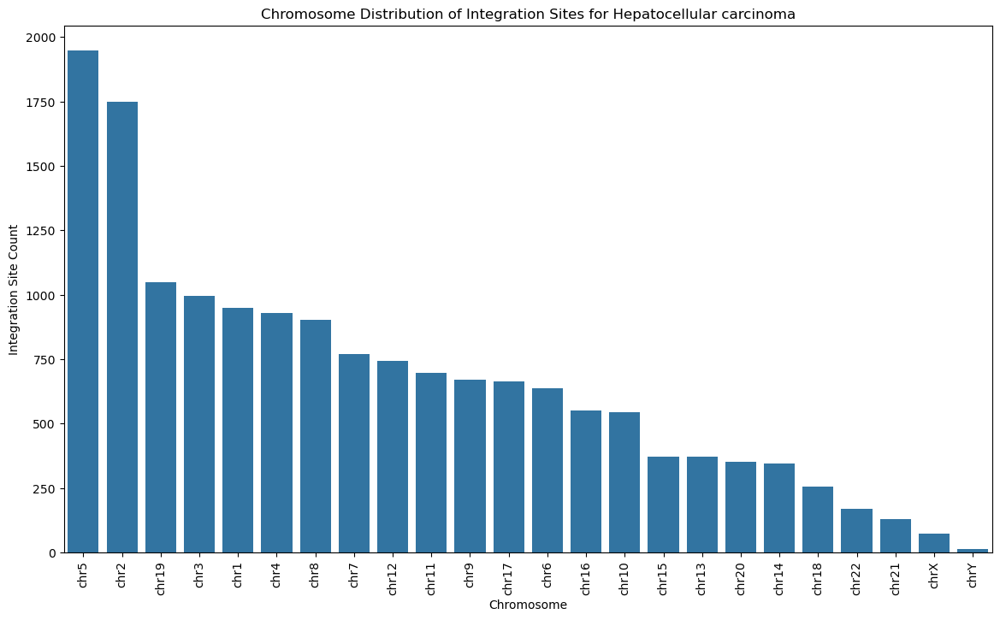

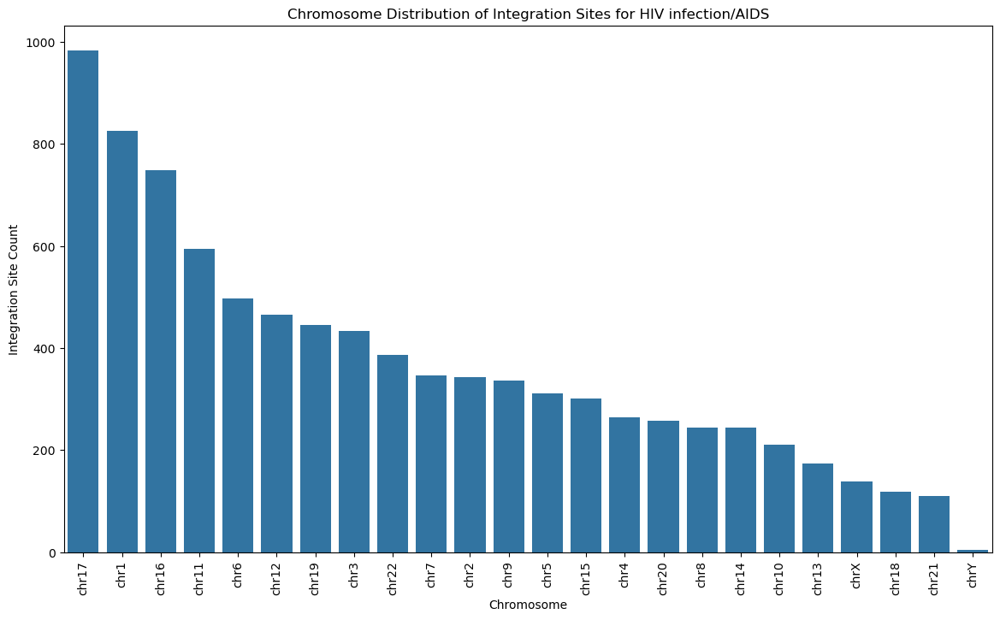

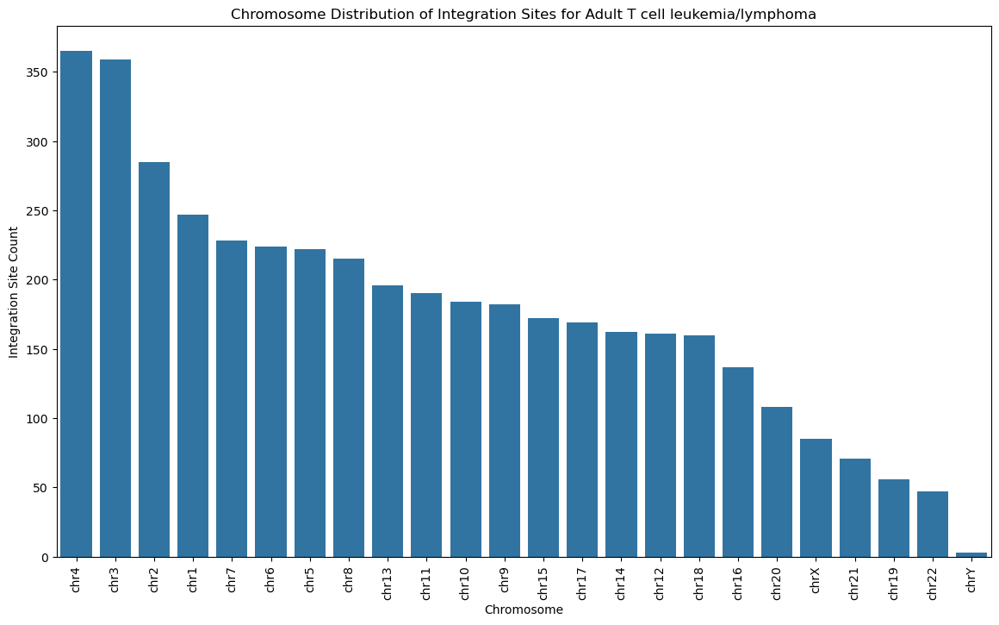

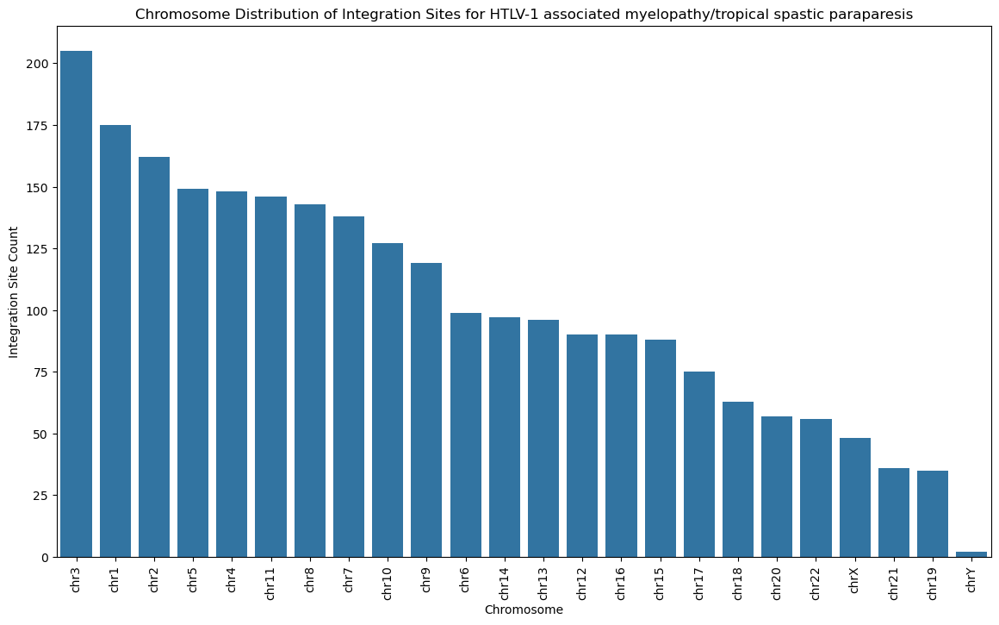

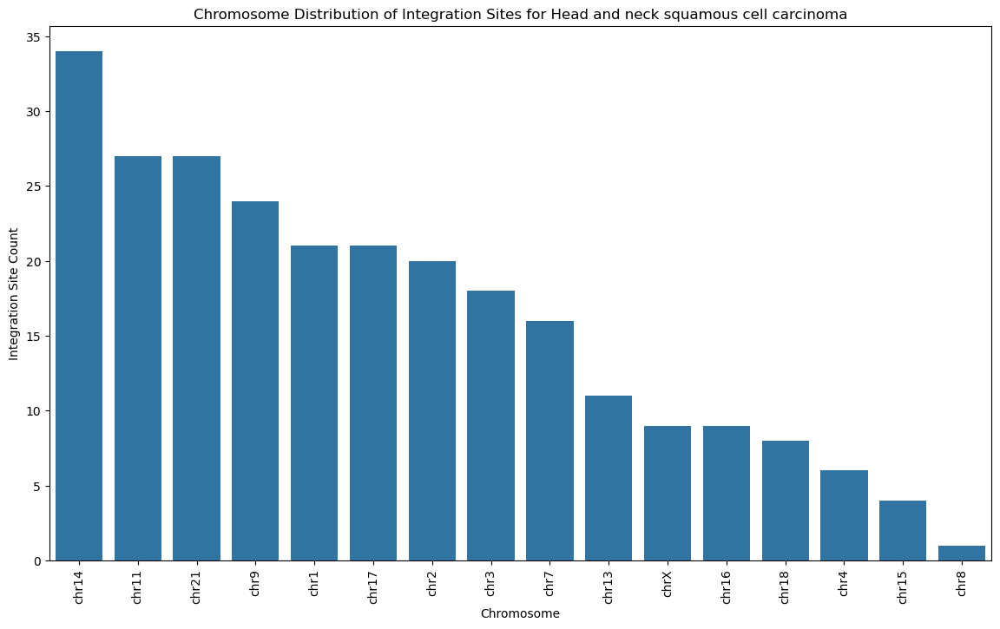

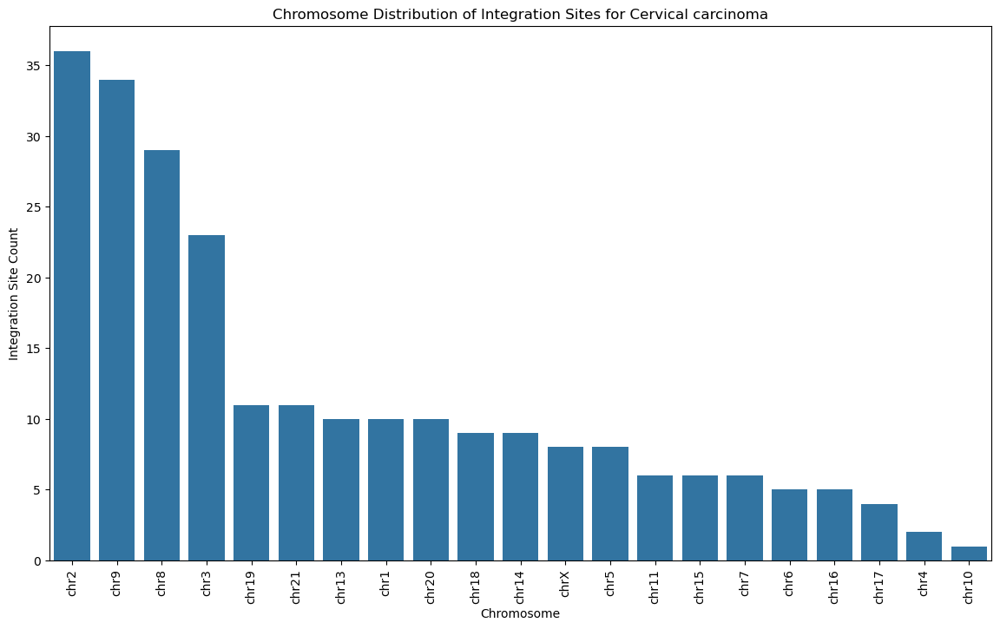

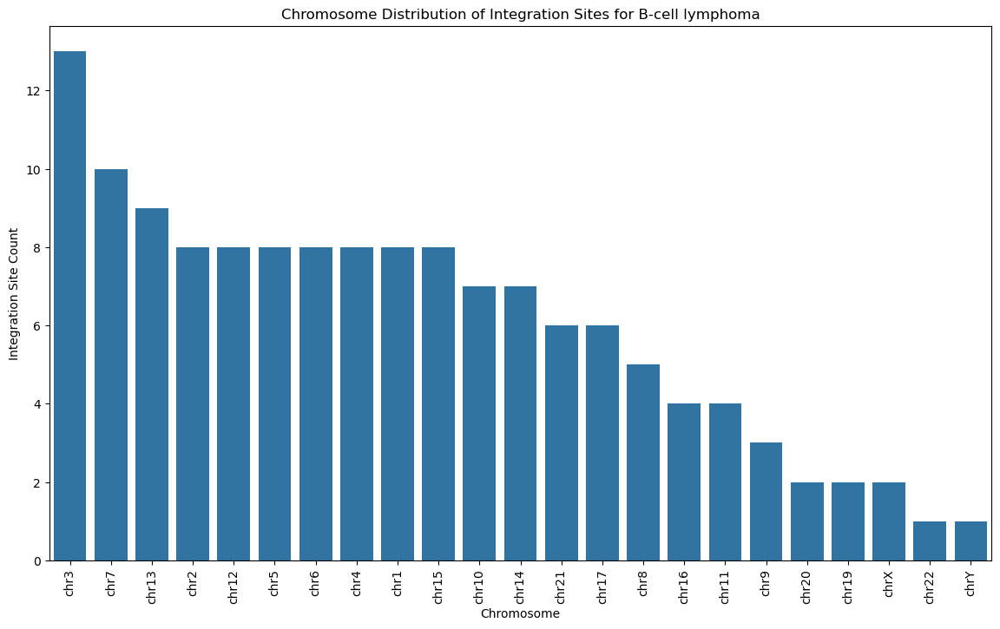

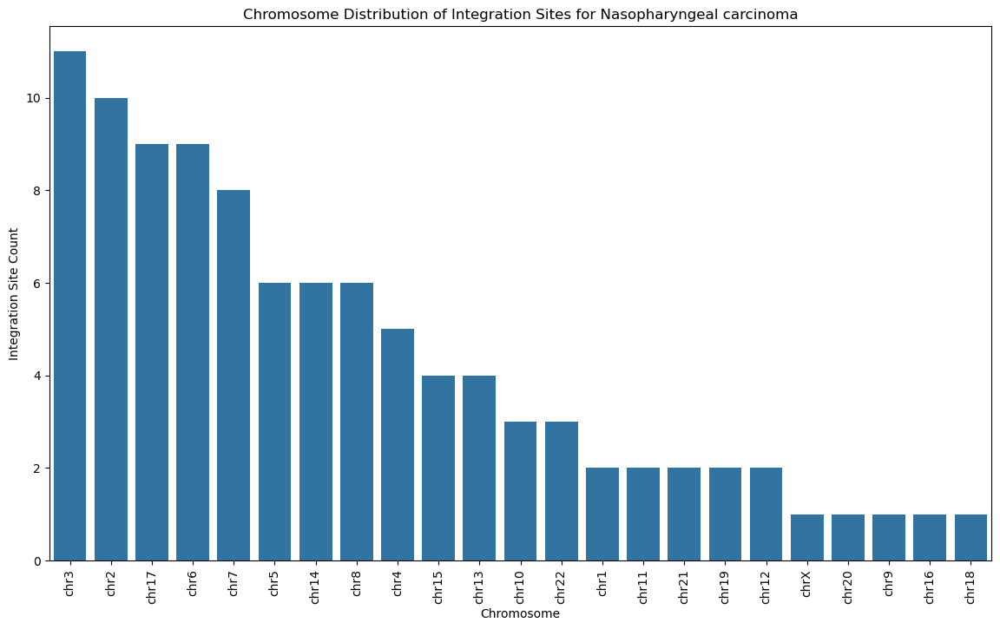

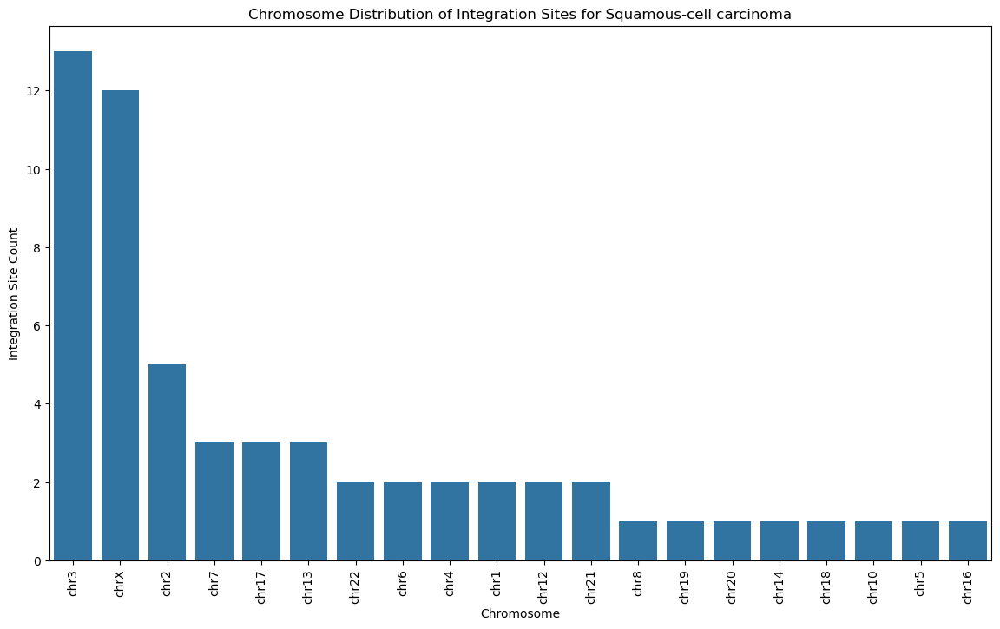

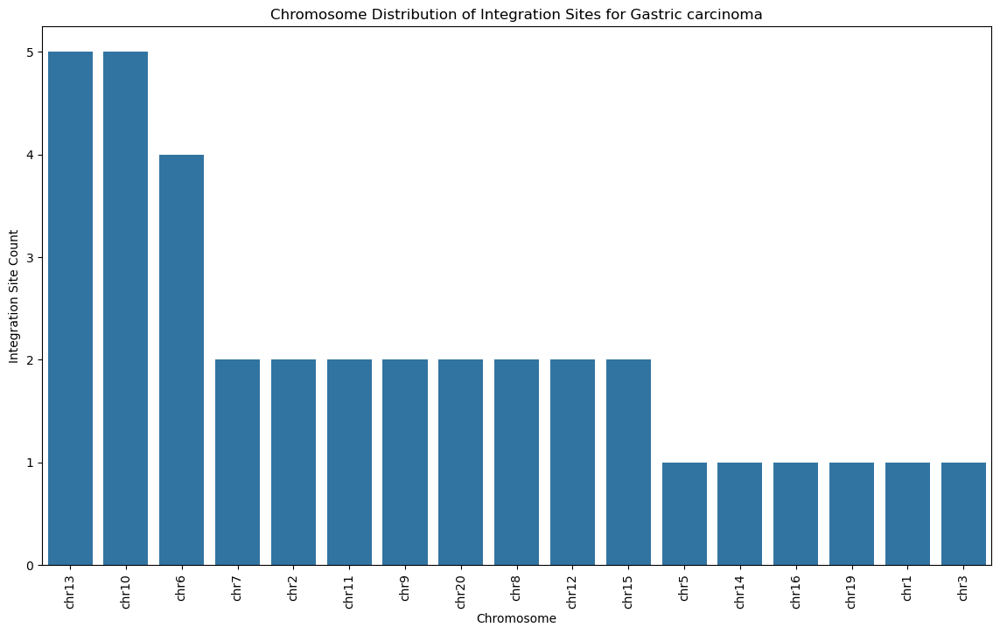

In [158]:
# hotspot chromosomes based on disease
# for each disease which which chromosome was targetted by a virus
all_disease = cleaned_df['Disease'].value_counts().index.to_list()

for disease in all_disease:
    disease_data = cleaned_df[cleaned_df['Disease'] == disease]
    
    plt.figure(figsize=(14, 8))
    sns.countplot(data=disease_data, x='Chromosome', order=disease_data['Chromosome'].value_counts().index)
    plt.title(f'Chromosome Distribution of Integration Sites for {disease}')
    plt.xlabel('Chromosome')
    plt.ylabel('Integration Site Count')
    plt.xticks(rotation=90)
    plt.show()

## Heatmap of Viral Integration Across Chromosomes and Disease

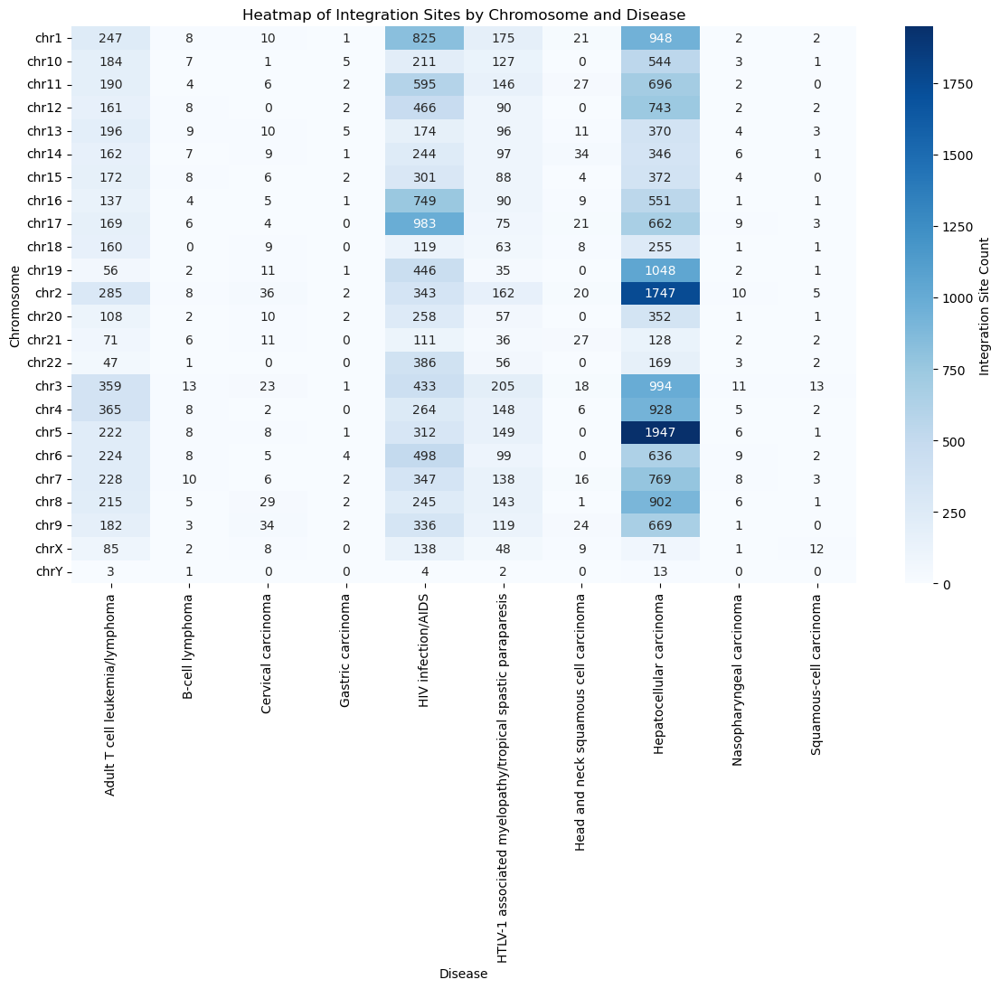

In [159]:
# Heatmap for more compact visualization for the above barplot
heatmap_data = cleaned_df.pivot_table(index='Chromosome', columns='Disease', values='DVID', aggfunc='count', fill_value=0)

plt.figure(figsize=(14, 8))
sns.heatmap(heatmap_data, cmap=sns.color_palette("Blues", as_cmap=True), annot=True, fmt='d', cbar_kws={'label': 'Integration Site Count'})

plt.title('Heatmap of Integration Sites by Chromosome and Disease')
plt.xlabel('Disease')
plt.ylabel('Chromosome')
plt.show()

## Heatmap of Diseases Caused By Virus

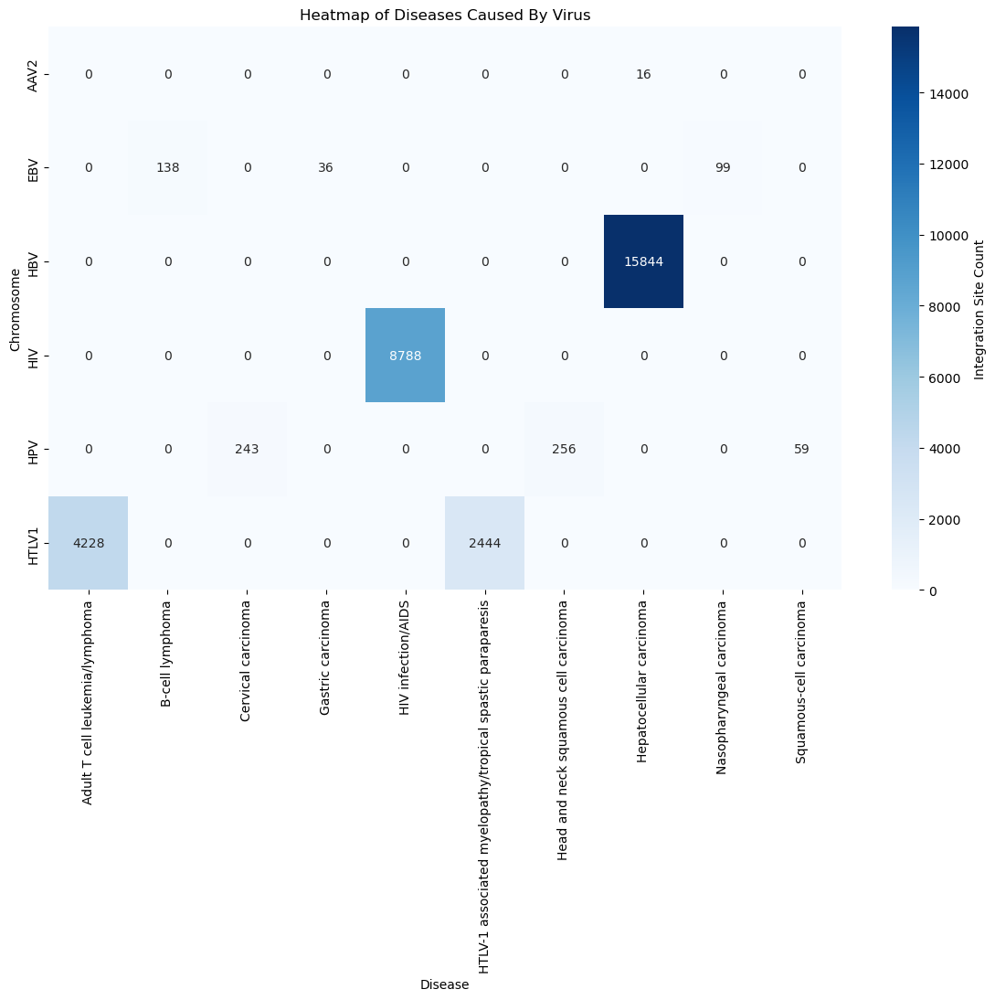

In [160]:
# Heatmap representing virus associated disease
# key point is that a same virus can create multiple diseases or multiple virus can create a single disease
heatmap_data = cleaned_df.pivot_table(index='Virus Name', columns='Disease', values='DVID', aggfunc='count', fill_value=0)

plt.figure(figsize=(14, 8))
sns.heatmap(heatmap_data, cmap=sns.color_palette("Blues", as_cmap=True), annot=True, fmt='d', cbar_kws={'label': 'Integration Site Count'})
plt.title('Heatmap of Diseases Caused By Virus')
plt.xlabel('Disease')
plt.ylabel('Chromosome')
plt.show()

## Pairplot of Histone, Factor, Chromatin Accessibility and Sum Overlaps

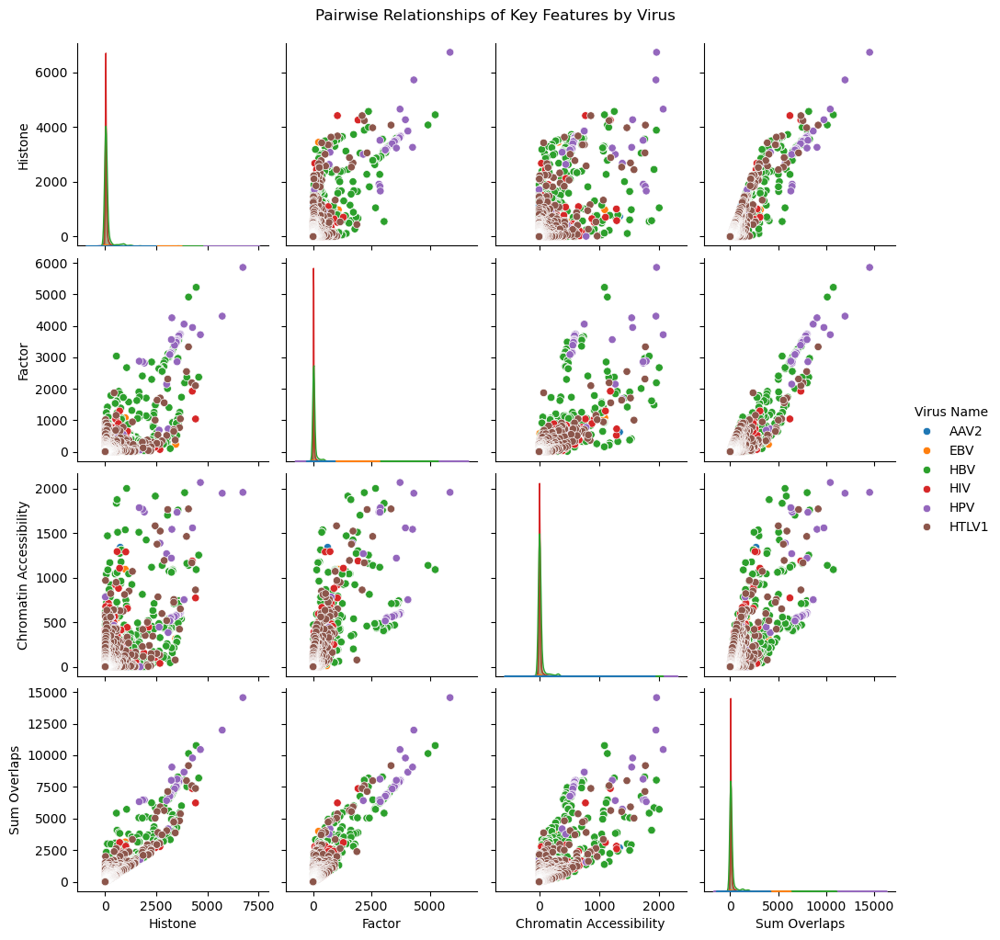

In [161]:
sns.pairplot(cleaned_df, vars=['Histone', 'Factor', 'Chromatin Accessibility', 'Sum Overlaps'], hue='Virus Name')
plt.suptitle('Pairwise Relationships of Key Features by Virus', y=1.02)
plt.show()

## Top Target Genes by Disease

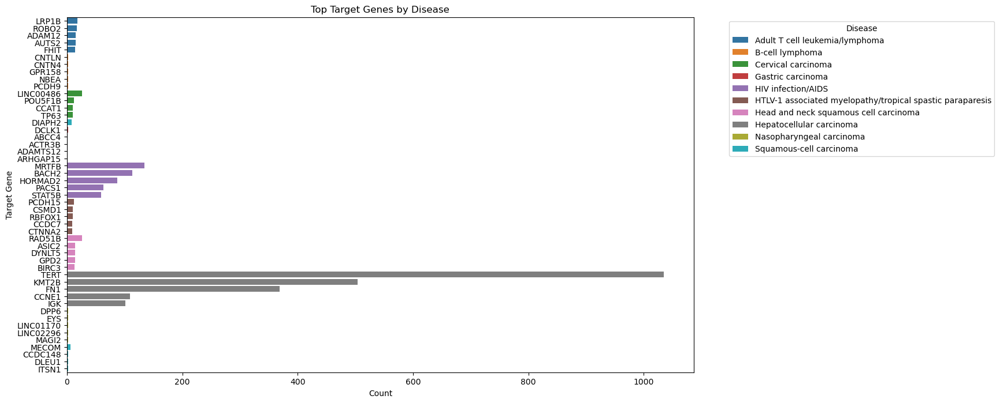

In [162]:
# a visual representation of genes interrupted by viruses
# or virus prefered genes
top_genes = cleaned_df.groupby(['Disease', 'Target Gene']).size().reset_index(name='Count')
top_genes = top_genes.sort_values(['Disease', 'Count'], ascending=[True, False]).groupby('Disease').head(5)

plt.figure(figsize=(14, 8))
sns.barplot(data=top_genes, x='Count', y='Target Gene', hue='Disease', dodge=False)
plt.title('Top Target Genes by Disease')
plt.xlabel('Count')
plt.ylabel('Target Gene')
plt.legend(title='Disease', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## Disease-Specific Stacked Bar Chart

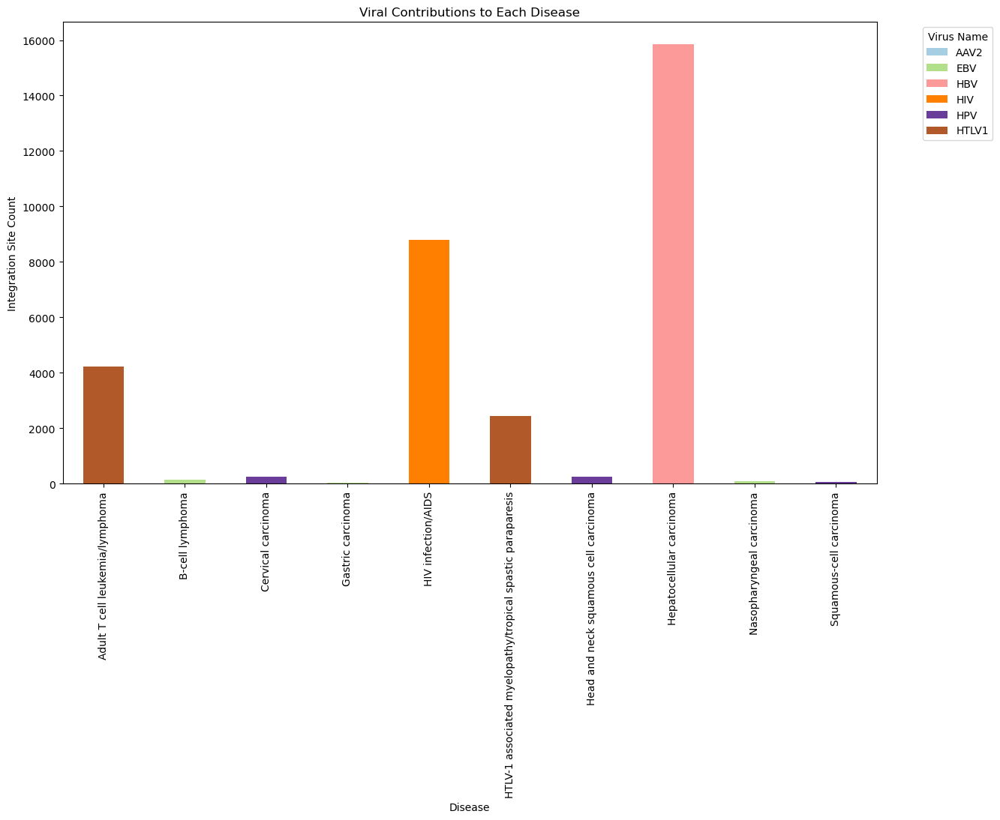

In [163]:
virus_disease_counts = cleaned_df.groupby(['Disease', 'Virus Name']).size().unstack(fill_value=0)

virus_disease_counts.plot(kind='bar', stacked=True, figsize=(14, 8), colormap='Paired')
plt.title('Viral Contributions to Each Disease')
plt.xlabel('Disease')
plt.ylabel('Integration Site Count')
plt.legend(title='Virus Name', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=90)
plt.show()

# Splitting Dataset to Train and Test Set

In [251]:
X = cleaned_df.drop(columns='Disease')
y = cleaned_df['Disease']

In [252]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [253]:
X_train.shape

(25720, 16)

In [254]:
X_test.shape

(6431, 16)

In [255]:
y_train.shape

(25720,)

In [256]:
y_test.shape

(6431,)

# Handling Missing Values

In [257]:
X_train['VISID'].fillna(X_train['VISID'].mode, inplace=True)

In [258]:
X_test['VISID'].fillna(X_train['VISID'].mode, inplace=True)

In [259]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 25720 entries, 5033 to 17874
Data columns (total 16 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   DVID                     25720 non-null  int64 
 1   Reference Human Genome   25720 non-null  object
 2   Chromosome               25720 non-null  object
 3   Begin Location           25720 non-null  int64 
 4   End Location             25720 non-null  int64 
 5   Histone                  25720 non-null  int64 
 6   Factor                   25720 non-null  int64 
 7   Chromatin Accessibility  25720 non-null  int64 
 8   Sum Overlaps             25720 non-null  int64 
 9   VRG                      25720 non-null  object
 10  Sample                   25720 non-null  object
 11  Target Gene              25720 non-null  object
 12  PMID                     25720 non-null  int64 
 13  VISID                    25720 non-null  object
 14  Virus Name               25720 non-null 

In [260]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6431 entries, 51503 to 9682
Data columns (total 16 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   DVID                     6431 non-null   int64 
 1   Reference Human Genome   6431 non-null   object
 2   Chromosome               6431 non-null   object
 3   Begin Location           6431 non-null   int64 
 4   End Location             6431 non-null   int64 
 5   Histone                  6431 non-null   int64 
 6   Factor                   6431 non-null   int64 
 7   Chromatin Accessibility  6431 non-null   int64 
 8   Sum Overlaps             6431 non-null   int64 
 9   VRG                      6431 non-null   object
 10  Sample                   6431 non-null   object
 11  Target Gene              6431 non-null   object
 12  PMID                     6431 non-null   int64 
 13  VISID                    6431 non-null   object
 14  Virus Name               6431 non-null   

# Encoding Categorical Variables

### One Hot Encoding

In [261]:
# categorical_cols = ['VRG', 'Sample', 'Target Gene', 'Virus Name']

# # # Initialize the OneHotEncoder with `sparse=False` to get dense arrays
# one_hot_encoder = OneHotEncoder(sparse_output=False, handle_unknown='error')

# # # Fit and transform the encoder on X_train, then transform X_test
# X_train_encoded = one_hot_encoder.fit_transform(X_train[categorical_cols])
# X_test_encoded = one_hot_encoder.transform(X_test[categorical_cols])

# # Convert the encoded arrays back to DataFrames with proper column names
# X_train_encoded = pd.DataFrame(X_train_encoded, columns=one_hot_encoder.get_feature_names_out(categorical_cols), index=X_train.index)
# X_test_encoded = pd.DataFrame(X_test_encoded, columns=one_hot_encoder.get_feature_names_out(categorical_cols), index=X_test.index)

# # Drop original categorical columns and concatenate encoded columns
# X_train = X_train.drop(categorical_cols, axis=1).join(X_train_encoded)
# X_test = X_test.drop(categorical_cols, axis=1).join(X_test_encoded)

In [262]:
# Label Encoding
cat_cols = ['VRG', 'Sample', 'Target Gene', 'Virus Name']
le_cat = LabelEncoder()
for cols in cat_cols:
    X_train[cols] = le_cat.fit_transform(X_train[cols])
    X_test[cols] = le_cat.transform(X_test[cols])

### Ordinal Encoding

In [263]:
ordinal_encoder = OrdinalEncoder()

X_train['Chromosome'] = ordinal_encoder.fit_transform(X_train[['Chromosome']])
X_test['Chromosome'] = ordinal_encoder.transform(X_test[['Chromosome']])

### Label Encoding

In [264]:
le_cols = ['Virus Type', 'Reference Human Genome']

lebel_encoder_X = LabelEncoder()

for cols in le_cols:
    X_train[cols] = lebel_encoder_X.fit_transform(X_train[cols])
    X_test[cols] = lebel_encoder_X.transform(X_test[cols])

In [265]:
le_target = LabelEncoder()
y_train = le_target.fit_transform(y_train)
y_test = le_target.transform(y_test)

In [266]:
categories = le_target.classes_
print("Mapping of categories to numbers:")
for i, category in enumerate(categories):
    print(f"{i} -> {category}")

Mapping of categories to numbers:
0 -> Adult T cell leukemia/lymphoma
1 -> B-cell lymphoma
2 -> Cervical carcinoma
3 -> Gastric carcinoma
4 -> HIV infection/AIDS
5 -> HTLV-1 associated myelopathy/tropical spastic paraparesis
6 -> Head and neck squamous cell carcinoma
7 -> Hepatocellular carcinoma
8 -> Nasopharyngeal carcinoma
9 -> Squamous-cell carcinoma


# Scaling the Numerical Columns

In [267]:
cleaned_df.describe()

,DVID,Begin Location,End Location,Histone,Factor,Chromatin Accessibility,Sum Overlaps,PMID
count,3.215100e+04,3.215100e+04,3.215100e+04,32151.000000,32151.000000,32151.000000,32151.000000,3.215100e+04
mean,2.954837e+06,7.215359e+07,7.215370e+07,89.187490,44.191129,24.730895,158.109514,2.664651e+07
std,2.046194e+06,5.602639e+07,5.602641e+07,349.032991,239.465789,118.410274,643.536539,2.440668e+06
min,1.000054e+06,1.013700e+04,1.013800e+04,0.000000,0.000000,0.000000,0.000000,1.284374e+07
25%,1.009109e+06,2.982405e+07,2.982405e+07,2.000000,0.000000,0.000000,4.000000,2.473596e+07
50%,3.000810e+06,6.107618e+07,6.107626e+07,9.000000,2.000000,0.000000,16.000000,2.770315e+07
75%,4.015042e+06,1.053185e+08,1.053185e+08,34.000000,11.000000,3.000000,58.000000,2.770315e+07
max,6.032669e+06,2.486886e+08,2.486886e+08,6736.000000,5862.000000,2070.000000,14557.000000,3.106473e+07


In [268]:
X_train.columns

Index(['DVID', 'Reference Human Genome', 'Chromosome', 'Begin Location',
       'End Location', 'Histone', 'Factor', 'Chromatin Accessibility',
       'Sum Overlaps', 'VRG', 'Sample', 'Target Gene', 'PMID', 'VISID',
       'Virus Name', 'Virus Type'],
      dtype='object')

In [269]:
## Handling 0s for chromatin, sum overlaps, begin location etc...
col_with_zero = ['Histone', 'Factor', 'Chromatin Accessibility', 'Sum Overlaps']
def cols_mean(cols):
    for col in cols:
        print(X_train[col].mean())

def cols_median(cols):
    for col in cols:
        print(X_train[col].median())

def cols_mode(cols):
    for col in cols:
        m = X_train[col].mode()
        print(m)

In [270]:
print('Mean: ')
cols_mean(col_with_zero)

Mean: 
88.61800155520996
43.58417573872473
24.80898133748056
157.01115863141524


In [271]:
print('Median: ')
cols_median(col_with_zero)

Median: 
9.0
2.0
0.0
16.0


In [272]:
print('Mode: ')
cols_mode(col_with_zero)

Mode: 
0    0
Name: Histone, dtype: int64
0    0
Name: Factor, dtype: int64
0    0
Name: Chromatin Accessibility, dtype: int64
0    0
Name: Sum Overlaps, dtype: int64


In [273]:
for col in col_with_zero:
    mean = X_train[col].mean()
    X_train[col]=np.where(X_train[col]==0, mean,X_train[col])
    X_test[col]=np.where(X_test[col]==0, mean, X_test[col])

In [274]:
X_train.describe()

,DVID,Reference Human Genome,Chromosome,Begin Location,End Location,Histone,Factor,Chromatin Accessibility,Sum Overlaps,VRG,Sample,Target Gene,PMID,Virus Name,Virus Type
count,2.572000e+04,25720.0,25720.000000,2.572000e+04,2.572000e+04,25720.000000,25720.000000,25720.000000,25720.000000,25720.000000,25720.000000,25720.000000,2.572000e+04,25720.000000,25720.000000
mean,2.954778e+06,0.0,10.930288,7.218478e+07,7.218488e+07,100.153502,55.620661,39.939373,168.567229,21.367691,1.826128,1514.245684,2.664031e+07,2.920918,0.480832
std,2.046092e+06,0.0,6.646256,5.617909e+07,5.617912e+07,342.285213,231.676928,115.845654,631.412675,11.755625,1.400600,873.195641,2.443813e+06,1.171700,0.499642
min,1.000054e+06,0.0,0.000000,1.013700e+04,1.013800e+04,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.284374e+07,0.000000,0.000000
25%,1.009165e+06,0.0,5.000000,2.982403e+07,2.982405e+07,5.000000,3.000000,17.000000,6.000000,8.000000,0.000000,783.750000,2.420144e+07,2.000000,0.000000
50%,3.000812e+06,0.0,11.000000,6.102863e+07,6.102864e+07,17.000000,14.000000,24.808981,22.000000,29.000000,2.000000,1494.000000,2.770315e+07,2.000000,0.000000
75%,4.015060e+06,0.0,17.000000,1.057225e+08,1.057225e+08,88.618002,43.584176,24.808981,103.000000,30.000000,3.000000,2293.000000,2.770315e+07,3.000000,1.000000
max,6.032668e+06,0.0,23.000000,2.486886e+08,2.486886e+08,5726.000000,5227.000000,2070.000000,11986.000000,35.000000,5.000000,3022.000000,3.106473e+07,5.000000,1.000000


In [275]:
X_train.drop('VISID', axis=1, inplace=True)
X_test.drop('VISID', axis=1, inplace=True)

scaler = MinMaxScaler()
X_train[X_train.columns] = scaler.fit_transform(X_train[X_train.columns])
X_test[X_train.columns] = scaler.transform(X_test[X_train.columns])

In [276]:
X_train.describe()

,DVID,Reference Human Genome,Chromosome,Begin Location,End Location,Histone,Factor,Chromatin Accessibility,Sum Overlaps,VRG,Sample,Target Gene,PMID,Virus Name,Virus Type
count,25720.000000,25720.0,25720.000000,25720.000000,25720.000000,25720.000000,25720.000000,25720.000000,25720.000000,25720.000000,25720.000000,25720.000000,25720.000000,25720.000000,25720.000000
mean,0.388411,0.0,0.475230,0.290233,0.290233,0.017319,0.010452,0.018820,0.013981,0.610505,0.365226,0.501074,0.757180,0.584184,0.480832
std,0.406566,0.0,0.288968,0.225911,0.225911,0.059788,0.044332,0.055991,0.052684,0.335875,0.280120,0.288946,0.134121,0.234340,0.499642
min,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.001810,0.0,0.217391,0.119889,0.119889,0.000699,0.000383,0.007733,0.000417,0.228571,0.000000,0.259348,0.623331,0.400000,0.000000
50%,0.397559,0.0,0.478261,0.245371,0.245371,0.002795,0.002488,0.011507,0.001752,0.828571,0.400000,0.494375,0.815510,0.400000,0.000000
75%,0.599093,0.0,0.739130,0.425096,0.425096,0.015304,0.008149,0.011507,0.008511,0.857143,0.600000,0.758769,0.815510,0.600000,1.000000
max,1.000000,0.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


# Models Without Feature Selection Methods

In [277]:
X_train_wfs = X_train.copy()
X_test_wfs = X_test.copy()

In [278]:
X_train_wfs.drop(['DVID', 'PMID'], axis=True, inplace=True)
X_test_wfs.drop(['DVID', 'PMID'], axis=True, inplace=True)

In [315]:
estimator = []
estimator.append(('XGB', XGBClassifier()))
estimator.append(('DecisionTree', DecisionTreeClassifier(random_state=42)))
estimator.append(('KNN', KNeighborsClassifier()))
estimator.append(('SVC', SVC(probability=True)))
estimator.append(('LogisticRegression', LogisticRegression(random_state=42)))
estimator.append(("GaussianNB", GaussianNB()))

In [316]:
models = {
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "Random Forest": RandomForestClassifier(random_state=42),
    "XGBoost": XGBClassifier(random_state=42),
    "KNN": KNeighborsClassifier(),
    "Logistic Regression": LogisticRegression(random_state=42),
    "GaussianNB": GaussianNB(),
    "SVC": SVC(probability=True),
    "AdaBoost": AdaBoostClassifier(random_state=42),
    "ZeroR": DummyClassifier(strategy="most_frequent", random_state=42),
    "Hard_Vote": VotingClassifier(estimators=estimator, voting="hard"),
    "Soft_Vote": VotingClassifier(estimators=estimator, voting="soft")
}

In [317]:
results = {}

for name, model in models.items():
    print(f"Training {name}...")
    model.fit(X_train_wfs, y_train)  
    predictions = model.predict(X_test_wfs)  
    
    accuracy = accuracy_score(y_test, predictions)
    report = classification_report(y_test, predictions, output_dict=True) 
    
    results[name] = {
        "Accuracy": accuracy,
        "Precision": report["weighted avg"]["precision"],
        "Recall": report["weighted avg"]["recall"],
        "F1-Score": report["weighted avg"]["f1-score"]
    }
    print(f"{name} completed.")

Training Decision Tree...
Decision Tree completed.
Training Random Forest...
Random Forest completed.
Training XGBoost...
XGBoost completed.
Training KNN...
KNN completed.
Training Logistic Regression...
Logistic Regression completed.
Training GaussianNB...
GaussianNB completed.
Training SVC...
SVC completed.
Training AdaBoost...
AdaBoost completed.
Training ZeroR...
ZeroR completed.
Training Hard_Vote...
Hard_Vote completed.
Training Soft_Vote...
Soft_Vote completed.


In [318]:
print("{:<20} {:<10} {:<10} {:<10} {:<10}".format("Model", "Accuracy", "Precision", "Recall", "F1-Score"))
print("-" * 60)

for model_name, metrics in results.items():
    print("{:<20} {:<10.4f} {:<10.4f} {:<10.4f} {:<10.4f}".format(
        model_name,
        metrics["Accuracy"],
        metrics["Precision"],
        metrics["Recall"],
        metrics["F1-Score"]
    ))

Model                Accuracy   Precision  Recall     F1-Score  
------------------------------------------------------------
Decision Tree        0.9112     0.9114     0.9112     0.9113    
Random Forest        0.9170     0.9106     0.9170     0.9096    
XGBoost              0.9165     0.9121     0.9165     0.9127    
KNN                  0.9036     0.8971     0.9036     0.8986    
Logistic Regression  0.9087     0.8526     0.9087     0.8743    
GaussianNB           0.9093     0.8990     0.9093     0.8852    
SVC                  0.9132     0.8647     0.9132     0.8815    
AdaBoost             0.8981     0.8253     0.8981     0.8561    
ZeroR                0.4932     0.2433     0.4932     0.3258    
Hard_Vote            0.9177     0.8824     0.9177     0.8882    
Soft_Vote            0.9187     0.9103     0.9187     0.9036    


In [336]:
import os

plot_folder = "plots"
os.makedirs(plot_folder, exist_ok=True)

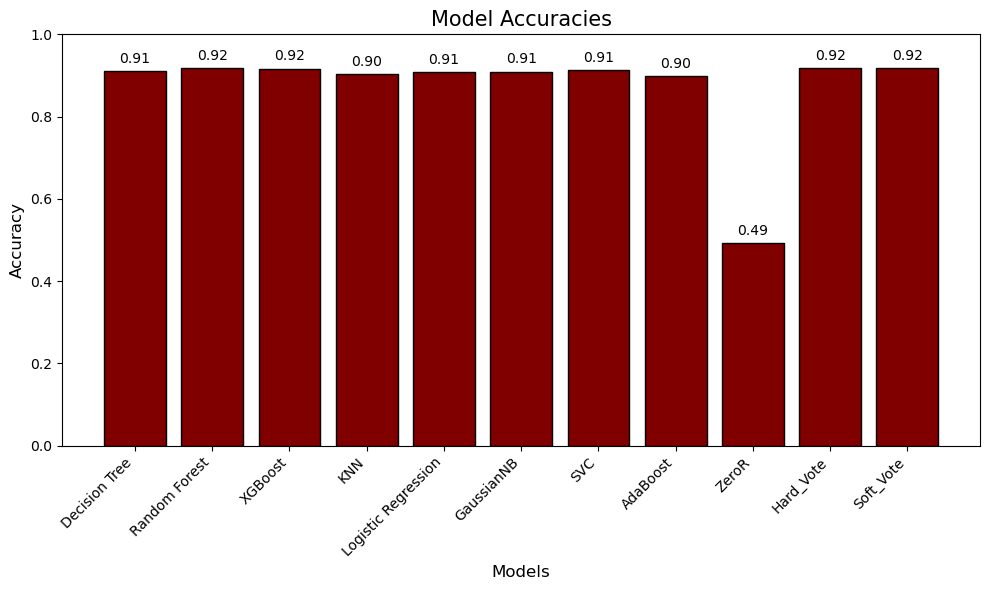

In [338]:
model_names = list(results.keys())
accuracies = [metrics["Accuracy"] for metrics in results.values()]

plt.figure(figsize=(10, 6))
plt.bar(model_names, accuracies, color='maroon', edgecolor='black')

plt.xlabel("Models", fontsize=12)
plt.ylabel("Accuracy", fontsize=12)
plt.title("Model Accuracies", fontsize=15)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.ylim(0, 1)

for i, accuracy in enumerate(accuracies):
    plt.text(i, accuracy + 0.02, f"{accuracy:.2f}", ha='center', fontsize=10)

plt.tight_layout()
file_path = os.path.join(plot_folder, "accuracy_plot_without_feature_selection.png")
plt.savefig(file_path)
plt.show()

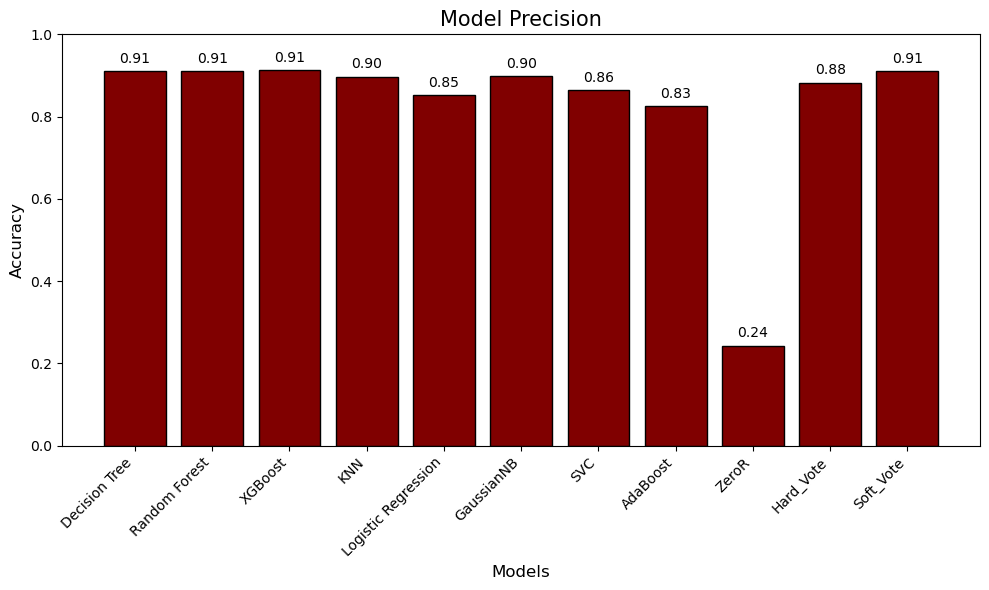

In [339]:
model_names = list(results.keys())
accuracies = [metrics["Precision"] for metrics in results.values()]

plt.figure(figsize=(10, 6))
plt.bar(model_names, accuracies, color='maroon', edgecolor='black')

plt.xlabel("Models", fontsize=12)
plt.ylabel("Accuracy", fontsize=12)
plt.title("Model Precision", fontsize=15)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.ylim(0, 1)

for i, accuracy in enumerate(accuracies):
    plt.text(i, accuracy + 0.02, f"{accuracy:.2f}", ha='center', fontsize=10)

plt.tight_layout()
file_path = os.path.join(plot_folder, "precision_plot_without_feature_selection.png")
plt.savefig(file_path)
plt.show()

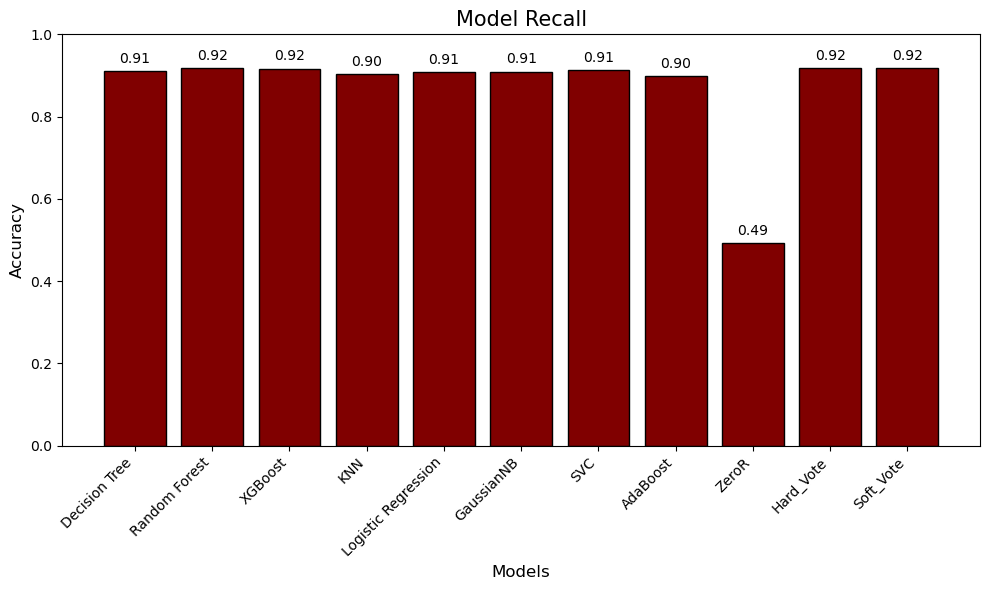

In [340]:
model_names = list(results.keys())
accuracies = [metrics["Recall"] for metrics in results.values()]

plt.figure(figsize=(10, 6))
plt.bar(model_names, accuracies, color='maroon', edgecolor='black')

plt.xlabel("Models", fontsize=12)
plt.ylabel("Accuracy", fontsize=12)
plt.title("Model Recall", fontsize=15)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.ylim(0, 1)

for i, accuracy in enumerate(accuracies):
    plt.text(i, accuracy + 0.02, f"{accuracy:.2f}", ha='center', fontsize=10)

plt.tight_layout()
file_path = os.path.join(plot_folder, "recall_plot_without_feature_selection.png")
plt.savefig(file_path)
plt.show()

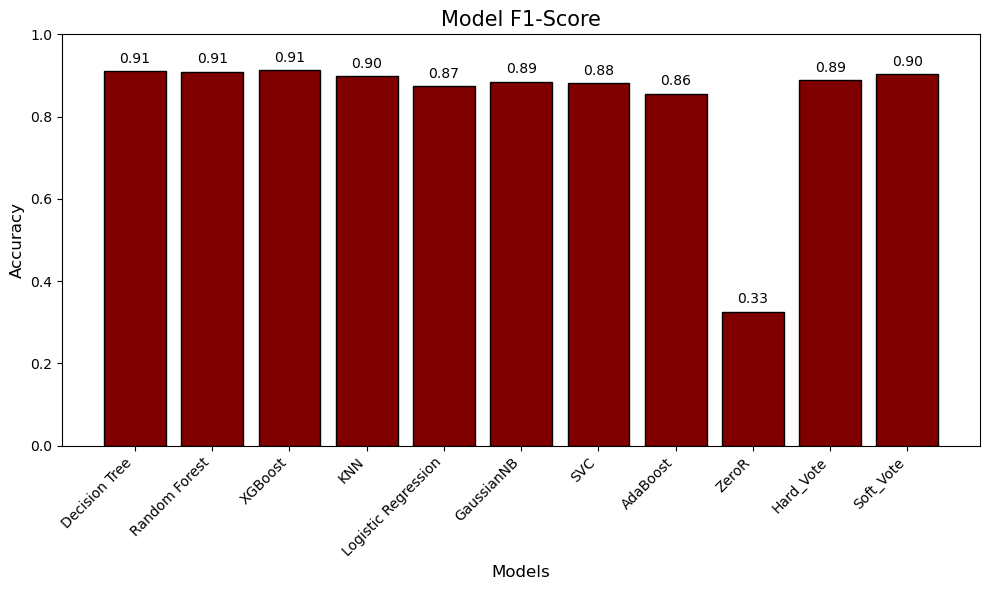

In [341]:
model_names = list(results.keys())
accuracies = [metrics["F1-Score"] for metrics in results.values()]

plt.figure(figsize=(10, 6))
plt.bar(model_names, accuracies, color='maroon', edgecolor='black')

plt.xlabel("Models", fontsize=12)
plt.ylabel("Accuracy", fontsize=12)
plt.title("Model F1-Score", fontsize=15)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.ylim(0, 1)

for i, accuracy in enumerate(accuracies):
    plt.text(i, accuracy + 0.02, f"{accuracy:.2f}", ha='center', fontsize=10)

plt.tight_layout()
file_path = os.path.join(plot_folder, "f1_score_plot_without_feature_selection.png")
plt.savefig(file_path)
plt.show()

# Feature Selection

In [287]:
X_train.drop(['PMID', 'DVID'], axis=1, inplace=True)
X_test.drop(['PMID', 'DVID'], axis=1, inplace=True)

## Mutual Info

In [288]:
mutual_inf = mutual_info_classif(X_train, y_train)

In [289]:
mutual_inf

array([0.        , 0.05973698, 0.46273475, 0.46335215, 0.04123572,
       0.0302649 , 0.02487171, 0.04886205, 0.73121266, 0.75632581,
       0.48294968, 1.14167593, 0.68893027])

In [290]:
mutual_inf = pd.Series(mutual_inf)
mutual_inf.index = X_train.columns
mutual_inf.sort_values(ascending=False)

Virus Name                 1.141676
Sample                     0.756326
VRG                        0.731213
Virus Type                 0.688930
Target Gene                0.482950
End Location               0.463352
Begin Location             0.462735
Chromosome                 0.059737
Sum Overlaps               0.048862
Histone                    0.041236
Factor                     0.030265
Chromatin Accessibility    0.024872
Reference Human Genome     0.000000
dtype: float64

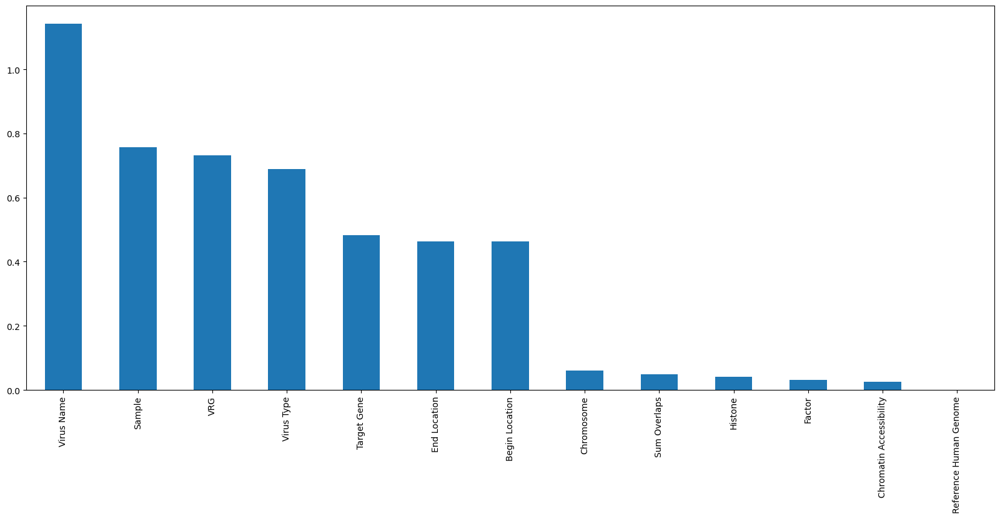

In [291]:
plt.figure(figsize = (20, 8))
mutual_inf.sort_values(ascending = False).plot.bar();

## Correlation

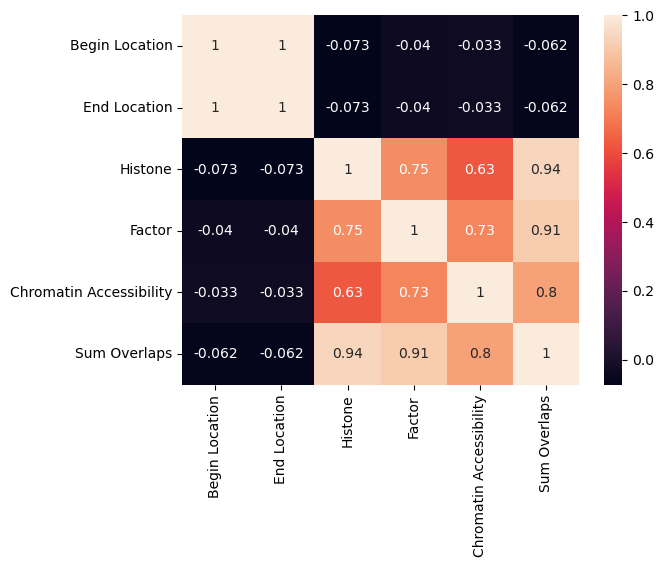

<Figure size 1000x800 with 0 Axes>

In [292]:
selected_cols = ['Begin Location', 'End Location', 'Histone', 'Factor', 'Chromatin Accessibility', 'Sum Overlaps']             
temp = X_train[selected_cols]
corr_matrix = temp.corr()
sns.heatmap(corr_matrix, annot=True)
plt.figure(figsize=(10, 8))
plt.show()

<Axes: >

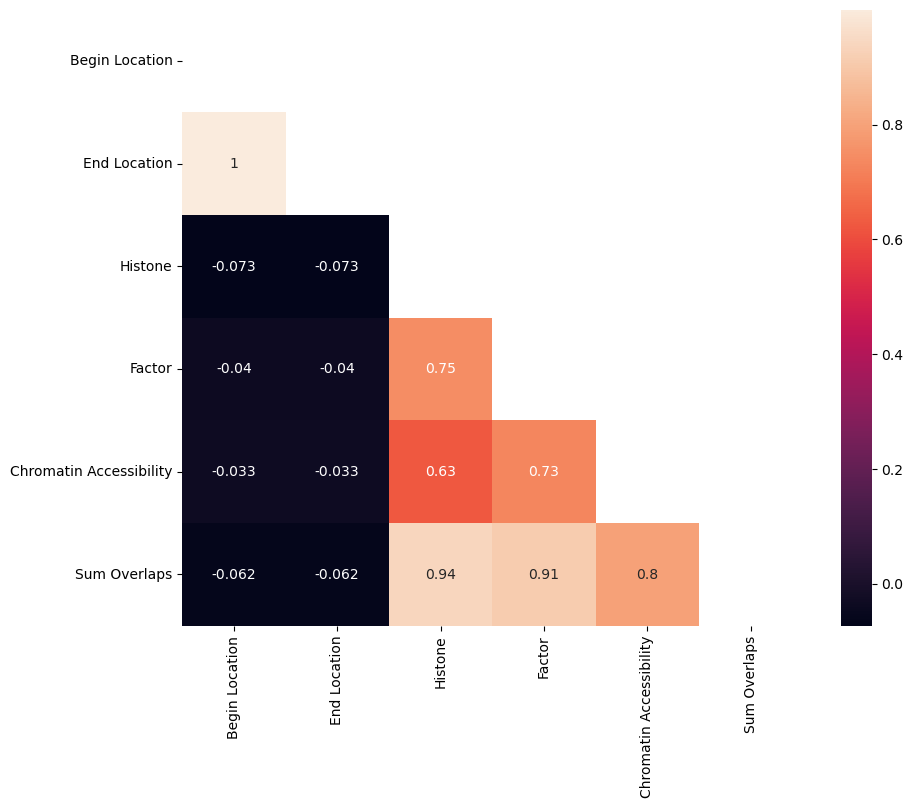

In [293]:
mask1 = np.triu(np.ones_like(corr_matrix, dtype=bool))
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, mask=mask1)

In [294]:
def correlation(dataset, threshold):
    col_corr = set() # Set of all the names of the redundant columns
    corr_matrix = dataset.corr(numeric_only=True)
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if(abs(corr_matrix.iloc[i, j])) > threshold:
                colname = corr_matrix.columns[i]
                col_corr.add(colname)
    return col_corr

In [295]:
corr_features = correlation(X_train, 0.85) 
print(len(corr_features))
print(corr_features)

2
{'Sum Overlaps', 'End Location'}


## Variance Threshold

In [296]:
var_thresh = VarianceThreshold(threshold=0.1) # by default the threshold = 0
var_thresh.fit(X_train)

VarianceThreshold(threshold=0.1)

In [297]:
var_thresh.get_support()

array([False, False, False, False, False, False, False, False,  True,
       False, False, False,  True])

In [298]:
print("All features: ", X_train.columns)
print("Features Selected: ", X_train.columns[var_thresh.get_support()])

All features:  Index(['Reference Human Genome', 'Chromosome', 'Begin Location',
       'End Location', 'Histone', 'Factor', 'Chromatin Accessibility',
       'Sum Overlaps', 'VRG', 'Sample', 'Target Gene', 'Virus Name',
       'Virus Type'],
      dtype='object')
Features Selected:  Index(['VRG', 'Virus Type'], dtype='object')


## RFECV

In [299]:
rfc = RandomForestClassifier(random_state=101)
rfecv = RFECV(estimator=rfc, step=1, cv=StratifiedKFold(5), scoring='accuracy')
rfecv.fit(X_train, y_train)

RFECV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
      estimator=RandomForestClassifier(random_state=101), scoring='accuracy')

In [300]:
print('Optimal number of features: {}'.format(rfecv.n_features_))

Optimal number of features: 12


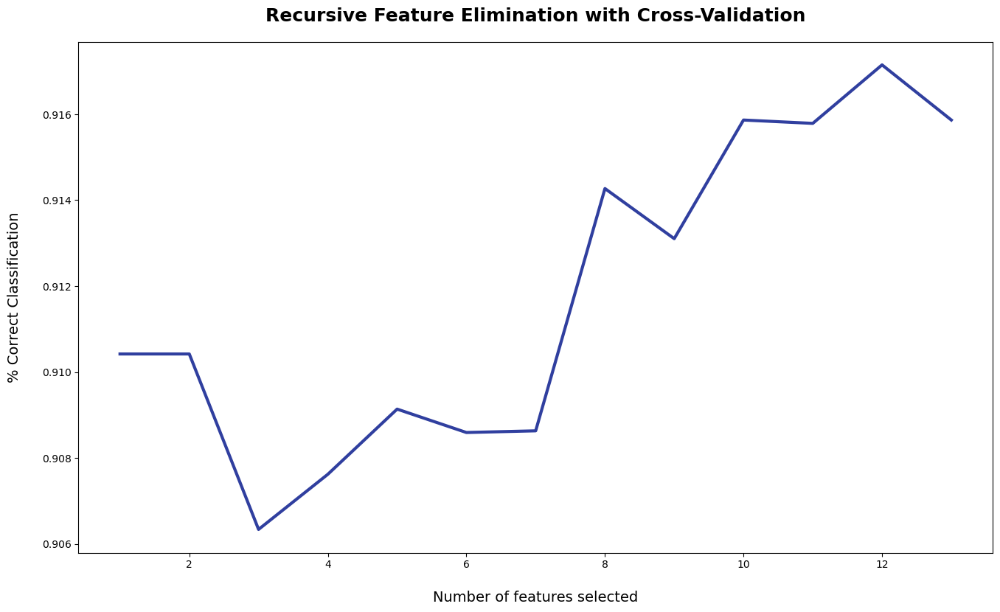

In [301]:
plt.figure(figsize=(16, 9))
plt.title('Recursive Feature Elimination with Cross-Validation', fontsize=18, fontweight='bold', pad=20)
plt.xlabel('Number of features selected', fontsize=14, labelpad=20)
plt.ylabel('% Correct Classification', fontsize=14, labelpad=20)
plt.plot(range(1, len(rfecv.cv_results_['mean_test_score']) + 1), rfecv.cv_results_['mean_test_score'], color='#303F9F', linewidth=3)
plt.show()

In [302]:
print(np.where(rfecv.support_ == False)[0])

[0]


In [303]:
selected_features = X_train.drop(X_train.columns[np.where(rfecv.support_ == False)[0]], axis=1)

In [304]:
rfecv.estimator_.feature_importances_

array([0.01973437, 0.03230377, 0.03156814, 0.01886299, 0.01483726,
       0.01086236, 0.02016899, 0.08846005, 0.15589797, 0.02892906,
       0.4081487 , 0.17022633])

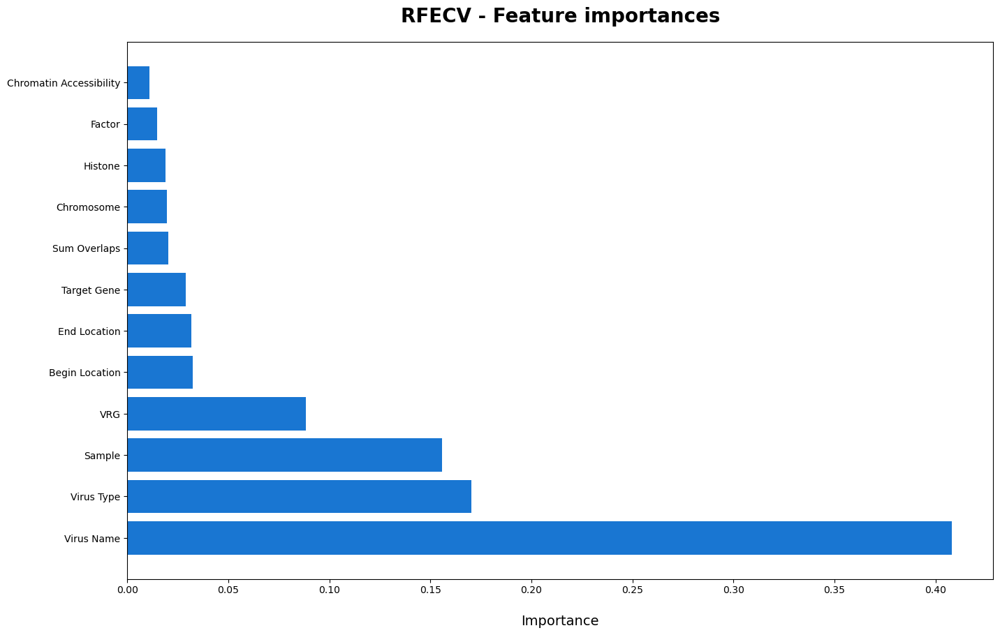

In [305]:
dset = pd.DataFrame()
dset['attr'] = selected_features.columns
dset['importance'] = rfecv.estimator_.feature_importances_
dset = dset.sort_values(by='importance', ascending=False)

plt.figure(figsize=(16, 10))
plt.barh(y=dset['attr'], width=dset['importance'], color='#1976D2')
plt.title('RFECV - Feature importances', fontsize=20, fontweight='bold', pad=20)
plt.xlabel('Importance', fontsize=14, labelpad=20)
plt.show()


In [306]:
X_train.columns

Index(['Reference Human Genome', 'Chromosome', 'Begin Location',
       'End Location', 'Histone', 'Factor', 'Chromatin Accessibility',
       'Sum Overlaps', 'VRG', 'Sample', 'Target Gene', 'Virus Name',
       'Virus Type'],
      dtype='object')

# Training Model

## Variance Threshold

### Decision Tree

In [186]:
zero_cols = X_train.columns[var_thresh.get_support()].to_list()

In [187]:
zero_cols

['VRG', 'Virus Type']

In [188]:
var_thres_train = X_train[zero_cols]
var_thres_test = X_test[zero_cols]

In [189]:
dt = DecisionTreeClassifier(random_state=42)
dt.fit(var_thres_train, y_train)

DecisionTreeClassifier(random_state=42)

In [190]:
preds = dt.predict(var_thres_test)

In [191]:
print(accuracy_score(y_train, dt.predict(var_thres_train)))

0.778149300155521


In [192]:
print(accuracy_score(y_test, preds))

0.7781060488259991


In [193]:
print(classification_report(y_test, preds))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       846
           1       0.50      1.00      0.67        27
           2       0.80      0.80      0.80        49
           3       0.00      0.00      0.00         7
           4       0.57      1.00      0.72      1758
           5       0.00      0.00      0.00       489
           6       1.00      0.08      0.15        51
           7       0.98      1.00      0.99      3172
           8       0.00      0.00      0.00        20
           9       1.00      0.33      0.50        12

    accuracy                           0.78      6431
   macro avg       0.48      0.42      0.38      6431
weighted avg       0.66      0.78      0.70      6431



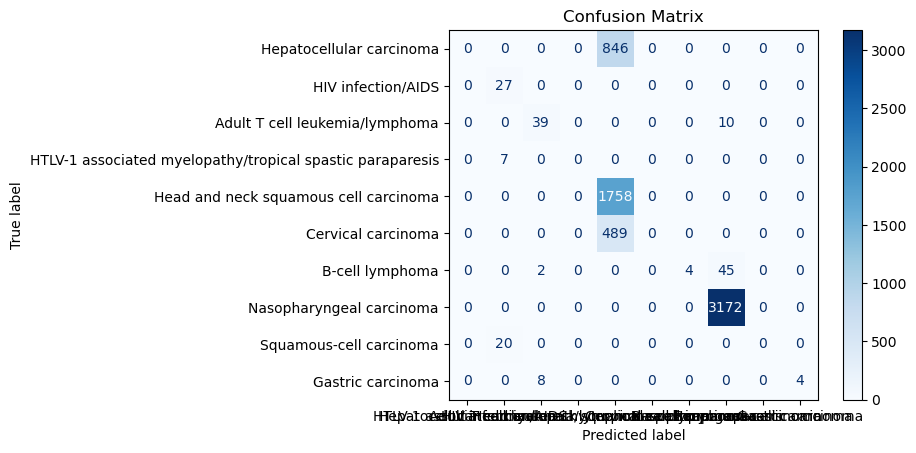

<Figure size 1000x800 with 0 Axes>

In [194]:
cm = confusion_matrix(y_test, preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=y.value_counts().index)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.figure(figsize=(10, 8))
plt.show()

### Random Forest

In [195]:
v_rf = RandomForestClassifier(random_state=42)
v_rf.fit(var_thres_train, y_train)

RandomForestClassifier(random_state=42)

In [196]:
print(accuracy_score(y_train, v_rf.predict(var_thres_train)))

0.778149300155521


In [197]:
print(accuracy_score(y_test, v_rf.predict(var_thres_test)))

0.7781060488259991


In [198]:
print(classification_report(y_test, v_rf.predict(var_thres_test)))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       846
           1       0.50      1.00      0.67        27
           2       0.80      0.80      0.80        49
           3       0.00      0.00      0.00         7
           4       0.57      1.00      0.72      1758
           5       0.00      0.00      0.00       489
           6       1.00      0.08      0.15        51
           7       0.98      1.00      0.99      3172
           8       0.00      0.00      0.00        20
           9       1.00      0.33      0.50        12

    accuracy                           0.78      6431
   macro avg       0.48      0.42      0.38      6431
weighted avg       0.66      0.78      0.70      6431



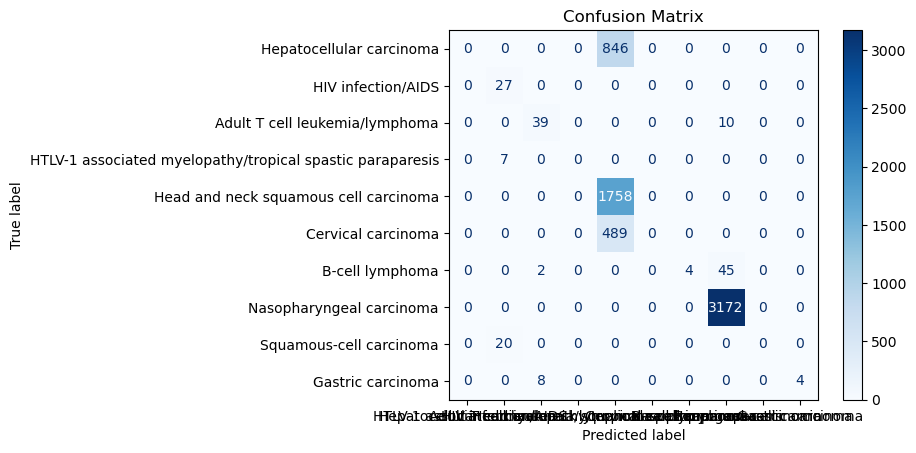

<Figure size 1400x800 with 0 Axes>

In [199]:
v_cm_rf = confusion_matrix(y_test, v_rf.predict(var_thres_test))
disp = ConfusionMatrixDisplay(confusion_matrix=v_cm_rf, display_labels=y.value_counts().index)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.figure(figsize=(14, 8))
plt.show()

### Naive Bayes

In [124]:
v_nb = GaussianNB()
v_nb.fit(var_thres_train, y_train)

GaussianNB()

In [125]:
print(accuracy_score(y_train, v_nb.predict(var_thres_train)))

0.6411741835147745


In [126]:
print(accuracy_score(y_test, v_nb.predict(var_thres_test)))

0.6415798476131239


In [127]:
print(classification_report(y_test, v_nb.predict(var_thres_test)))

              precision    recall  f1-score   support

           0       0.28      1.00      0.44       846
           1       0.50      1.00      0.67        27
           2       0.00      0.00      0.00        49
           3       0.00      0.00      0.00         7
           4       1.00      0.05      0.09      1758
           5       0.00      0.00      0.00       489
           6       0.00      0.00      0.00        51
           7       0.97      1.00      0.98      3172
           8       0.00      0.00      0.00        20
           9       0.00      0.00      0.00        12

    accuracy                           0.64      6431
   macro avg       0.27      0.30      0.22      6431
weighted avg       0.79      0.64      0.57      6431



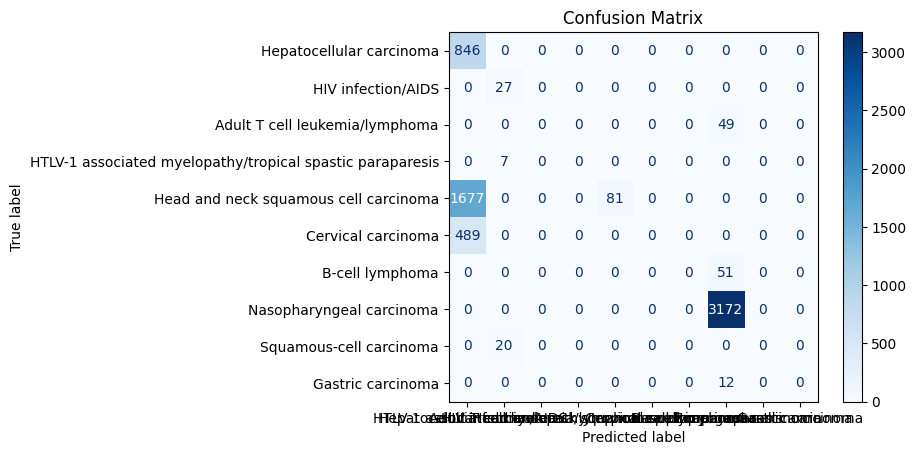

<Figure size 1400x800 with 0 Axes>

In [128]:
v_cm_nb = confusion_matrix(y_test, v_nb.predict(var_thres_test))
disp = ConfusionMatrixDisplay(confusion_matrix=v_cm_nb, display_labels=y.value_counts().index)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.figure(figsize=(14, 8))
plt.show()

### XGBoost Classifier

In [129]:
v_xg = XGBClassifier()
v_xg.fit(var_thres_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [130]:
print(accuracy_score(y_train, v_xg.predict(var_thres_train)))

0.778149300155521


In [131]:
print(accuracy_score(y_test, v_xg.predict(var_thres_test)))

0.7781060488259991


In [132]:
print(classification_report(y_test, v_xg.predict(var_thres_test)))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       846
           1       0.50      1.00      0.67        27
           2       0.80      0.80      0.80        49
           3       0.00      0.00      0.00         7
           4       0.57      1.00      0.72      1758
           5       0.00      0.00      0.00       489
           6       1.00      0.08      0.15        51
           7       0.98      1.00      0.99      3172
           8       0.00      0.00      0.00        20
           9       1.00      0.33      0.50        12

    accuracy                           0.78      6431
   macro avg       0.48      0.42      0.38      6431
weighted avg       0.66      0.78      0.70      6431



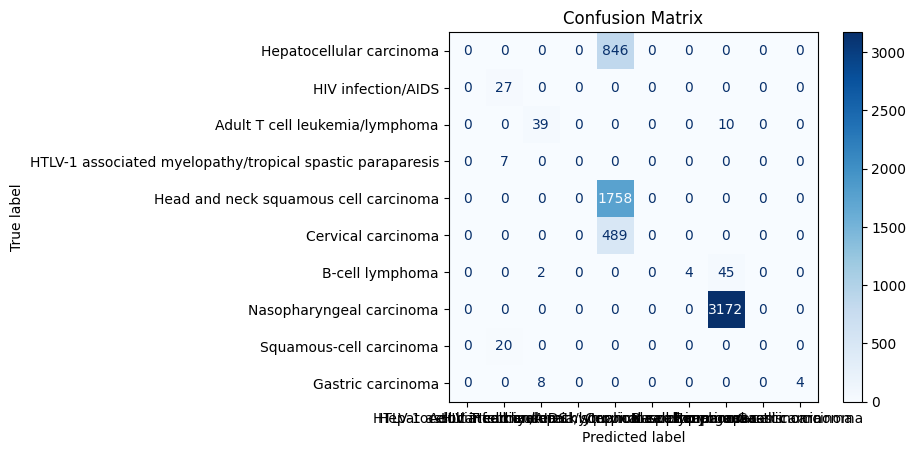

<Figure size 1400x800 with 0 Axes>

In [133]:
v_cm_xg = confusion_matrix(y_test, v_xg.predict(var_thres_test))
disp = ConfusionMatrixDisplay(confusion_matrix=v_cm_xg, display_labels=y.value_counts().index)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.figure(figsize=(14, 8))
plt.show()

### KNN

In [134]:
v_knn = KNeighborsClassifier(n_neighbors=4)
v_knn.fit(var_thres_train, y_train)

KNeighborsClassifier(n_neighbors=4)

In [135]:
print(accuracy_score(y_train, v_knn.predict(var_thres_train)))

0.6435069984447901


In [136]:
print(accuracy_score(y_test, v_knn.predict(var_thres_test)))

0.6456227647333229


In [137]:
print(classification_report(y_test, v_knn.predict(var_thres_test)))

              precision    recall  f1-score   support

           0       0.28      1.00      0.44       846
           1       0.50      1.00      0.67        27
           2       0.88      0.61      0.72        49
           3       0.00      0.00      0.00         7
           4       1.00      0.05      0.09      1758
           5       0.00      0.00      0.00       489
           6       0.40      0.96      0.57        51
           7       1.00      0.98      0.99      3172
           8       0.00      0.00      0.00        20
           9       0.53      0.83      0.65        12

    accuracy                           0.65      6431
   macro avg       0.46      0.54      0.41      6431
weighted avg       0.82      0.65      0.58      6431



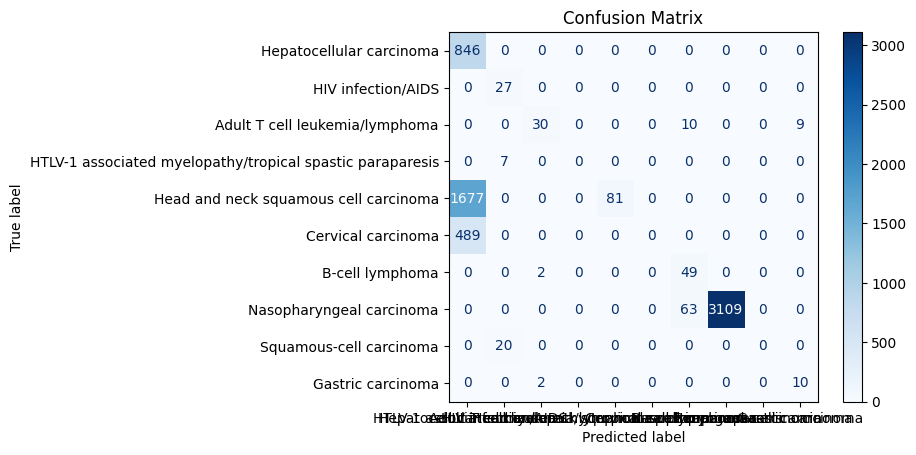

<Figure size 1400x800 with 0 Axes>

In [138]:
v_cm_knn = confusion_matrix(y_test, v_knn.predict(var_thres_test))
disp = ConfusionMatrixDisplay(confusion_matrix=v_cm_knn, display_labels=y.value_counts().index)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.figure(figsize=(14, 8))
plt.show()

### SVC

In [139]:
v_svc = SVC(kernel='rbf')
v_svc.fit(var_thres_train, y_train)

SVC()

In [140]:
print(accuracy_score(y_train, v_svc.predict(var_thres_train)))

0.7666407465007776


In [141]:
print(accuracy_score(y_test, v_svc.predict(var_thres_test)))

0.7665992847146633


In [142]:
print(classification_report(y_test, v_svc.predict(var_thres_test)))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       846
           1       0.00      0.00      0.00        27
           2       0.00      0.00      0.00        49
           3       0.00      0.00      0.00         7
           4       0.57      1.00      0.72      1758
           5       0.00      0.00      0.00       489
           6       0.00      0.00      0.00        51
           7       0.95      1.00      0.97      3172
           8       0.00      0.00      0.00        20
           9       0.00      0.00      0.00        12

    accuracy                           0.77      6431
   macro avg       0.15      0.20      0.17      6431
weighted avg       0.62      0.77      0.68      6431



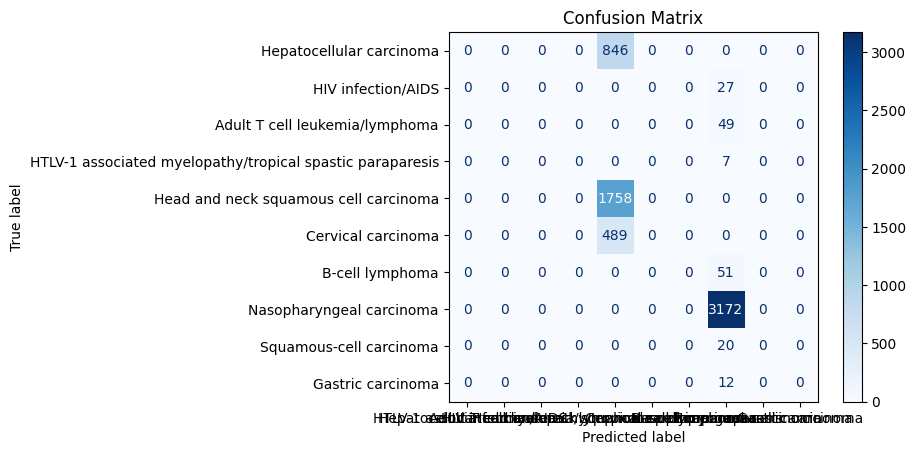

<Figure size 1400x800 with 0 Axes>

In [143]:
v_cm_svc = confusion_matrix(y_test, v_svc.predict(var_thres_test))
disp = ConfusionMatrixDisplay(confusion_matrix=v_cm_svc, display_labels=y.value_counts().index)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.figure(figsize=(14, 8))
plt.show()

### Voting Classifier

### Hard

In [144]:
estimator = []
estimator.append(('RandomForest', RandomForestClassifier(random_state=42)))
estimator.append(('XGB', XGBClassifier()))
estimator.append(('DecisionTree', DecisionTreeClassifier(random_state=42)))
estimator.append(('KNN', KNeighborsClassifier(n_neighbors=4)))
estimator.append(('Gradient Boosting', GradientBoostingClassifier(random_state=42)))
estimator.append(('Ada Boost', AdaBoostClassifier(random_state=42)))
# estimator.append(('Logistic Regression', LogisticRegression()))

In [145]:
v_vc_hard = VotingClassifier(estimators=estimator, voting='hard')
v_vc_hard.fit(var_thres_train, y_train)

VotingClassifier(estimators=[('RandomForest',
                              RandomForestClassifier(random_state=42)),
                             ('XGB',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None, device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None, gamma=None,
                                            grow_policy=None,
                                            impo...
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            multi_strategy=None,
                                            n_estimators=None, n_jobs=None,
                                            num_parallel_tree=None,
                                            random_state=None, ...)),
                             ('DecisionTree',
                              DecisionTreeClassifier(random_state=42)),
                             ('KNN', KNeighborsClassifier(n_neighbors=4)),
                             ('Gradient Boosting',
                              GradientBoostingClassifier(random_state=42)),
                             ('Ada Boost',
                              AdaBoostClassifier(random_state=42))])

In [146]:
print(accuracy_score(y_train, v_vc_hard.predict(var_thres_train)))

0.778149300155521


In [147]:
print(accuracy_score(y_test, v_vc_hard.predict(var_thres_test)))

0.7781060488259991


In [148]:
print(classification_report(y_test, v_vc_hard.predict(var_thres_test)))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       846
           1       0.50      1.00      0.67        27
           2       0.80      0.80      0.80        49
           3       0.00      0.00      0.00         7
           4       0.57      1.00      0.72      1758
           5       0.00      0.00      0.00       489
           6       1.00      0.08      0.15        51
           7       0.98      1.00      0.99      3172
           8       0.00      0.00      0.00        20
           9       1.00      0.33      0.50        12

    accuracy                           0.78      6431
   macro avg       0.48      0.42      0.38      6431
weighted avg       0.66      0.78      0.70      6431



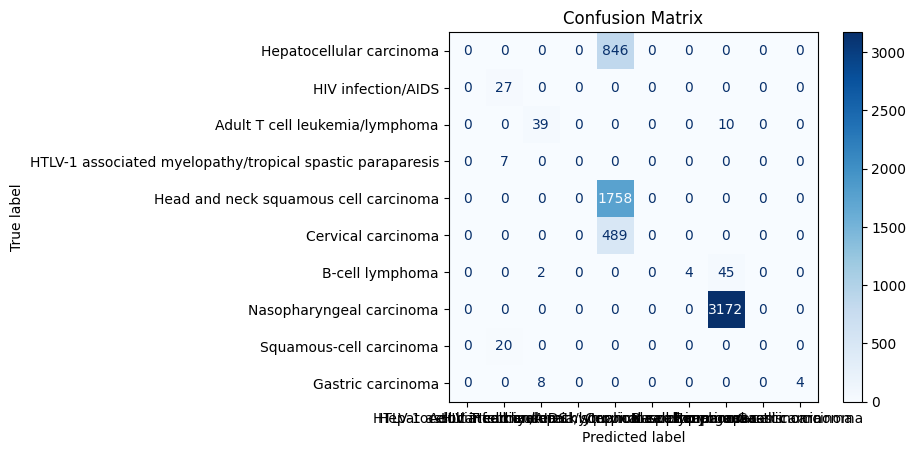

<Figure size 1400x800 with 0 Axes>

In [149]:
v_vc_hard = confusion_matrix(y_test, v_vc_hard.predict(var_thres_test))
disp = ConfusionMatrixDisplay(confusion_matrix=v_vc_hard, display_labels=y.value_counts().index)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.figure(figsize=(14, 8))
plt.show()

### Soft

In [150]:
v_vc_soft = VotingClassifier(estimators=estimator, voting='soft')
v_vc_soft.fit(var_thres_train, y_train)

VotingClassifier(estimators=[('RandomForest',
                              RandomForestClassifier(random_state=42)),
                             ('XGB',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None, device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None, gamma=None,
                                            grow_policy=None,
                                            impo...
                                            monotone_constraints=None,
                                            multi_strategy=None,
                                            n_estimators=None, n_jobs=None,
                                            num_parallel_tree=None,
                                            random_state=None, ...)),
                             ('DecisionTree',
                              DecisionTreeClassifier(random_state=42)),
                             ('KNN', KNeighborsClassifier(n_neighbors=4)),
                             ('Gradient Boosting',
                              GradientBoostingClassifier(random_state=42)),
                             ('Ada Boost',
                              AdaBoostClassifier(random_state=42))],
                 voting='soft')

In [151]:
print(accuracy_score(y_train, v_vc_soft.predict(var_thres_train)))

0.778149300155521


In [152]:
print(accuracy_score(y_test, v_vc_soft.predict(var_thres_test)))

0.7781060488259991


In [153]:
print(classification_report(y_test, v_vc_soft.predict(var_thres_test)))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       846
           1       0.50      1.00      0.67        27
           2       0.80      0.80      0.80        49
           3       0.00      0.00      0.00         7
           4       0.57      1.00      0.72      1758
           5       0.00      0.00      0.00       489
           6       1.00      0.08      0.15        51
           7       0.98      1.00      0.99      3172
           8       0.00      0.00      0.00        20
           9       1.00      0.33      0.50        12

    accuracy                           0.78      6431
   macro avg       0.48      0.42      0.38      6431
weighted avg       0.66      0.78      0.70      6431



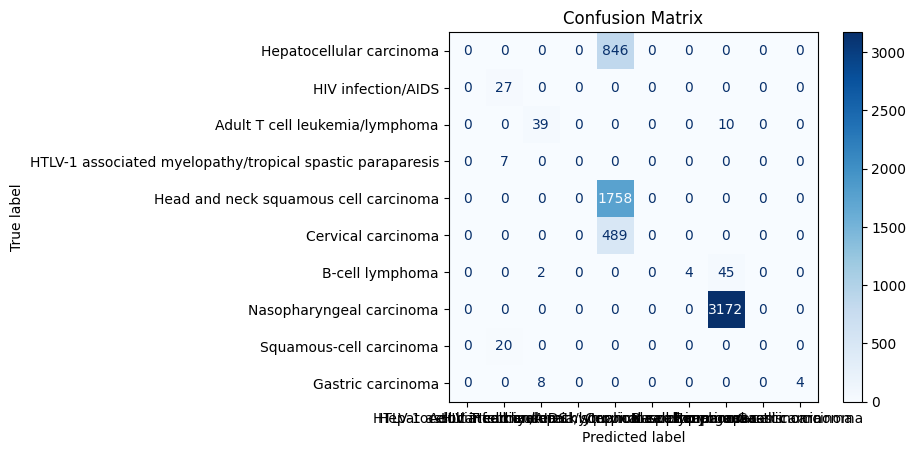

<Figure size 1400x800 with 0 Axes>

In [154]:
v_vc_soft = confusion_matrix(y_test, v_vc_soft.predict(var_thres_test))
disp = ConfusionMatrixDisplay(confusion_matrix=v_vc_soft, display_labels=y.value_counts().index)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.figure(figsize=(14, 8))
plt.show()

## Correlation 

### Decision Tree

In [155]:
corr_train = X_train.copy()
corr_test = X_test.copy()

In [156]:
corr_train.drop(['End Location', 'Sum Overlaps', 'Reference Human Genome'], axis=1, inplace=True)
corr_test.drop(['End Location', 'Sum Overlaps', 'Reference Human Genome'], axis=1, inplace=True)

In [157]:
c_dt = DecisionTreeClassifier(random_state=42)
c_dt.fit(corr_train, y_train)

DecisionTreeClassifier(random_state=42)

In [158]:
corr_preds = c_dt.predict(corr_test)

In [159]:
print(accuracy_score(y_train, c_dt.predict(corr_train)))

0.9999611197511664


In [160]:
print(accuracy_score(y_test, corr_preds))

0.9095008552324677


In [161]:
print(classification_report(y_test, c_dt.predict(corr_test)))

              precision    recall  f1-score   support

           0       0.67      0.69      0.68       846
           1       0.50      0.48      0.49        27
           2       0.88      0.90      0.89        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.44      0.42      0.43       489
           6       0.92      0.90      0.91        51
           7       1.00      1.00      1.00      3172
           8       0.33      0.35      0.34        20
           9       0.92      0.92      0.92        12

    accuracy                           0.91      6431
   macro avg       0.77      0.77      0.77      6431
weighted avg       0.91      0.91      0.91      6431



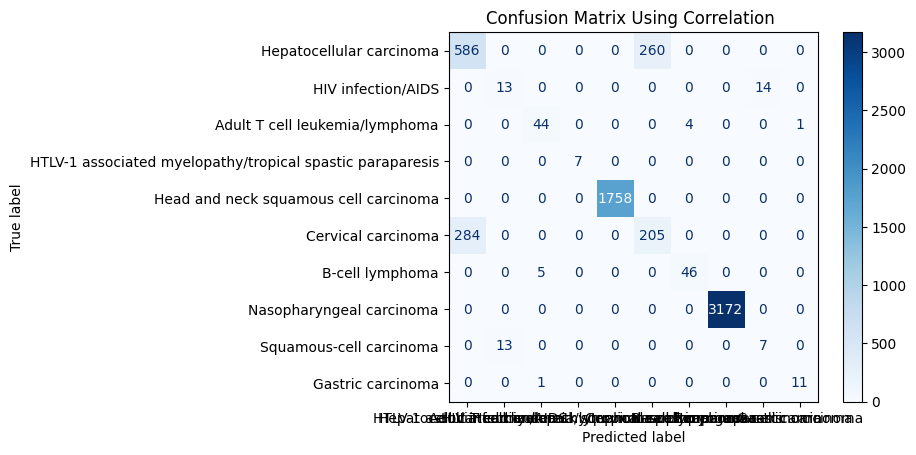

<Figure size 1400x800 with 0 Axes>

In [162]:
c_cm_dt = confusion_matrix(y_test, corr_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=c_cm_dt, display_labels=y.value_counts().index)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix Using Correlation ')
plt.figure(figsize=(14, 8))
plt.show()

### Hyperparameter Tuning

#### RandomizedSearchCV

In [163]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 4000, num = 40)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt','log2']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 1000,10)]
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10,14]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4,6,8]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
              'criterion':['entropy','gini']}
print(random_grid)

{'n_estimators': [200, 297, 394, 492, 589, 687, 784, 882, 979, 1076, 1174, 1271, 1369, 1466, 1564, 1661, 1758, 1856, 1953, 2051, 2148, 2246, 2343, 2441, 2538, 2635, 2733, 2830, 2928, 3025, 3123, 3220, 3317, 3415, 3512, 3610, 3707, 3805, 3902, 4000], 'max_features': ['auto', 'sqrt', 'log2'], 'max_depth': [10, 120, 230, 340, 450, 560, 670, 780, 890, 1000], 'min_samples_split': [2, 5, 10, 14], 'min_samples_leaf': [1, 2, 4, 6, 8], 'criterion': ['entropy', 'gini']}


In [164]:
rf=RandomForestClassifier()
rf_randomcv=RandomizedSearchCV(estimator=rf,param_distributions=random_grid,n_iter=100,cv=3,verbose=2,
                               random_state=100,n_jobs=-1)
### fit the randomized model
rf_randomcv.fit(corr_train,y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'criterion': ['entropy', 'gini'],
                                        'max_depth': [10, 120, 230, 340, 450,
                                                      560, 670, 780, 890,
                                                      1000],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4, 6, 8],
                                        'min_samples_split': [2, 5, 10, 14],
                                        'n_estimators': [200, 297, 394, 492,
                                                         589, 687, 784, 882,
                                                         979, 1076, 1174, 1271,
                                                         1369, 1466, 1564, 1661,
                                                         1758, 1856, 1953, 2051,
                                                         2148, 2246, 2343, 2441,
                                                         2538, 2635, 2733, 2830,
                                                         2928, 3025, ...]},
                   random_state=100, verbose=2)

In [165]:
best_random_grid=rf_randomcv.best_estimator_

In [166]:
from sklearn.metrics import accuracy_score
best_random_grid.fit(corr_train, y_train)
y_pred=best_random_grid.predict(corr_test)
print(confusion_matrix(y_test,y_pred))
print("Accuracy Score {}".format(accuracy_score(y_test,y_pred)))
print("Classification report: {}".format(classification_report(y_test,y_pred)))

[[ 835    0    0    0    0   11    0    0    0    0]
 [   0   20    0    0    0    0    0    0    7    0]
 [   0    0   43    0    0    0    6    0    0    0]
 [   0    0    0    7    0    0    0    0    0    0]
 [   0    0    0    0 1758    0    0    0    0    0]
 [ 479    0    0    0    0   10    0    0    0    0]
 [   0    0    4    0    0    0   47    0    0    0]
 [   0    0    0    0    0    0    0 3172    0    0]
 [   0   15    0    0    0    0    0    0    5    0]
 [   0    0    3    0    0    0    2    0    0    7]]
Accuracy Score 0.9180531799098118
Classification report:               precision    recall  f1-score   support

           0       0.64      0.99      0.77       846
           1       0.57      0.74      0.65        27
           2       0.86      0.88      0.87        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.48      0.02      0.04       489
           6       0.85      0.92

#### GridSearchCV

In [167]:
param_grid = {
    'criterion': [rf_randomcv.best_params_['criterion']],
    'max_depth': [rf_randomcv.best_params_['max_depth']],
    'max_features': [rf_randomcv.best_params_['max_features']],
    'min_samples_leaf': [rf_randomcv.best_params_['min_samples_leaf'], 
                         rf_randomcv.best_params_['min_samples_leaf']+2, 
                         rf_randomcv.best_params_['min_samples_leaf'] + 4],
    'min_samples_split': [rf_randomcv.best_params_['min_samples_split'] - 2,
                          rf_randomcv.best_params_['min_samples_split'] - 1,
                          rf_randomcv.best_params_['min_samples_split'], 
                          rf_randomcv.best_params_['min_samples_split'] +1,
                          rf_randomcv.best_params_['min_samples_split'] + 2],
    'n_estimators': [rf_randomcv.best_params_['n_estimators'] - 200, rf_randomcv.best_params_['n_estimators'] - 100, 
                     rf_randomcv.best_params_['n_estimators'], 
                     rf_randomcv.best_params_['n_estimators'] + 100, rf_randomcv.best_params_['n_estimators'] + 200]
}

print(param_grid)

{'criterion': ['gini'], 'max_depth': [10], 'max_features': ['log2'], 'min_samples_leaf': [2, 4, 6], 'min_samples_split': [3, 4, 5, 6, 7], 'n_estimators': [1169, 1269, 1369, 1469, 1569]}


In [168]:
#### Fit the grid_search to the data
rf=RandomForestClassifier()
grid_search=GridSearchCV(estimator=rf,param_grid=param_grid,cv=10,n_jobs=-1,verbose=2)
grid_search.fit(corr_train,y_train)

Fitting 10 folds for each of 75 candidates, totalling 750 fits


GridSearchCV(cv=10, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [10],
                         'max_features': ['log2'],
                         'min_samples_leaf': [2, 4, 6],
                         'min_samples_split': [3, 4, 5, 6, 7],
                         'n_estimators': [1169, 1269, 1369, 1469, 1569]},
             verbose=2)

In [169]:
best_grid=grid_search.best_estimator_

In [170]:
best_grid.fit(corr_train, y_train)
y_pred=best_grid.predict(corr_test)
print(confusion_matrix(y_test,y_pred))
print("Accuracy Score {}".format(accuracy_score(y_test,y_pred)))
print("Classification report: {}".format(classification_report(y_test,y_pred)))

[[ 836    0    0    0    0   10    0    0    0    0]
 [   0   20    0    0    0    0    0    0    7    0]
 [   0    0   42    0    0    0    7    0    0    0]
 [   0    0    0    7    0    0    0    0    0    0]
 [   0    0    0    0 1758    0    0    0    0    0]
 [ 478    0    0    0    0   11    0    0    0    0]
 [   0    0    2    0    0    0   49    0    0    0]
 [   0    0    0    0    0    0    0 3172    0    0]
 [   0   15    0    0    0    0    0    0    5    0]
 [   0    0    5    0    0    0    3    0    0    4]]
Accuracy Score 0.9180531799098118
Classification report:               precision    recall  f1-score   support

           0       0.64      0.99      0.77       846
           1       0.57      0.74      0.65        27
           2       0.86      0.86      0.86        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.52      0.02      0.04       489
           6       0.83      0.96

### Random Forest

In [171]:
c_rf = RandomForestClassifier(random_state=42)
c_rf.fit(corr_train, y_train)

RandomForestClassifier(random_state=42)

In [172]:
print(accuracy_score(y_train, c_rf.predict(corr_train)))

0.9999611197511664


In [173]:
print(accuracy_score(y_test, c_rf.predict(corr_test)))

0.9169647022236044


In [174]:
print(classification_report(y_test, c_rf.predict(corr_test)))

              precision    recall  f1-score   support

           0       0.66      0.83      0.74       846
           1       0.54      0.56      0.55        27
           2       0.87      0.94      0.90        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.48      0.27      0.34       489
           6       0.92      0.90      0.91        51
           7       1.00      1.00      1.00      3172
           8       0.37      0.35      0.36        20
           9       1.00      0.75      0.86        12

    accuracy                           0.92      6431
   macro avg       0.78      0.76      0.77      6431
weighted avg       0.91      0.92      0.91      6431



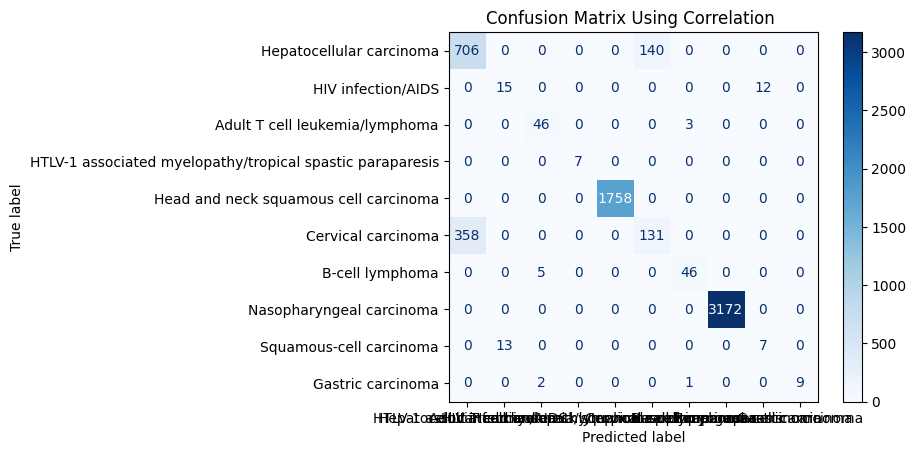

<Figure size 1400x800 with 0 Axes>

In [175]:
c_cm_rf = confusion_matrix(y_test, c_rf.predict(corr_test))
disp = ConfusionMatrixDisplay(confusion_matrix=c_cm_rf, display_labels=y.value_counts().index)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix Using Correlation ')
plt.figure(figsize=(14, 8))
plt.show()

### Hyper Parameter Tuning

#### Randomized SearchCV

In [176]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 4000, num = 50)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt','log2']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 1000,10)]
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10,14,20]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4,6,8,10]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
              'criterion':['entropy','gini']}
print(random_grid)

{'n_estimators': [200, 277, 355, 432, 510, 587, 665, 742, 820, 897, 975, 1053, 1130, 1208, 1285, 1363, 1440, 1518, 1595, 1673, 1751, 1828, 1906, 1983, 2061, 2138, 2216, 2293, 2371, 2448, 2526, 2604, 2681, 2759, 2836, 2914, 2991, 3069, 3146, 3224, 3302, 3379, 3457, 3534, 3612, 3689, 3767, 3844, 3922, 4000], 'max_features': ['auto', 'sqrt', 'log2'], 'max_depth': [10, 120, 230, 340, 450, 560, 670, 780, 890, 1000], 'min_samples_split': [2, 5, 10, 14, 20], 'min_samples_leaf': [1, 2, 4, 6, 8, 10], 'criterion': ['entropy', 'gini']}


In [177]:
rf=RandomForestClassifier()
rf_randomcv=RandomizedSearchCV(estimator=rf,param_distributions=random_grid,n_iter=100,cv=3,verbose=2,
                               random_state=100,n_jobs=-1)
### fit the randomized model
rf_randomcv.fit(corr_train,y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'criterion': ['entropy', 'gini'],
                                        'max_depth': [10, 120, 230, 340, 450,
                                                      560, 670, 780, 890,
                                                      1000],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4, 6, 8, 10],
                                        'min_samples_split': [2, 5, 10, 14, 20],
                                        'n_estimators': [200, 277, 355, 432,
                                                         510, 587, 665, 742,
                                                         820, 897, 975, 1053,
                                                         1130, 1208, 1285, 1363,
                                                         1440, 1518, 1595, 1673,
                                                         1751, 1828, 1906, 1983,
                                                         2061, 2138, 2216, 2293,
                                                         2371, 2448, ...]},
                   random_state=100, verbose=2)

In [178]:
best_random_grid=rf_randomcv.best_estimator_

In [179]:
from sklearn.metrics import accuracy_score
best_random_grid.fit(corr_train, y_train)
y_pred=best_random_grid.predict(corr_test)
print(confusion_matrix(y_test,y_pred))
print("Accuracy Score {}".format(accuracy_score(y_test,y_pred)))
print("Classification report: {}".format(classification_report(y_test,y_pred)))

[[ 836    0    0    0    0   10    0    0    0    0]
 [   0   20    0    0    0    0    0    0    7    0]
 [   0    0   42    0    0    0    7    0    0    0]
 [   0    0    0    7    0    0    0    0    0    0]
 [   0    0    0    0 1758    0    0    0    0    0]
 [ 479    0    0    0    0   10    0    0    0    0]
 [   0    0    3    0    0    0   48    0    0    0]
 [   0    0    0    0    0    0    0 3172    0    0]
 [   0   15    0    0    0    0    0    0    5    0]
 [   0    0    3    0    0    0    2    0    0    7]]
Accuracy Score 0.9182086767221272
Classification report:               precision    recall  f1-score   support

           0       0.64      0.99      0.77       846
           1       0.57      0.74      0.65        27
           2       0.88      0.86      0.87        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.50      0.02      0.04       489
           6       0.84      0.94

#### GridSearch CV

In [180]:
rf_randomcv.best_params_

{'n_estimators': 3379,
 'min_samples_split': 10,
 'min_samples_leaf': 2,
 'max_features': 'sqrt',
 'max_depth': 10,
 'criterion': 'gini'}

In [181]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'criterion': [rf_randomcv.best_params_['criterion']],
    'max_depth': [rf_randomcv.best_params_['max_depth']],
    'max_features': [rf_randomcv.best_params_['max_features']],
    'min_samples_leaf': [rf_randomcv.best_params_['min_samples_leaf'], 
                         rf_randomcv.best_params_['min_samples_leaf']+2, 
                         rf_randomcv.best_params_['min_samples_leaf'] + 4],
    'min_samples_split': [rf_randomcv.best_params_['min_samples_split'] - 2,
                          rf_randomcv.best_params_['min_samples_split'] - 1,
                          rf_randomcv.best_params_['min_samples_split'], 
                          rf_randomcv.best_params_['min_samples_split'] +1,
                          rf_randomcv.best_params_['min_samples_split'] + 2],
    'n_estimators': [rf_randomcv.best_params_['n_estimators'] - 200, rf_randomcv.best_params_['n_estimators'] - 100, 
                     rf_randomcv.best_params_['n_estimators'], 
                     rf_randomcv.best_params_['n_estimators'] + 100, rf_randomcv.best_params_['n_estimators'] + 200]
}

print(param_grid)

{'criterion': ['gini'], 'max_depth': [10], 'max_features': ['sqrt'], 'min_samples_leaf': [2, 4, 6], 'min_samples_split': [8, 9, 10, 11, 12], 'n_estimators': [3179, 3279, 3379, 3479, 3579]}


In [182]:
#### Fit the grid_search to the data
rf=RandomForestClassifier()
grid_search=GridSearchCV(estimator=rf,param_grid=param_grid,cv=10,n_jobs=-1,verbose=2)
grid_search.fit(corr_train,y_train)


Fitting 10 folds for each of 75 candidates, totalling 750 fits


GridSearchCV(cv=10, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [10],
                         'max_features': ['sqrt'],
                         'min_samples_leaf': [2, 4, 6],
                         'min_samples_split': [8, 9, 10, 11, 12],
                         'n_estimators': [3179, 3279, 3379, 3479, 3579]},
             verbose=2)

In [183]:
grid_search.best_estimator_

RandomForestClassifier(max_depth=10, min_samples_leaf=4, min_samples_split=8,
                       n_estimators=3279)

In [184]:
best_grid=grid_search.best_estimator_

In [185]:
best_grid

RandomForestClassifier(max_depth=10, min_samples_leaf=4, min_samples_split=8,
                       n_estimators=3279)

In [186]:
best_grid.fit(corr_train, y_train)
y_pred=best_grid.predict(corr_test)
print(confusion_matrix(y_test,y_pred))
print("Accuracy Score {}".format(accuracy_score(y_test,y_pred)))
print("Classification report: {}".format(classification_report(y_test,y_pred)))

[[ 835    0    0    0    0   11    0    0    0    0]
 [   0   20    0    0    0    0    0    0    7    0]
 [   0    0   41    0    0    0    8    0    0    0]
 [   0    0    0    7    0    0    0    0    0    0]
 [   0    0    0    0 1758    0    0    0    0    0]
 [ 478    0    0    0    0   11    0    0    0    0]
 [   0    0    2    0    0    0   49    0    0    0]
 [   0    0    0    0    0    0    0 3172    0    0]
 [   0   15    0    0    0    0    0    0    5    0]
 [   0    0    5    0    0    0    2    0    0    5]]
Accuracy Score 0.9178976830974965
Classification report:               precision    recall  f1-score   support

           0       0.64      0.99      0.77       846
           1       0.57      0.74      0.65        27
           2       0.85      0.84      0.85        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.50      0.02      0.04       489
           6       0.83      0.96

### Naive Bayes

In [187]:
c_nb = GaussianNB()
c_nb.fit(corr_train, y_train)

GaussianNB()

In [188]:
print(accuracy_score(y_train, c_nb.predict(corr_train)))

0.9065318818040435


In [189]:
print(accuracy_score(y_test, c_nb.predict(corr_test)))

0.9054579381122687


In [190]:
print(classification_report(y_test, c_nb.predict(corr_test)))

              precision    recall  f1-score   support

           0       0.64      0.96      0.77       846
           1       0.59      1.00      0.74        27
           2       0.82      0.18      0.30        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.42      0.04      0.08       489
           6       0.00      0.00      0.00        51
           7       1.00      1.00      1.00      3172
           8       1.00      0.05      0.10        20
           9       0.12      1.00      0.21        12

    accuracy                           0.91      6431
   macro avg       0.66      0.62      0.52      6431
weighted avg       0.89      0.91      0.88      6431



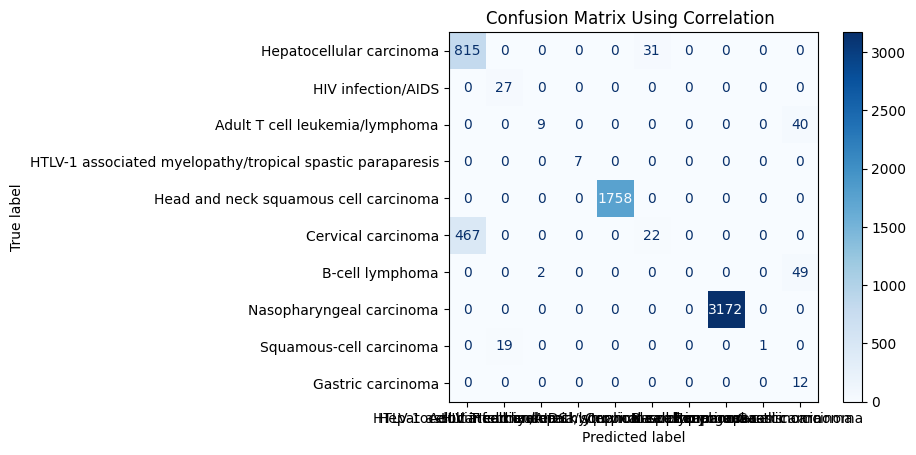

<Figure size 1400x800 with 0 Axes>

In [191]:
c_cm_nb = confusion_matrix(y_test, c_nb.predict(corr_test))
disp = ConfusionMatrixDisplay(confusion_matrix=c_cm_nb, display_labels=y.value_counts().index)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix Using Correlation ')
plt.figure(figsize=(14, 8))
plt.show()

### Multinomial Naive Bayes

In [192]:
c_mnb = MultinomialNB()
c_mnb.fit(corr_train, y_train)

MultinomialNB()

In [193]:
print(accuracy_score(y_train, c_mnb.predict(corr_train)))

0.7666407465007776


In [194]:
print(accuracy_score(y_test, c_mnb.predict(corr_test)))

0.7665992847146633


In [195]:
print(classification_report(y_test, c_mnb.predict(corr_test)))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       846
           1       0.00      0.00      0.00        27
           2       0.00      0.00      0.00        49
           3       0.00      0.00      0.00         7
           4       0.57      1.00      0.72      1758
           5       0.00      0.00      0.00       489
           6       0.00      0.00      0.00        51
           7       0.95      1.00      0.97      3172
           8       0.00      0.00      0.00        20
           9       0.00      0.00      0.00        12

    accuracy                           0.77      6431
   macro avg       0.15      0.20      0.17      6431
weighted avg       0.62      0.77      0.68      6431



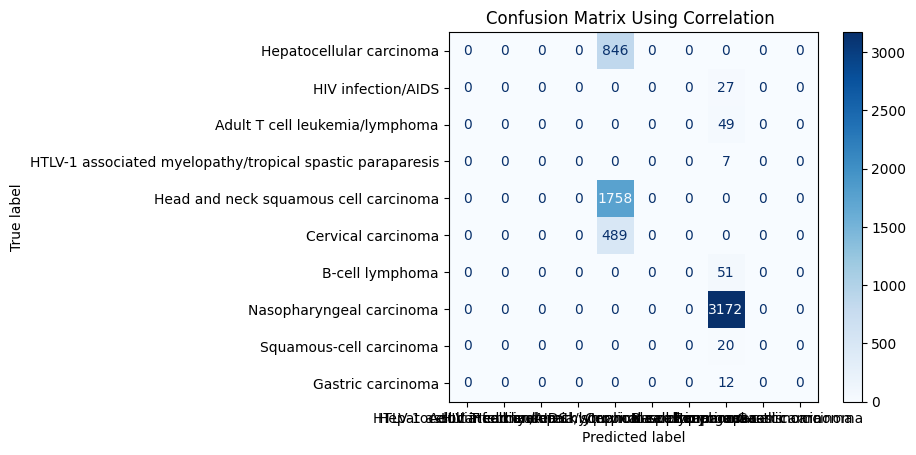

<Figure size 1400x800 with 0 Axes>

In [196]:
c_cm_mnb = confusion_matrix(y_test, c_mnb.predict(corr_test))
disp = ConfusionMatrixDisplay(confusion_matrix=c_cm_mnb, display_labels=y.value_counts().index)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix Using Correlation ')
plt.figure(figsize=(14, 8))
plt.show()

### Logistic Regression

In [197]:
c_lr = LogisticRegression()
c_lr.fit(corr_train, y_train)

LogisticRegression()

In [198]:
print(accuracy_score(y_train, c_lr.predict(corr_train)))

0.9084758942457232


In [199]:
print(accuracy_score(y_test, c_lr.predict(corr_test)))

0.909189861607837


In [200]:
print(classification_report(y_test, c_lr.predict(corr_test)))

              precision    recall  f1-score   support

           0       0.63      1.00      0.78       846
           1       0.00      0.00      0.00        27
           2       0.72      0.53      0.61        49
           3       0.00      0.00      0.00         7
           4       1.00      1.00      1.00      1758
           5       0.00      0.00      0.00       489
           6       0.64      0.86      0.73        51
           7       0.98      1.00      0.99      3172
           8       0.00      0.00      0.00        20
           9       1.00      0.08      0.15        12

    accuracy                           0.91      6431
   macro avg       0.50      0.45      0.43      6431
weighted avg       0.85      0.91      0.87      6431



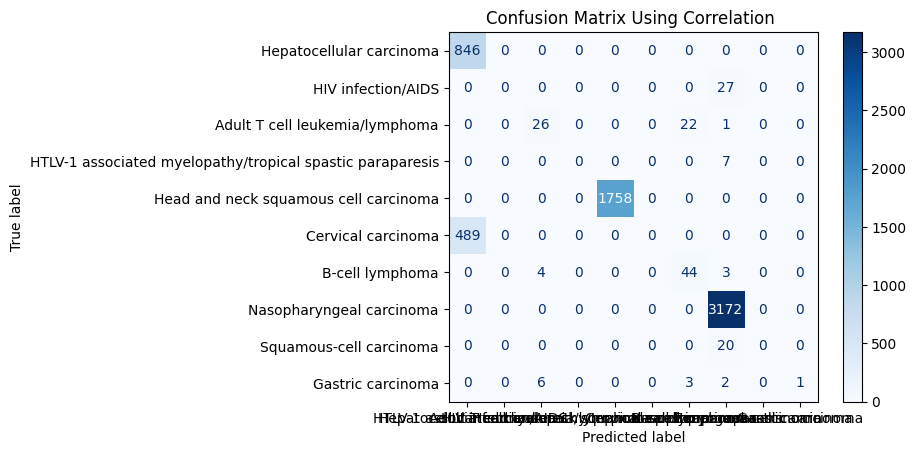

<Figure size 1400x800 with 0 Axes>

In [201]:
c_cm_lr = confusion_matrix(y_test, c_lr.predict(corr_test))
disp = ConfusionMatrixDisplay(confusion_matrix=c_cm_lr, display_labels=y.value_counts().index)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix Using Correlation ')
plt.figure(figsize=(14, 8))
plt.show()

## XGBoost Classifier

In [202]:
c_xgb = XGBClassifier()
c_xgb.fit(corr_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [203]:
print(accuracy_score(y_train, c_xgb.predict(corr_train)))

0.9789269051321928


In [204]:
print(accuracy_score(y_test, c_xgb.predict(corr_test)))

0.9107448297309905


In [205]:
print(classification_report(y_test, c_xgb.predict(corr_test)))

              precision    recall  f1-score   support

           0       0.65      0.78      0.71       846
           1       0.50      0.44      0.47        27
           2       0.89      0.96      0.92        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.42      0.28      0.34       489
           6       0.94      0.90      0.92        51
           7       1.00      1.00      1.00      3172
           8       0.35      0.40      0.37        20
           9       1.00      0.83      0.91        12

    accuracy                           0.91      6431
   macro avg       0.77      0.76      0.76      6431
weighted avg       0.90      0.91      0.91      6431



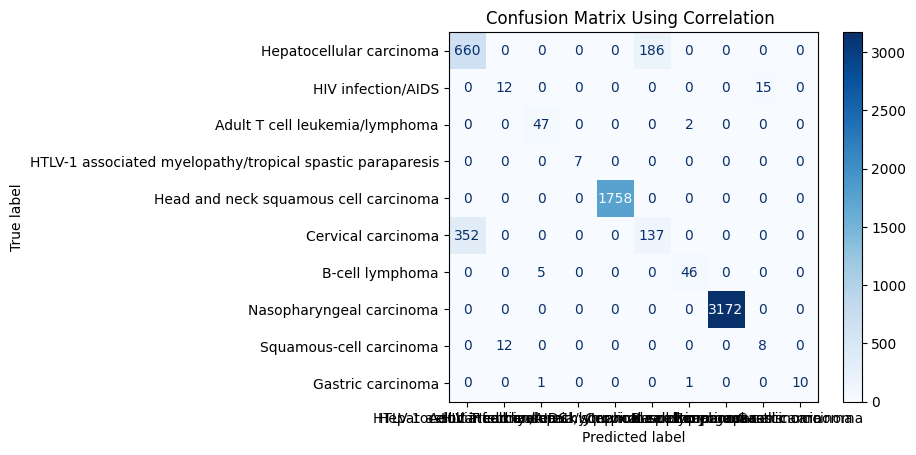

<Figure size 1400x800 with 0 Axes>

In [206]:
c_cm_xg = confusion_matrix(y_test, c_xgb.predict(corr_test))
disp = ConfusionMatrixDisplay(confusion_matrix=c_cm_xg, display_labels=y.value_counts().index)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix Using Correlation ')
plt.figure(figsize=(14, 8))
plt.show()

### Hyper Parameter Tuning

### Randomized Search CV

In [207]:
import numpy as np
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 5000, num = 50)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt','log2']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 1000,10)]
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10,14]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4,6,8]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
              'criterion':['entropy','gini']}
print(random_grid)

{'n_estimators': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200, 1300, 1400, 1500, 1600, 1700, 1800, 1900, 2000, 2100, 2200, 2300, 2400, 2500, 2600, 2700, 2800, 2900, 3000, 3100, 3200, 3300, 3400, 3500, 3600, 3700, 3800, 3900, 4000, 4100, 4200, 4300, 4400, 4500, 4600, 4700, 4800, 4900, 5000], 'max_features': ['auto', 'sqrt', 'log2'], 'max_depth': [10, 120, 230, 340, 450, 560, 670, 780, 890, 1000], 'min_samples_split': [2, 5, 10, 14], 'min_samples_leaf': [1, 2, 4, 6, 8], 'criterion': ['entropy', 'gini']}


In [208]:
rf=RandomForestClassifier()
rf_randomcv=RandomizedSearchCV(estimator=rf,param_distributions=random_grid,n_iter=100,cv=3,verbose=2,
                               random_state=100,n_jobs=-1)
### fit the randomized model
rf_randomcv.fit(corr_train,y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'criterion': ['entropy', 'gini'],
                                        'max_depth': [10, 120, 230, 340, 450,
                                                      560, 670, 780, 890,
                                                      1000],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4, 6, 8],
                                        'min_samples_split': [2, 5, 10, 14],
                                        'n_estimators': [100, 200, 300, 400,
                                                         500, 600, 700, 800,
                                                         900, 1000, 1100, 1200,
                                                         1300, 1400, 1500, 1600,
                                                         1700, 1800, 1900, 2000,
                                                         2100, 2200, 2300, 2400,
                                                         2500, 2600, 2700, 2800,
                                                         2900, 3000, ...]},
                   random_state=100, verbose=2)

In [209]:
best_random_grid=rf_randomcv.best_estimator_

In [210]:
from sklearn.metrics import accuracy_score
best_random_grid.fit(corr_train, y_train)
y_pred=best_random_grid.predict(corr_test)
print(confusion_matrix(y_test,y_pred))
print("Accuracy Score {}".format(accuracy_score(y_test,y_pred)))
print("Classification report: {}".format(classification_report(y_test,y_pred)))

[[ 768    0    0    0    0   78    0    0    0    0]
 [   0   20    0    0    0    0    0    0    7    0]
 [   0    0   42    0    0    0    7    0    0    0]
 [   0    0    0    7    0    0    0    0    0    0]
 [   0    0    0    0 1758    0    0    0    0    0]
 [ 410    0    0    0    0   79    0    0    0    0]
 [   0    0    4    0    0    0   47    0    0    0]
 [   0    0    0    0    0    0    0 3172    0    0]
 [   0   14    0    0    0    0    0    0    6    0]
 [   0    0    6    0    0    0    1    0    0    5]]
Accuracy Score 0.9180531799098118
Classification report:               precision    recall  f1-score   support

           0       0.65      0.91      0.76       846
           1       0.59      0.74      0.66        27
           2       0.81      0.86      0.83        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.50      0.16      0.24       489
           6       0.85      0.92

#### GridSearchCV

In [211]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'criterion': [rf_randomcv.best_params_['criterion']],
    'max_depth': [rf_randomcv.best_params_['max_depth']],
    'max_features': [rf_randomcv.best_params_['max_features']],
    'min_samples_leaf': [rf_randomcv.best_params_['min_samples_leaf'], 
                         rf_randomcv.best_params_['min_samples_leaf']+2, 
                         rf_randomcv.best_params_['min_samples_leaf'] + 4],
    'min_samples_split': [rf_randomcv.best_params_['min_samples_split'] - 2,
                          rf_randomcv.best_params_['min_samples_split'] - 1,
                          rf_randomcv.best_params_['min_samples_split'], 
                          rf_randomcv.best_params_['min_samples_split'] +1,
                          rf_randomcv.best_params_['min_samples_split'] + 2],
    'n_estimators': [rf_randomcv.best_params_['n_estimators'] - 200, rf_randomcv.best_params_['n_estimators'] - 100, 
                     rf_randomcv.best_params_['n_estimators'], 
                     rf_randomcv.best_params_['n_estimators'] + 100, rf_randomcv.best_params_['n_estimators'] + 200]
}

print(param_grid)

{'criterion': ['entropy'], 'max_depth': [1000], 'max_features': ['sqrt'], 'min_samples_leaf': [2, 4, 6], 'min_samples_split': [12, 13, 14, 15, 16], 'n_estimators': [200, 300, 400, 500, 600]}


In [212]:
#### Fit the grid_search to the data
rf=RandomForestClassifier()
grid_search=GridSearchCV(estimator=rf,param_grid=param_grid,cv=10,n_jobs=-1,verbose=2)
grid_search.fit(corr_train,y_train)


Fitting 10 folds for each of 75 candidates, totalling 750 fits


GridSearchCV(cv=10, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'criterion': ['entropy'], 'max_depth': [1000],
                         'max_features': ['sqrt'],
                         'min_samples_leaf': [2, 4, 6],
                         'min_samples_split': [12, 13, 14, 15, 16],
                         'n_estimators': [200, 300, 400, 500, 600]},
             verbose=2)

In [213]:
best_grid=grid_search.best_estimator_

In [214]:
best_grid

RandomForestClassifier(criterion='entropy', max_depth=1000, min_samples_leaf=4,
                       min_samples_split=12, n_estimators=400)

In [215]:
best_grid.fit(corr_train, y_train)
y_pred=best_grid.predict(corr_test)
print(confusion_matrix(y_test,y_pred))
print("Accuracy Score {}".format(accuracy_score(y_test,y_pred)))
print("Classification report: {}".format(classification_report(y_test,y_pred)))

[[ 778    0    0    0    0   68    0    0    0    0]
 [   0   18    0    0    0    0    0    0    9    0]
 [   0    0   43    0    0    0    6    0    0    0]
 [   0    0    0    7    0    0    0    0    0    0]
 [   0    0    0    0 1758    0    0    0    0    0]
 [ 417    0    0    0    0   72    0    0    0    0]
 [   0    0    3    0    0    0   48    0    0    0]
 [   0    0    0    0    0    0    0 3172    0    0]
 [   0   14    0    0    0    0    0    0    6    0]
 [   0    0    6    0    0    0    2    0    0    4]]
Accuracy Score 0.9183641735344426
Classification report:               precision    recall  f1-score   support

           0       0.65      0.92      0.76       846
           1       0.56      0.67      0.61        27
           2       0.83      0.88      0.85        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.51      0.15      0.23       489
           6       0.86      0.94

### KNN

In [216]:
corr_knn = KNeighborsClassifier(n_neighbors=4)
corr_knn.fit(corr_train, y_train)

KNeighborsClassifier(n_neighbors=4)

In [217]:
print(accuracy_score(y_train, corr_knn.predict(corr_train)))

0.9393079315707621


In [218]:
print(accuracy_score(y_test, corr_knn.predict(corr_test)))

0.9119888042295133


In [219]:
print(classification_report(y_test, corr_knn.predict(corr_test)))

              precision    recall  f1-score   support

           0       0.65      0.87      0.74       846
           1       0.53      0.74      0.62        27
           2       0.77      0.88      0.82        49
           3       1.00      0.43      0.60         7
           4       1.00      1.00      1.00      1758
           5       0.44      0.17      0.25       489
           6       0.81      0.82      0.82        51
           7       1.00      1.00      1.00      3172
           8       0.22      0.10      0.14        20
           9       1.00      0.33      0.50        12

    accuracy                           0.91      6431
   macro avg       0.74      0.63      0.65      6431
weighted avg       0.90      0.91      0.90      6431



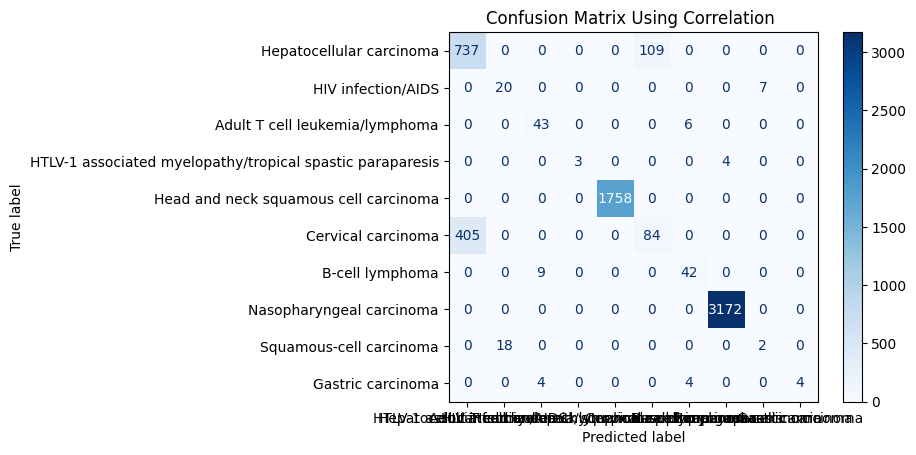

<Figure size 1400x800 with 0 Axes>

In [220]:
c_cm_knn = confusion_matrix(y_test, corr_knn.predict(corr_test))
disp = ConfusionMatrixDisplay(confusion_matrix=c_cm_knn, display_labels=y.value_counts().index)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix Using Correlation ')
plt.figure(figsize=(14, 8))
plt.show()

### SVC

In [221]:
corr_svc = SVC(kernel='rbf')
corr_svc.fit(corr_train, y_train)

SVC()

In [222]:
print(accuracy_score(y_train, corr_svc.predict(corr_train)))

0.9138802488335925


In [223]:
print(accuracy_score(y_test, corr_svc.predict(corr_test)))

0.9132327787280361


In [224]:
print(classification_report(y_test, corr_svc.predict(corr_test)))

              precision    recall  f1-score   support

           0       0.63      1.00      0.78       846
           1       0.50      1.00      0.67        27
           2       0.83      0.41      0.55        49
           3       0.00      0.00      0.00         7
           4       1.00      1.00      1.00      1758
           5       0.00      0.00      0.00       489
           6       0.56      0.96      0.71        51
           7       1.00      1.00      1.00      3172
           8       0.00      0.00      0.00        20
           9       1.00      0.08      0.15        12

    accuracy                           0.91      6431
   macro avg       0.55      0.55      0.49      6431
weighted avg       0.86      0.91      0.88      6431



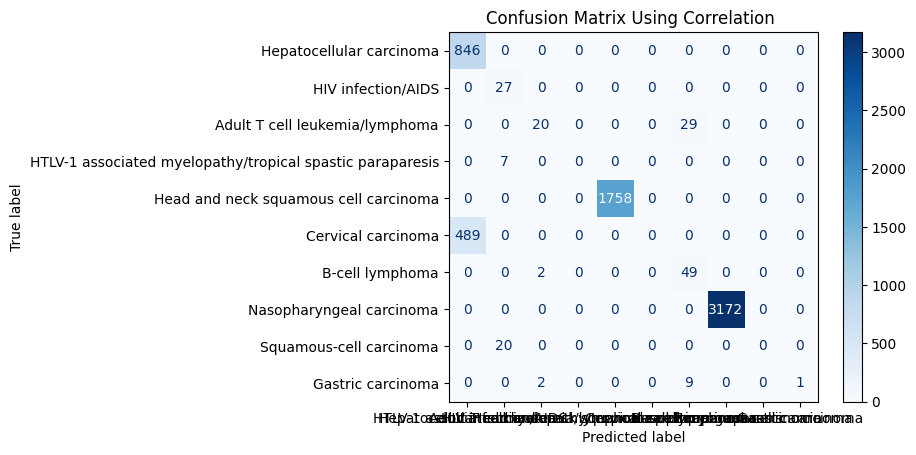

<Figure size 1400x800 with 0 Axes>

In [225]:
c_cm_svc = confusion_matrix(y_test, corr_svc.predict(corr_test))
disp = ConfusionMatrixDisplay(confusion_matrix=c_cm_svc, display_labels=y.value_counts().index)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix Using Correlation ')
plt.figure(figsize=(14, 8))
plt.show()

### Voting Classifier

### Hard Voting

In [226]:
corr_vc_hard = VotingClassifier(estimators=estimator, voting='hard')
corr_vc_hard.fit(corr_train, y_train)

VotingClassifier(estimators=[('RandomForest',
                              RandomForestClassifier(random_state=42)),
                             ('XGB',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None, device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None, gamma=None,
                                            grow_policy=None,
                                            impo...
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            multi_strategy=None,
                                            n_estimators=None, n_jobs=None,
                                            num_parallel_tree=None,
                                            random_state=None, ...)),
                             ('DecisionTree',
                              DecisionTreeClassifier(random_state=42)),
                             ('KNN', KNeighborsClassifier(n_neighbors=4)),
                             ('Gradient Boosting',
                              GradientBoostingClassifier(random_state=42)),
                             ('Ada Boost',
                              AdaBoostClassifier(random_state=42))])

In [227]:
print(accuracy_score(y_train, corr_vc_hard.predict(corr_train)))

0.95151632970451


In [228]:
print(accuracy_score(y_test, corr_vc_hard.predict(corr_test)))

0.9178976830974965


In [229]:
print(classification_report(y_test, corr_vc_hard.predict(corr_test)))

              precision    recall  f1-score   support

           0       0.64      0.96      0.77       846
           1       0.53      0.59      0.56        27
           2       0.85      0.96      0.90        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.48      0.07      0.12       489
           6       0.94      0.88      0.91        51
           7       1.00      1.00      1.00      3172
           8       0.35      0.30      0.32        20
           9       1.00      0.75      0.86        12

    accuracy                           0.92      6431
   macro avg       0.78      0.75      0.74      6431
weighted avg       0.91      0.92      0.90      6431



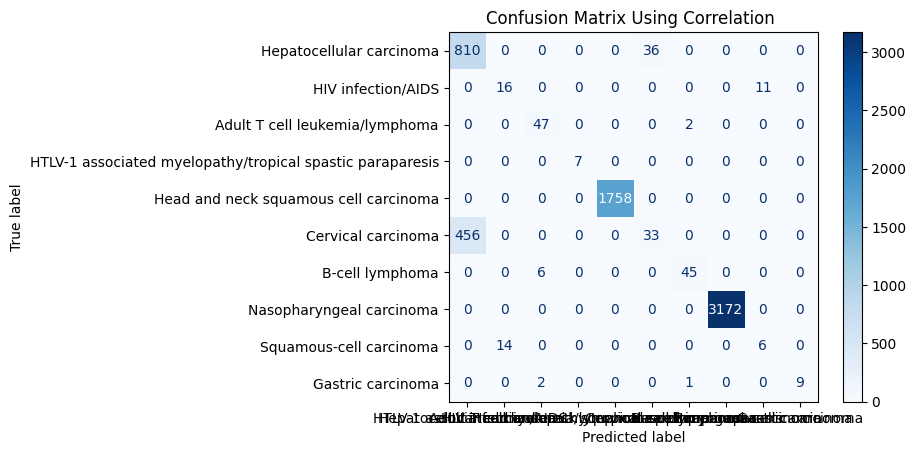

<Figure size 1400x800 with 0 Axes>

In [230]:
c_cm_vc_hard = confusion_matrix(y_test, corr_vc_hard.predict(corr_test))
disp = ConfusionMatrixDisplay(confusion_matrix=c_cm_vc_hard, display_labels=y.value_counts().index)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix Using Correlation ')
plt.figure(figsize=(14, 8))
plt.show()

### Hyper Parameter Tuning

#### Randomized Search CV

In [231]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 4000, num = 40)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt','log2']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 1000,10)]
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10,14]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4,6,8]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
              'criterion':['entropy','gini']}
print(random_grid)

{'n_estimators': [200, 297, 394, 492, 589, 687, 784, 882, 979, 1076, 1174, 1271, 1369, 1466, 1564, 1661, 1758, 1856, 1953, 2051, 2148, 2246, 2343, 2441, 2538, 2635, 2733, 2830, 2928, 3025, 3123, 3220, 3317, 3415, 3512, 3610, 3707, 3805, 3902, 4000], 'max_features': ['auto', 'sqrt', 'log2'], 'max_depth': [10, 120, 230, 340, 450, 560, 670, 780, 890, 1000], 'min_samples_split': [2, 5, 10, 14], 'min_samples_leaf': [1, 2, 4, 6, 8], 'criterion': ['entropy', 'gini']}


In [232]:
rf=RandomForestClassifier()
rf_randomcv=RandomizedSearchCV(estimator=rf,param_distributions=random_grid,n_iter=100,cv=3,verbose=2,
                               random_state=100,n_jobs=-1)
### fit the randomized model
rf_randomcv.fit(corr_train,y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'criterion': ['entropy', 'gini'],
                                        'max_depth': [10, 120, 230, 340, 450,
                                                      560, 670, 780, 890,
                                                      1000],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4, 6, 8],
                                        'min_samples_split': [2, 5, 10, 14],
                                        'n_estimators': [200, 297, 394, 492,
                                                         589, 687, 784, 882,
                                                         979, 1076, 1174, 1271,
                                                         1369, 1466, 1564, 1661,
                                                         1758, 1856, 1953, 2051,
                                                         2148, 2246, 2343, 2441,
                                                         2538, 2635, 2733, 2830,
                                                         2928, 3025, ...]},
                   random_state=100, verbose=2)

In [233]:
best_random_grid=rf_randomcv.best_estimator_

In [234]:
from sklearn.metrics import accuracy_score
best_random_grid.fit(corr_train, y_train)
y_pred=best_random_grid.predict(corr_test)
print(confusion_matrix(y_test,y_pred))
print("Accuracy Score {}".format(accuracy_score(y_test,y_pred)))
print("Classification report: {}".format(classification_report(y_test,y_pred)))

[[ 837    0    0    0    0    9    0    0    0    0]
 [   0   21    0    0    0    0    0    0    6    0]
 [   0    0   43    0    0    0    6    0    0    0]
 [   0    0    0    7    0    0    0    0    0    0]
 [   0    0    0    0 1758    0    0    0    0    0]
 [ 479    0    0    0    0   10    0    0    0    0]
 [   0    0    4    0    0    0   47    0    0    0]
 [   0    0    0    0    0    0    0 3172    0    0]
 [   0   15    0    0    0    0    0    0    5    0]
 [   0    0    4    0    0    0    2    0    0    6]]
Accuracy Score 0.9183641735344426
Classification report:               precision    recall  f1-score   support

           0       0.64      0.99      0.77       846
           1       0.58      0.78      0.67        27
           2       0.84      0.88      0.86        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.53      0.02      0.04       489
           6       0.85      0.92

#### GridSearch CV

In [235]:

param_grid = {
    'criterion': [rf_randomcv.best_params_['criterion']],
    'max_depth': [rf_randomcv.best_params_['max_depth']],
    'max_features': [rf_randomcv.best_params_['max_features']],
    'min_samples_leaf': [rf_randomcv.best_params_['min_samples_leaf'], 
                         rf_randomcv.best_params_['min_samples_leaf']+2, 
                         rf_randomcv.best_params_['min_samples_leaf'] + 4],
    'min_samples_split': [rf_randomcv.best_params_['min_samples_split'] - 2,
                          rf_randomcv.best_params_['min_samples_split'] - 1,
                          rf_randomcv.best_params_['min_samples_split'], 
                          rf_randomcv.best_params_['min_samples_split'] +1,
                          rf_randomcv.best_params_['min_samples_split'] + 2],
    'n_estimators': [rf_randomcv.best_params_['n_estimators'] - 200, rf_randomcv.best_params_['n_estimators'] - 100, 
                     rf_randomcv.best_params_['n_estimators'], 
                     rf_randomcv.best_params_['n_estimators'] + 100, rf_randomcv.best_params_['n_estimators'] + 200]
}

print(param_grid)

{'criterion': ['gini'], 'max_depth': [10], 'max_features': ['log2'], 'min_samples_leaf': [2, 4, 6], 'min_samples_split': [3, 4, 5, 6, 7], 'n_estimators': [1169, 1269, 1369, 1469, 1569]}


In [236]:
#### Fit the grid_search to the data
rf=RandomForestClassifier()
grid_search=GridSearchCV(estimator=rf,param_grid=param_grid,cv=10,n_jobs=-1,verbose=2)
grid_search.fit(corr_train,y_train)


Fitting 10 folds for each of 75 candidates, totalling 750 fits


GridSearchCV(cv=10, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [10],
                         'max_features': ['log2'],
                         'min_samples_leaf': [2, 4, 6],
                         'min_samples_split': [3, 4, 5, 6, 7],
                         'n_estimators': [1169, 1269, 1369, 1469, 1569]},
             verbose=2)

In [237]:
best_grid=grid_search.best_estimator_

In [238]:
best_grid.fit(corr_train, y_train)
y_pred=best_grid.predict(corr_test)
print(confusion_matrix(y_test,y_pred))
print("Accuracy Score {}".format(accuracy_score(y_test,y_pred)))
print("Classification report: {}".format(classification_report(y_test,y_pred)))

[[ 836    0    0    0    0   10    0    0    0    0]
 [   0   20    0    0    0    0    0    0    7    0]
 [   0    0   41    0    0    0    8    0    0    0]
 [   0    0    0    7    0    0    0    0    0    0]
 [   0    0    0    0 1758    0    0    0    0    0]
 [ 479    0    0    0    0   10    0    0    0    0]
 [   0    0    2    0    0    0   49    0    0    0]
 [   0    0    0    0    0    0    0 3172    0    0]
 [   0   15    0    0    0    0    0    0    5    0]
 [   0    0    4    0    0    0    3    0    0    5]]
Accuracy Score 0.9178976830974965
Classification report:               precision    recall  f1-score   support

           0       0.64      0.99      0.77       846
           1       0.57      0.74      0.65        27
           2       0.87      0.84      0.85        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.50      0.02      0.04       489
           6       0.82      0.96

### Soft

In [239]:
corr_vc_soft = VotingClassifier(estimators=estimator, voting='soft')
corr_vc_soft.fit(corr_train, y_train)

VotingClassifier(estimators=[('RandomForest',
                              RandomForestClassifier(random_state=42)),
                             ('XGB',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None, device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None, gamma=None,
                                            grow_policy=None,
                                            impo...
                                            monotone_constraints=None,
                                            multi_strategy=None,
                                            n_estimators=None, n_jobs=None,
                                            num_parallel_tree=None,
                                            random_state=None, ...)),
                             ('DecisionTree',
                              DecisionTreeClassifier(random_state=42)),
                             ('KNN', KNeighborsClassifier(n_neighbors=4)),
                             ('Gradient Boosting',
                              GradientBoostingClassifier(random_state=42)),
                             ('Ada Boost',
                              AdaBoostClassifier(random_state=42))],
                 voting='soft')

In [240]:
print(accuracy_score(y_train, corr_vc_soft.predict(corr_train)))

0.9991446345256609


In [241]:
print(accuracy_score(y_test, corr_vc_soft.predict(corr_test)))

0.9154097341004509


In [242]:
print(classification_report(y_test, corr_vc_soft.predict(corr_test)))

              precision    recall  f1-score   support

           0       0.67      0.80      0.73       846
           1       0.54      0.52      0.53        27
           2       0.87      0.96      0.91        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.47      0.30      0.37       489
           6       0.94      0.90      0.92        51
           7       1.00      1.00      1.00      3172
           8       0.38      0.40      0.39        20
           9       1.00      0.75      0.86        12

    accuracy                           0.92      6431
   macro avg       0.79      0.76      0.77      6431
weighted avg       0.91      0.92      0.91      6431



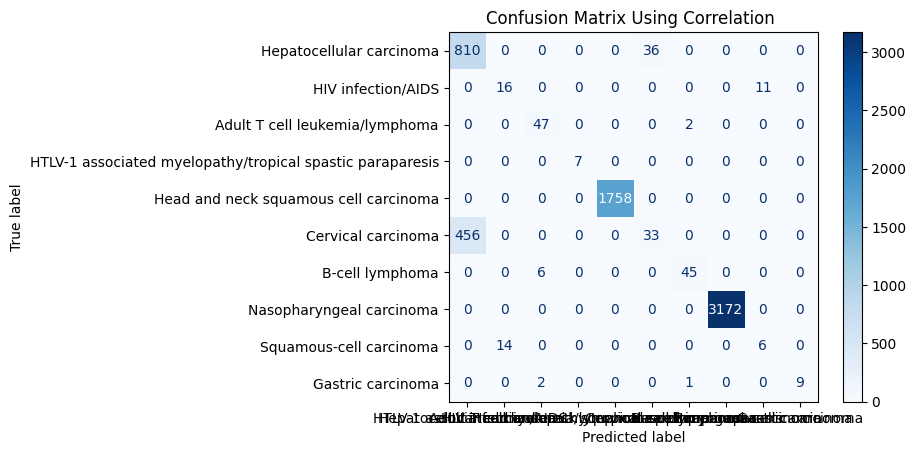

<Figure size 1400x800 with 0 Axes>

In [243]:
c_cm_vc_soft = confusion_matrix(y_test, corr_vc_soft.predict(corr_test))
disp = ConfusionMatrixDisplay(confusion_matrix=c_cm_vc_hard, display_labels=y.value_counts().index)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix Using Correlation ')
plt.figure(figsize=(14, 8))
plt.show()

### Hyper Parameter Tuning

#### Randomized Search CV

In [244]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 4000, num = 60)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt','log2']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 1000,10)]
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10,14]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4,6,8]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
              'criterion':['entropy','gini']}
print(random_grid)

{'n_estimators': [200, 264, 328, 393, 457, 522, 586, 650, 715, 779, 844, 908, 972, 1037, 1101, 1166, 1230, 1294, 1359, 1423, 1488, 1552, 1616, 1681, 1745, 1810, 1874, 1938, 2003, 2067, 2132, 2196, 2261, 2325, 2389, 2454, 2518, 2583, 2647, 2711, 2776, 2840, 2905, 2969, 3033, 3098, 3162, 3227, 3291, 3355, 3420, 3484, 3549, 3613, 3677, 3742, 3806, 3871, 3935, 4000], 'max_features': ['auto', 'sqrt', 'log2'], 'max_depth': [10, 120, 230, 340, 450, 560, 670, 780, 890, 1000], 'min_samples_split': [2, 5, 10, 14], 'min_samples_leaf': [1, 2, 4, 6, 8], 'criterion': ['entropy', 'gini']}


In [245]:
rf=RandomForestClassifier()
rf_randomcv=RandomizedSearchCV(estimator=rf,param_distributions=random_grid,n_iter=100,cv=3,verbose=2,
                               random_state=100,n_jobs=-1)
### fit the randomized model
rf_randomcv.fit(corr_train,y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'criterion': ['entropy', 'gini'],
                                        'max_depth': [10, 120, 230, 340, 450,
                                                      560, 670, 780, 890,
                                                      1000],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4, 6, 8],
                                        'min_samples_split': [2, 5, 10, 14],
                                        'n_estimators': [200, 264, 328, 393,
                                                         457, 522, 586, 650,
                                                         715, 779, 844, 908,
                                                         972, 1037, 1101, 1166,
                                                         1230, 1294, 1359, 1423,
                                                         1488, 1552, 1616, 1681,
                                                         1745, 1810, 1874, 1938,
                                                         2003, 2067, ...]},
                   random_state=100, verbose=2)

In [246]:
best_random_grid=rf_randomcv.best_estimator_

In [247]:
from sklearn.metrics import accuracy_score
best_random_grid.fit(corr_train, y_train)
y_pred=best_random_grid.predict(corr_test)
print(confusion_matrix(y_test,y_pred))
print("Accuracy Score {}".format(accuracy_score(y_test,y_pred)))
print("Classification report: {}".format(classification_report(y_test,y_pred)))

[[ 835    0    0    0    0   11    0    0    0    0]
 [   0   20    0    0    0    0    0    0    7    0]
 [   0    0   43    0    0    0    6    0    0    0]
 [   0    0    0    7    0    0    0    0    0    0]
 [   0    0    0    0 1758    0    0    0    0    0]
 [ 479    0    0    0    0   10    0    0    0    0]
 [   0    0    3    0    0    0   48    0    0    0]
 [   0    0    0    0    0    0    0 3172    0    0]
 [   0   14    0    0    0    0    0    0    6    0]
 [   0    0    4    0    0    0    1    0    0    7]]
Accuracy Score 0.9183641735344426
Classification report:               precision    recall  f1-score   support

           0       0.64      0.99      0.77       846
           1       0.59      0.74      0.66        27
           2       0.86      0.88      0.87        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.48      0.02      0.04       489
           6       0.87      0.94

#### Grid Search CV

In [248]:

param_grid = {
    'criterion': [rf_randomcv.best_params_['criterion']],
    'max_depth': [rf_randomcv.best_params_['max_depth']],
    'max_features': [rf_randomcv.best_params_['max_features']],
    'min_samples_leaf': [rf_randomcv.best_params_['min_samples_leaf'], 
                         rf_randomcv.best_params_['min_samples_leaf']+2, 
                         rf_randomcv.best_params_['min_samples_leaf'] + 4],
    'min_samples_split': [rf_randomcv.best_params_['min_samples_split'] - 2,
                          rf_randomcv.best_params_['min_samples_split'] - 1,
                          rf_randomcv.best_params_['min_samples_split'], 
                          rf_randomcv.best_params_['min_samples_split'] +1,
                          rf_randomcv.best_params_['min_samples_split'] + 2],
    'n_estimators': [rf_randomcv.best_params_['n_estimators'] - 200, rf_randomcv.best_params_['n_estimators'] - 100, 
                     rf_randomcv.best_params_['n_estimators'], 
                     rf_randomcv.best_params_['n_estimators'] + 100, rf_randomcv.best_params_['n_estimators'] + 200]
}

print(param_grid)

{'criterion': ['gini'], 'max_depth': [10], 'max_features': ['log2'], 'min_samples_leaf': [1, 3, 5], 'min_samples_split': [0, 1, 2, 3, 4], 'n_estimators': [515, 615, 715, 815, 915]}


## Information Gain

### Decision Tree

In [249]:
mutual_inf.sort_values(ascending=False)

Virus Name                 1.142628
Sample                     0.762001
VRG                        0.728042
Virus Type                 0.690713
Target Gene                0.485116
End Location               0.463349
Begin Location             0.462783
Chromosome                 0.064151
Sum Overlaps               0.044442
Histone                    0.042501
Factor                     0.027820
Chromatin Accessibility    0.021927
Reference Human Genome     0.004334
dtype: float64

In [250]:
i_train = X_train.copy()
i_test = X_test.copy()

In [251]:
i_train.drop(['Sum Overlaps', 'Histone', 'Chromatin Accessibility', 'Factor', 'Reference Human Genome'], axis=1, inplace=True)
i_test.drop(['Sum Overlaps', 'Histone', 'Chromatin Accessibility', 'Factor', 'Reference Human Genome'], axis=1, inplace=True)

In [252]:
i_dt = DecisionTreeClassifier(random_state=42)
i_dt.fit(i_train, y_train)

DecisionTreeClassifier(random_state=42)

In [253]:
i_preds = i_dt.predict(i_test)

In [254]:
print(accuracy_score(y_train, i_dt.predict(i_train)))

0.9997278382581648


In [255]:
print(accuracy_score(y_test, i_preds))

0.9098118488570984


In [256]:
print(classification_report(y_test, i_preds))

              precision    recall  f1-score   support

           0       0.68      0.65      0.67       846
           1       0.64      0.67      0.65        27
           2       0.89      0.96      0.92        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.44      0.48      0.46       489
           6       0.96      0.88      0.92        51
           7       1.00      1.00      1.00      3172
           8       0.53      0.50      0.51        20
           9       1.00      1.00      1.00        12

    accuracy                           0.91      6431
   macro avg       0.81      0.81      0.81      6431
weighted avg       0.91      0.91      0.91      6431



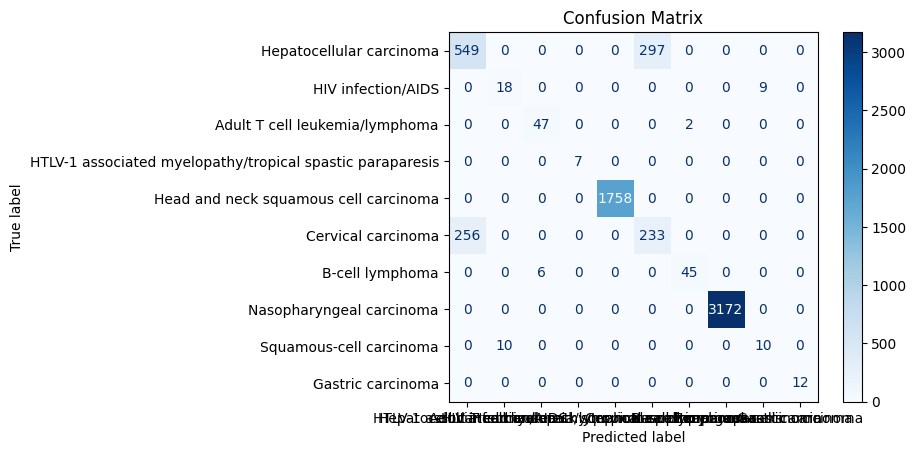

<Figure size 1400x800 with 0 Axes>

In [257]:
cm_inf = confusion_matrix(y_test, i_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm_inf, display_labels=y.value_counts().index)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.figure(figsize=(14, 8))
plt.show()

### Hyper Parameter Tuning

#### RandomizedSearch CV

In [258]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 4000, num = 40)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt','log2']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 1000,10)]
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10,14]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4,6,8]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
              'criterion':['entropy','gini']}
print(random_grid)


{'n_estimators': [200, 297, 394, 492, 589, 687, 784, 882, 979, 1076, 1174, 1271, 1369, 1466, 1564, 1661, 1758, 1856, 1953, 2051, 2148, 2246, 2343, 2441, 2538, 2635, 2733, 2830, 2928, 3025, 3123, 3220, 3317, 3415, 3512, 3610, 3707, 3805, 3902, 4000], 'max_features': ['auto', 'sqrt', 'log2'], 'max_depth': [10, 120, 230, 340, 450, 560, 670, 780, 890, 1000], 'min_samples_split': [2, 5, 10, 14], 'min_samples_leaf': [1, 2, 4, 6, 8], 'criterion': ['entropy', 'gini']}


In [259]:
rf=RandomForestClassifier()
rf_randomcv=RandomizedSearchCV(estimator=rf,param_distributions=random_grid,n_iter=100,cv=3,verbose=2,
                               random_state=100,n_jobs=-1)
### fit the randomized model
rf_randomcv.fit(i_train,y_train)


Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'criterion': ['entropy', 'gini'],
                                        'max_depth': [10, 120, 230, 340, 450,
                                                      560, 670, 780, 890,
                                                      1000],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4, 6, 8],
                                        'min_samples_split': [2, 5, 10, 14],
                                        'n_estimators': [200, 297, 394, 492,
                                                         589, 687, 784, 882,
                                                         979, 1076, 1174, 1271,
                                                         1369, 1466, 1564, 1661,
                                                         1758, 1856, 1953, 2051,
                                                         2148, 2246, 2343, 2441,
                                                         2538, 2635, 2733, 2830,
                                                         2928, 3025, ...]},
                   random_state=100, verbose=2)

In [260]:
best_random_grid=rf_randomcv.best_estimator_

In [261]:
from sklearn.metrics import accuracy_score
best_random_grid.fit(i_train, y_train)
y_pred=best_random_grid.predict(i_test)
print(confusion_matrix(y_test,y_pred))
print("Accuracy Score {}".format(accuracy_score(y_test,y_pred)))
print("Classification report: {}".format(classification_report(y_test,y_pred)))


[[ 836    0    0    0    0   10    0    0    0    0]
 [   0   22    0    0    0    0    0    0    5    0]
 [   0    0   43    0    0    0    5    0    0    1]
 [   0    0    0    7    0    0    0    0    0    0]
 [   0    0    0    0 1758    0    0    0    0    0]
 [ 478    0    0    0    0   11    0    0    0    0]
 [   0    0    4    0    0    0   47    0    0    0]
 [   0    0    0    0    0    0    0 3172    0    0]
 [   0   14    0    0    0    0    0    0    6    0]
 [   0    0    2    0    0    0    1    0    0    9]]
Accuracy Score 0.9191416575960193
Classification report:               precision    recall  f1-score   support

           0       0.64      0.99      0.77       846
           1       0.61      0.81      0.70        27
           2       0.88      0.88      0.88        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.52      0.02      0.04       489
           6       0.89      0.92

### GridSearch Cv

In [262]:
param_grid = {
    'criterion': [rf_randomcv.best_params_['criterion']],
    'max_depth': [rf_randomcv.best_params_['max_depth']],
    'max_features': [rf_randomcv.best_params_['max_features']],
    'min_samples_leaf': [rf_randomcv.best_params_['min_samples_leaf'], 
                         rf_randomcv.best_params_['min_samples_leaf']+2, 
                         rf_randomcv.best_params_['min_samples_leaf'] + 4],
    'min_samples_split': [rf_randomcv.best_params_['min_samples_split'] - 2,
                          rf_randomcv.best_params_['min_samples_split'] - 1,
                          rf_randomcv.best_params_['min_samples_split'], 
                          rf_randomcv.best_params_['min_samples_split'] +1,
                          rf_randomcv.best_params_['min_samples_split'] + 2],
    'n_estimators': [rf_randomcv.best_params_['n_estimators'] - 200, rf_randomcv.best_params_['n_estimators'] - 100, 
                     rf_randomcv.best_params_['n_estimators'], 
                     rf_randomcv.best_params_['n_estimators'] + 100, rf_randomcv.best_params_['n_estimators'] + 200]
}

print(param_grid)


{'criterion': ['entropy'], 'max_depth': [10], 'max_features': ['log2'], 'min_samples_leaf': [1, 3, 5], 'min_samples_split': [3, 4, 5, 6, 7], 'n_estimators': [2630, 2730, 2830, 2930, 3030]}


In [263]:
#### Fit the grid_search to the data
rf=RandomForestClassifier()
grid_search=GridSearchCV(estimator=rf,param_grid=param_grid,cv=10,n_jobs=-1,verbose=2)
grid_search.fit(i_train,y_train)


Fitting 10 folds for each of 75 candidates, totalling 750 fits


GridSearchCV(cv=10, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'criterion': ['entropy'], 'max_depth': [10],
                         'max_features': ['log2'],
                         'min_samples_leaf': [1, 3, 5],
                         'min_samples_split': [3, 4, 5, 6, 7],
                         'n_estimators': [2630, 2730, 2830, 2930, 3030]},
             verbose=2)

In [264]:
best_grid=grid_search.best_estimator_


In [265]:
best_grid.fit(i_train, y_train)
y_pred=best_grid.predict(i_test)
print(confusion_matrix(y_test,y_pred))
print("Accuracy Score {}".format(accuracy_score(y_test,y_pred)))
print("Classification report: {}".format(classification_report(y_test,y_pred)))

[[ 837    0    0    0    0    9    0    0    0    0]
 [   0   22    0    0    0    0    0    0    5    0]
 [   0    0   43    0    0    0    5    0    0    1]
 [   0    0    0    7    0    0    0    0    0    0]
 [   0    0    0    0 1758    0    0    0    0    0]
 [ 481    0    0    0    0    8    0    0    0    0]
 [   0    0    4    0    0    0   47    0    0    0]
 [   0    0    0    0    0    0    0 3172    0    0]
 [   0   14    0    0    0    0    0    0    6    0]
 [   0    0    2    0    0    0    1    0    0    9]]
Accuracy Score 0.9188306639713886
Classification report:               precision    recall  f1-score   support

           0       0.64      0.99      0.77       846
           1       0.61      0.81      0.70        27
           2       0.88      0.88      0.88        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.47      0.02      0.03       489
           6       0.89      0.92

### Random Forest

In [266]:
i_rf = RandomForestClassifier(random_state=42)
i_rf.fit(i_train, y_train)

RandomForestClassifier(random_state=42)

In [267]:
print(accuracy_score(y_train, i_rf.predict(i_train)))

0.9997278382581648


In [268]:
print(accuracy_score(y_test, i_rf.predict(i_test)))

0.9068574094231068


In [269]:
print(classification_report(y_test, i_rf.predict(i_test)))

              precision    recall  f1-score   support

           0       0.67      0.66      0.66       846
           1       0.61      0.70      0.66        27
           2       0.84      0.94      0.88        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.42      0.44      0.43       489
           6       0.92      0.88      0.90        51
           7       1.00      1.00      1.00      3172
           8       0.50      0.40      0.44        20
           9       0.88      0.58      0.70        12

    accuracy                           0.91      6431
   macro avg       0.78      0.76      0.77      6431
weighted avg       0.91      0.91      0.91      6431



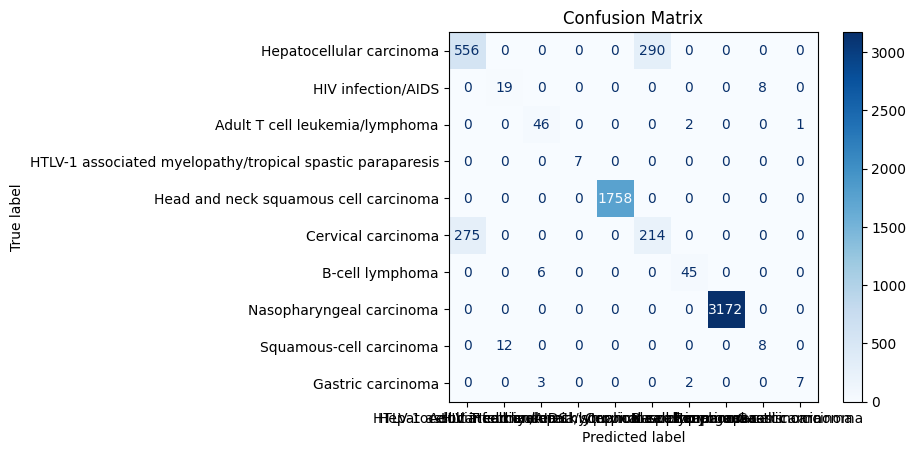

<Figure size 1400x800 with 0 Axes>

In [270]:
i_cm_rf = confusion_matrix(y_test, i_rf.predict(i_test))
disp = ConfusionMatrixDisplay(confusion_matrix=i_cm_rf, display_labels=y.value_counts().index)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.figure(figsize=(14, 8))
plt.show()

### Hyper Parameter Tuning

#### RandomizedSearch Cv

In [271]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 4000, num = 40)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt','log2']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 1000,10)]
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10,14]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4,6,8]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
              'criterion':['entropy','gini']}
print(random_grid)

{'n_estimators': [200, 297, 394, 492, 589, 687, 784, 882, 979, 1076, 1174, 1271, 1369, 1466, 1564, 1661, 1758, 1856, 1953, 2051, 2148, 2246, 2343, 2441, 2538, 2635, 2733, 2830, 2928, 3025, 3123, 3220, 3317, 3415, 3512, 3610, 3707, 3805, 3902, 4000], 'max_features': ['auto', 'sqrt', 'log2'], 'max_depth': [10, 120, 230, 340, 450, 560, 670, 780, 890, 1000], 'min_samples_split': [2, 5, 10, 14], 'min_samples_leaf': [1, 2, 4, 6, 8], 'criterion': ['entropy', 'gini']}


In [272]:
rf=RandomForestClassifier()
rf_randomcv=RandomizedSearchCV(estimator=rf,param_distributions=random_grid,n_iter=100,cv=3,verbose=2,
                               random_state=100,n_jobs=-1)
### fit the randomized model
rf_randomcv.fit(i_train,y_train)


Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'criterion': ['entropy', 'gini'],
                                        'max_depth': [10, 120, 230, 340, 450,
                                                      560, 670, 780, 890,
                                                      1000],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4, 6, 8],
                                        'min_samples_split': [2, 5, 10, 14],
                                        'n_estimators': [200, 297, 394, 492,
                                                         589, 687, 784, 882,
                                                         979, 1076, 1174, 1271,
                                                         1369, 1466, 1564, 1661,
                                                         1758, 1856, 1953, 2051,
                                                         2148, 2246, 2343, 2441,
                                                         2538, 2635, 2733, 2830,
                                                         2928, 3025, ...]},
                   random_state=100, verbose=2)

In [273]:
best_random_grid=rf_randomcv.best_estimator_


In [274]:
from sklearn.metrics import accuracy_score
best_random_grid.fit(i_train, y_train)
y_pred=best_random_grid.predict(i_test)
print(confusion_matrix(y_test,y_pred))
print("Accuracy Score {}".format(accuracy_score(y_test,y_pred)))
print("Classification report: {}".format(classification_report(y_test,y_pred)))

[[ 836    0    0    0    0   10    0    0    0    0]
 [   0   22    0    0    0    0    0    0    5    0]
 [   0    0   43    0    0    0    5    0    0    1]
 [   0    0    0    7    0    0    0    0    0    0]
 [   0    0    0    0 1758    0    0    0    0    0]
 [ 479    0    0    0    0   10    0    0    0    0]
 [   0    0    4    0    0    0   47    0    0    0]
 [   0    0    0    0    0    0    0 3172    0    0]
 [   0   15    0    0    0    0    0    0    5    0]
 [   0    0    2    0    0    0    1    0    0    9]]
Accuracy Score 0.9188306639713886
Classification report:               precision    recall  f1-score   support

           0       0.64      0.99      0.77       846
           1       0.59      0.81      0.69        27
           2       0.88      0.88      0.88        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.50      0.02      0.04       489
           6       0.89      0.92

#### GridSearchCV

In [275]:
param_grid = {
    'criterion': [rf_randomcv.best_params_['criterion']],
    'max_depth': [rf_randomcv.best_params_['max_depth']],
    'max_features': [rf_randomcv.best_params_['max_features']],
    'min_samples_leaf': [rf_randomcv.best_params_['min_samples_leaf'], 
                         rf_randomcv.best_params_['min_samples_leaf']+2, 
                         rf_randomcv.best_params_['min_samples_leaf'] + 4],
    'min_samples_split': [rf_randomcv.best_params_['min_samples_split'] - 2,
                          rf_randomcv.best_params_['min_samples_split'] - 1,
                          rf_randomcv.best_params_['min_samples_split'], 
                          rf_randomcv.best_params_['min_samples_split'] +1,
                          rf_randomcv.best_params_['min_samples_split'] + 2],
    'n_estimators': [rf_randomcv.best_params_['n_estimators'] - 200, rf_randomcv.best_params_['n_estimators'] - 100, 
                     rf_randomcv.best_params_['n_estimators'], 
                     rf_randomcv.best_params_['n_estimators'] + 100, rf_randomcv.best_params_['n_estimators'] + 200]
}

print(param_grid)


{'criterion': ['entropy'], 'max_depth': [10], 'max_features': ['log2'], 'min_samples_leaf': [1, 3, 5], 'min_samples_split': [3, 4, 5, 6, 7], 'n_estimators': [2630, 2730, 2830, 2930, 3030]}


In [276]:
#### Fit the grid_search to the data
rf=RandomForestClassifier()
grid_search=GridSearchCV(estimator=rf,param_grid=param_grid,cv=10,n_jobs=-1,verbose=2)
grid_search.fit(i_train,y_train)

Fitting 10 folds for each of 75 candidates, totalling 750 fits


GridSearchCV(cv=10, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'criterion': ['entropy'], 'max_depth': [10],
                         'max_features': ['log2'],
                         'min_samples_leaf': [1, 3, 5],
                         'min_samples_split': [3, 4, 5, 6, 7],
                         'n_estimators': [2630, 2730, 2830, 2930, 3030]},
             verbose=2)

In [277]:
best_grid=grid_search.best_estimator_


In [278]:
best_grid.fit(i_train, y_train)
y_pred=best_grid.predict(i_test)
print(confusion_matrix(y_test,y_pred))
print("Accuracy Score {}".format(accuracy_score(y_test,y_pred)))
print("Classification report: {}".format(classification_report(y_test,y_pred)))


[[ 836    0    0    0    0   10    0    0    0    0]
 [   0   22    0    0    0    0    0    0    5    0]
 [   0    0   43    0    0    0    5    0    0    1]
 [   0    0    0    7    0    0    0    0    0    0]
 [   0    0    0    0 1758    0    0    0    0    0]
 [ 480    0    0    0    0    9    0    0    0    0]
 [   0    0    4    0    0    0   47    0    0    0]
 [   0    0    0    0    0    0    0 3172    0    0]
 [   0   15    0    0    0    0    0    0    5    0]
 [   0    0    2    0    0    0    1    0    0    9]]
Accuracy Score 0.9186751671590733
Classification report:               precision    recall  f1-score   support

           0       0.64      0.99      0.77       846
           1       0.59      0.81      0.69        27
           2       0.88      0.88      0.88        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.47      0.02      0.04       489
           6       0.89      0.92

### Naive Bayes

In [279]:
i_nb = GaussianNB()
i_nb.fit(i_train, y_train)

GaussianNB()

In [280]:
print(accuracy_score(y_train, i_nb.predict(i_train)))

0.9065318818040435


In [281]:
print(accuracy_score(y_test, i_nb.predict(i_test)))

0.9065464157984762


In [282]:
print(classification_report(y_test, i_nb.predict(i_test)))

              precision    recall  f1-score   support

           0       0.64      0.96      0.77       846
           1       0.57      1.00      0.73        27
           2       0.82      0.18      0.30        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.49      0.06      0.11       489
           6       0.00      0.00      0.00        51
           7       1.00      1.00      1.00      3172
           8       0.00      0.00      0.00        20
           9       0.12      1.00      0.21        12

    accuracy                           0.91      6431
   macro avg       0.56      0.62      0.51      6431
weighted avg       0.90      0.91      0.88      6431



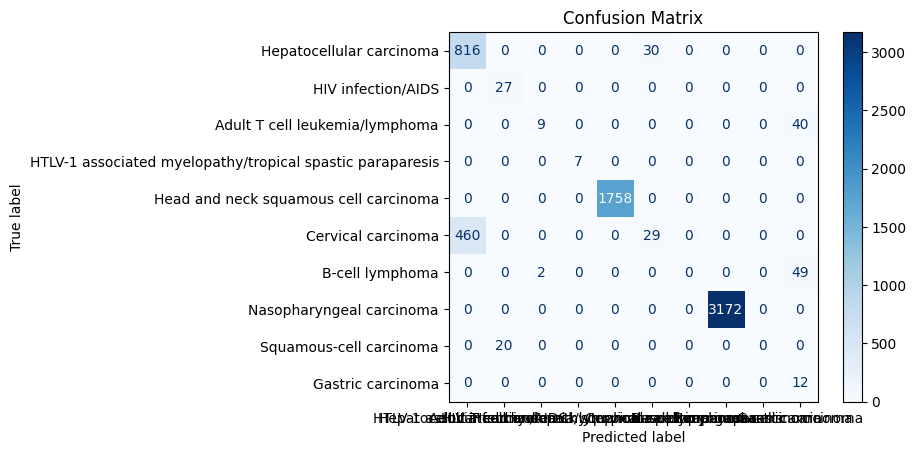

<Figure size 1400x800 with 0 Axes>

In [283]:
i_cm_nb = confusion_matrix(y_test, i_nb.predict(i_test))
disp = ConfusionMatrixDisplay(confusion_matrix=i_cm_nb, display_labels=y.value_counts().index)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.figure(figsize=(14, 8))
plt.show()

### Multinomial NB

In [284]:
i_mnb = MultinomialNB()
i_mnb.fit(i_train, y_train)

MultinomialNB()

In [285]:
print(accuracy_score(y_train, i_mnb.predict(i_train)))

0.7666407465007776


In [286]:
print(accuracy_score(y_test, i_mnb.predict(i_test)))

0.7665992847146633


In [287]:
print(classification_report(y_test, i_mnb.predict(i_test)))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       846
           1       0.00      0.00      0.00        27
           2       0.00      0.00      0.00        49
           3       0.00      0.00      0.00         7
           4       0.57      1.00      0.72      1758
           5       0.00      0.00      0.00       489
           6       0.00      0.00      0.00        51
           7       0.95      1.00      0.97      3172
           8       0.00      0.00      0.00        20
           9       0.00      0.00      0.00        12

    accuracy                           0.77      6431
   macro avg       0.15      0.20      0.17      6431
weighted avg       0.62      0.77      0.68      6431



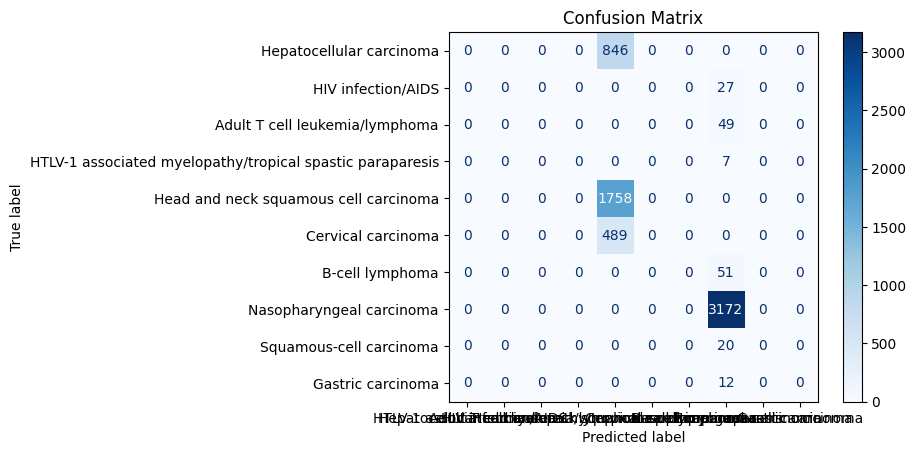

<Figure size 1400x800 with 0 Axes>

In [288]:
i_cm_mnb = confusion_matrix(y_test, i_mnb.predict(i_test))
disp = ConfusionMatrixDisplay(confusion_matrix=i_cm_mnb, display_labels=y.value_counts().index)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.figure(figsize=(14, 8))
plt.show()

### Logistic Regression

In [289]:
i_lr = LogisticRegression()
i_lr.fit(i_train, y_train)

LogisticRegression()

In [290]:
print(accuracy_score(y_train, i_lr.predict(i_train)))

0.9079315707620529


In [291]:
print(accuracy_score(y_test, i_lr.predict(i_test)))

0.908723371170891


In [292]:
print(classification_report(y_test, i_lr.predict(i_test)))

              precision    recall  f1-score   support

           0       0.63      1.00      0.78       846
           1       0.00      0.00      0.00        27
           2       0.70      0.47      0.56        49
           3       0.00      0.00      0.00         7
           4       1.00      1.00      1.00      1758
           5       0.00      0.00      0.00       489
           6       0.66      0.88      0.76        51
           7       0.98      1.00      0.99      3172
           8       0.00      0.00      0.00        20
           9       0.00      0.00      0.00        12

    accuracy                           0.91      6431
   macro avg       0.40      0.44      0.41      6431
weighted avg       0.85      0.91      0.87      6431



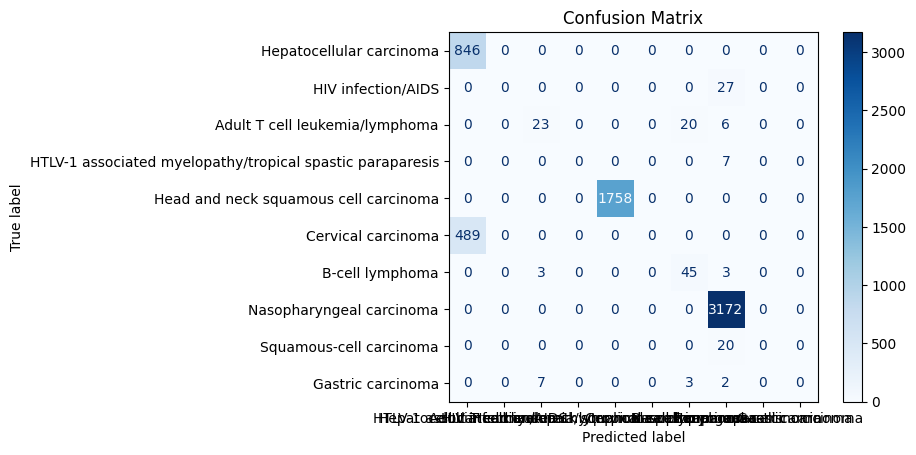

<Figure size 1400x800 with 0 Axes>

In [293]:
i_cm_lr = confusion_matrix(y_test, i_lr.predict(i_test))
disp = ConfusionMatrixDisplay(confusion_matrix=i_cm_lr, display_labels=y.value_counts().index)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.figure(figsize=(14, 8))
plt.show()

### XGBoost Classifier

In [294]:
i_xg = XGBClassifier()
i_xg.fit(i_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [295]:
print(accuracy_score(y_train, i_xg.predict(i_train)))

0.9522550544323484


In [296]:
print(accuracy_score(y_test, i_xg.predict(i_test)))

0.9118333074171979


In [297]:
print(classification_report(y_test, i_xg.predict(i_test)))

              precision    recall  f1-score   support

           0       0.65      0.78      0.71       846
           1       0.61      0.63      0.62        27
           2       0.94      0.96      0.95        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.42      0.27      0.33       489
           6       0.94      0.94      0.94        51
           7       1.00      1.00      1.00      3172
           8       0.47      0.45      0.46        20
           9       1.00      0.92      0.96        12

    accuracy                           0.91      6431
   macro avg       0.80      0.80      0.80      6431
weighted avg       0.91      0.91      0.91      6431



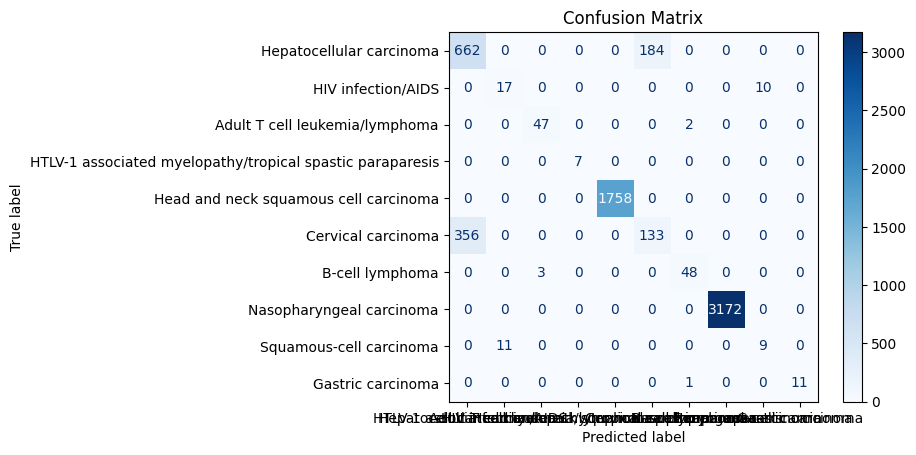

<Figure size 1400x800 with 0 Axes>

In [298]:
i_cm_xg = confusion_matrix(y_test, i_xg.predict(i_test))
disp = ConfusionMatrixDisplay(confusion_matrix=i_cm_xg, display_labels=y.value_counts().index)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.figure(figsize=(14, 8))
plt.show()

### KNN

In [299]:
i_knn = KNeighborsClassifier(n_neighbors=4)
i_knn.fit(i_train, y_train)

KNeighborsClassifier(n_neighbors=4)

In [300]:
print(accuracy_score(y_train, i_knn.predict(i_train)))

0.9382192846034214


In [301]:
print(accuracy_score(y_test, i_knn.predict(i_test)))

0.9107448297309905


In [302]:
print(classification_report(y_test, i_knn.predict(i_test)))

              precision    recall  f1-score   support

           0       0.64      0.87      0.74       846
           1       0.54      0.78      0.64        27
           2       0.72      0.90      0.80        49
           3       1.00      0.43      0.60         7
           4       1.00      1.00      1.00      1758
           5       0.42      0.17      0.24       489
           6       0.85      0.76      0.80        51
           7       1.00      1.00      1.00      3172
           8       0.25      0.10      0.14        20
           9       0.75      0.25      0.38        12

    accuracy                           0.91      6431
   macro avg       0.72      0.63      0.63      6431
weighted avg       0.90      0.91      0.90      6431



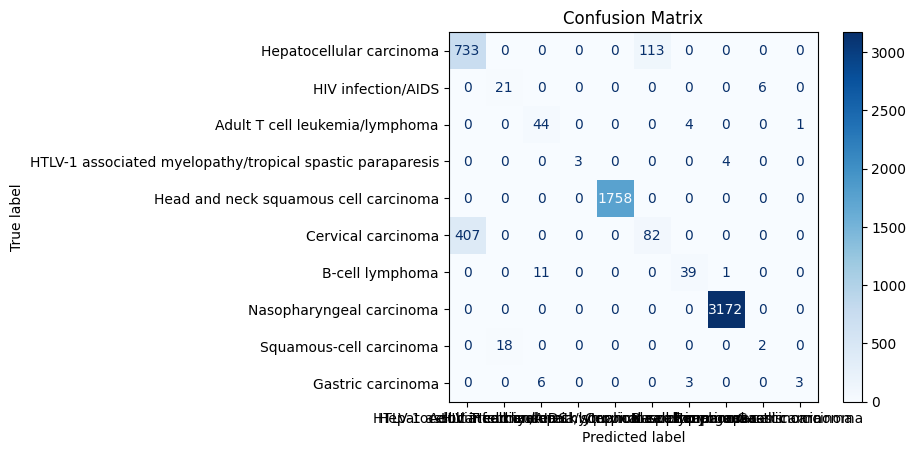

<Figure size 1400x800 with 0 Axes>

In [303]:
i_cm_knn = confusion_matrix(y_test, i_knn.predict(i_test))
disp = ConfusionMatrixDisplay(confusion_matrix=i_cm_knn, display_labels=y.value_counts().index)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.figure(figsize=(14, 8))
plt.show()

### SVC

In [304]:
i_svc = SVC(kernel='rbf')
i_svc.fit(i_train, y_train)

SVC()

In [305]:
print(accuracy_score(y_train, i_svc.predict(i_train)))

0.9150077760497667


In [306]:
print(accuracy_score(y_test, i_svc.predict(i_test)))

0.9141657596019281


In [307]:
print(classification_report(y_train, i_svc.predict(i_train)))

              precision    recall  f1-score   support

           0       0.63      1.00      0.78      3382
           1       0.59      0.97      0.73       111
           2       0.78      0.54      0.63       194
           3       0.90      0.90      0.90        29
           4       1.00      1.00      1.00      7030
           5       0.00      0.00      0.00      1955
           6       0.62      0.94      0.75       205
           7       1.00      1.00      1.00     12688
           8       0.50      0.04      0.07        79
           9       0.00      0.00      0.00        47

    accuracy                           0.92     25720
   macro avg       0.60      0.64      0.59     25720
weighted avg       0.87      0.92      0.88     25720



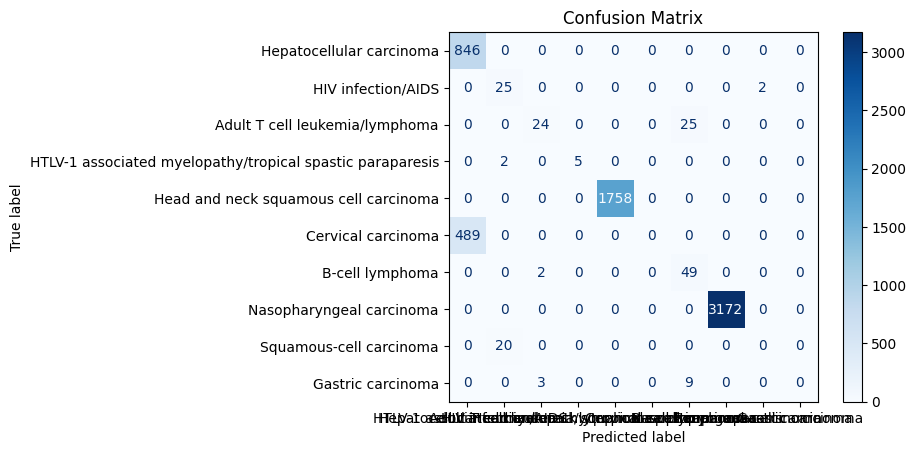

<Figure size 1400x800 with 0 Axes>

In [308]:
i_cm_svc = confusion_matrix(y_test, i_svc.predict(i_test))
disp = ConfusionMatrixDisplay(confusion_matrix=i_cm_svc, display_labels=y.value_counts().index)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.figure(figsize=(14, 8))
plt.show()

### Voting Classifier

### Hard

In [309]:
i_vc_hard = VotingClassifier(estimators=estimator, voting='hard')
i_vc_hard.fit(i_train, y_train)

VotingClassifier(estimators=[('RandomForest',
                              RandomForestClassifier(random_state=42)),
                             ('XGB',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None, device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None, gamma=None,
                                            grow_policy=None,
                                            impo...
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            multi_strategy=None,
                                            n_estimators=None, n_jobs=None,
                                            num_parallel_tree=None,
                                            random_state=None, ...)),
                             ('DecisionTree',
                              DecisionTreeClassifier(random_state=42)),
                             ('KNN', KNeighborsClassifier(n_neighbors=4)),
                             ('Gradient Boosting',
                              GradientBoostingClassifier(random_state=42)),
                             ('Ada Boost',
                              AdaBoostClassifier(random_state=42))])

In [310]:
print(accuracy_score(y_train, i_vc_hard.predict(i_train)))

0.9490668740279938


In [311]:
print(accuracy_score(y_test, i_vc_hard.predict(i_test)))

0.9177421862851811


In [312]:
print(classification_report(y_test, i_vc_hard.predict(i_test)))

              precision    recall  f1-score   support

           0       0.65      0.91      0.76       846
           1       0.64      0.78      0.70        27
           2       0.84      0.96      0.90        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.47      0.14      0.21       489
           6       0.94      0.88      0.91        51
           7       1.00      1.00      1.00      3172
           8       0.57      0.40      0.47        20
           9       1.00      0.67      0.80        12

    accuracy                           0.92      6431
   macro avg       0.81      0.77      0.77      6431
weighted avg       0.91      0.92      0.90      6431



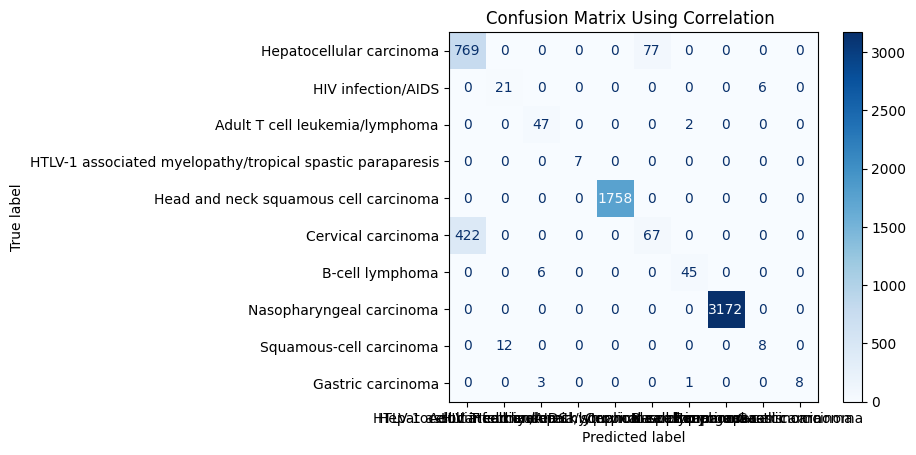

<Figure size 1400x800 with 0 Axes>

In [313]:
i_cm_vc_hard = confusion_matrix(y_test, i_vc_hard.predict(i_test))
disp = ConfusionMatrixDisplay(confusion_matrix=i_cm_vc_hard, display_labels=y.value_counts().index)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix Using Correlation ')
plt.figure(figsize=(14, 8))
plt.show()

### Soft

In [314]:
i_vc_soft = VotingClassifier(estimators=estimator, voting='soft')
i_vc_soft.fit(i_train, y_train)

VotingClassifier(estimators=[('RandomForest',
                              RandomForestClassifier(random_state=42)),
                             ('XGB',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None, device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None, gamma=None,
                                            grow_policy=None,
                                            impo...
                                            monotone_constraints=None,
                                            multi_strategy=None,
                                            n_estimators=None, n_jobs=None,
                                            num_parallel_tree=None,
                                            random_state=None, ...)),
                             ('DecisionTree',
                              DecisionTreeClassifier(random_state=42)),
                             ('KNN', KNeighborsClassifier(n_neighbors=4)),
                             ('Gradient Boosting',
                              GradientBoostingClassifier(random_state=42)),
                             ('Ada Boost',
                              AdaBoostClassifier(random_state=42))],
                 voting='soft')

In [315]:
print(accuracy_score(y_train, i_vc_soft.predict(i_train)))

0.995606531881804


In [316]:
print(accuracy_score(y_test, i_vc_soft.predict(i_test)))

0.9102783392940444


In [317]:
print(classification_report(y_test, i_vc_soft.predict(i_test)))

              precision    recall  f1-score   support

           0       0.67      0.69      0.68       846
           1       0.62      0.74      0.68        27
           2       0.87      0.96      0.91        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.44      0.42      0.43       489
           6       0.94      0.88      0.91        51
           7       1.00      1.00      1.00      3172
           8       0.53      0.40      0.46        20
           9       1.00      0.83      0.91        12

    accuracy                           0.91      6431
   macro avg       0.81      0.79      0.80      6431
weighted avg       0.91      0.91      0.91      6431



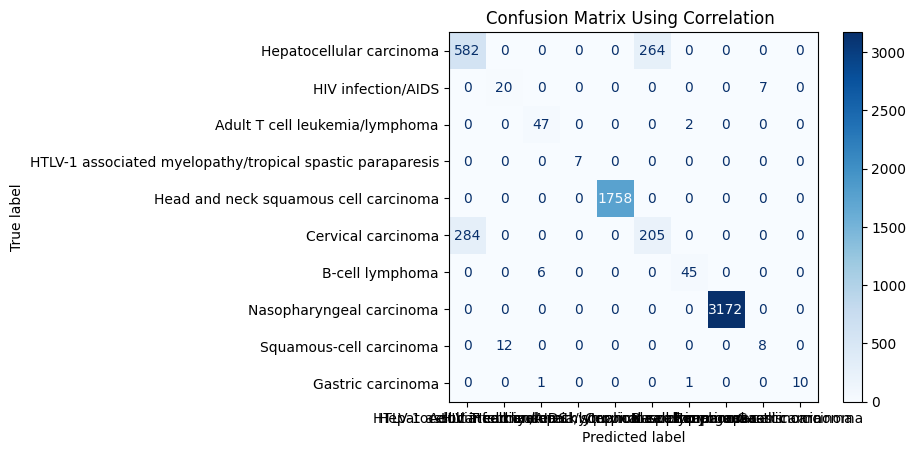

<Figure size 1400x800 with 0 Axes>

In [318]:
i_cm_vc_soft = confusion_matrix(y_test, i_vc_soft.predict(i_test))
disp = ConfusionMatrixDisplay(confusion_matrix=i_cm_vc_soft, display_labels=y.value_counts().index)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix Using Correlation ')
plt.figure(figsize=(14, 8))
plt.show()

## RFECV

### Decision Tree 

In [73]:
rfe_train = X_train.copy()
rfe_test = X_test.copy()

In [74]:
rfe_train.drop(['Reference Human Genome'], axis=1, inplace=True)
rfe_test.drop(['Reference Human Genome'], axis=1, inplace=True)

In [75]:
rfe_train.columns

Index(['Chromosome', 'Begin Location', 'End Location', 'Histone', 'Factor',
       'Chromatin Accessibility', 'Sum Overlaps', 'VRG', 'Sample',
       'Target Gene', 'Virus Name', 'Virus Type'],
      dtype='object')

In [82]:
rfe_dt = DecisionTreeClassifier(random_state=42)
rfe_dt.fit(rfe_train, y_train)

DecisionTreeClassifier(random_state=42)

In [83]:
rfe_preds = rfe_dt.predict(rfe_test)

In [84]:
print(accuracy_score(y_train, rfe_dt.predict(rfe_train)))

0.9999611197511664


In [85]:
print(accuracy_score(y_test, rfe_preds))

0.9112113201679366


In [326]:
print(classification_report(y_test, rfe_preds))

              precision    recall  f1-score   support

           0       0.68      0.69      0.68       846
           1       0.52      0.48      0.50        27
           2       0.88      0.92      0.90        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.45      0.45      0.45       489
           6       0.94      0.90      0.92        51
           7       1.00      1.00      1.00      3172
           8       0.36      0.40      0.38        20
           9       0.92      0.92      0.92        12

    accuracy                           0.91      6431
   macro avg       0.78      0.78      0.78      6431
weighted avg       0.91      0.91      0.91      6431



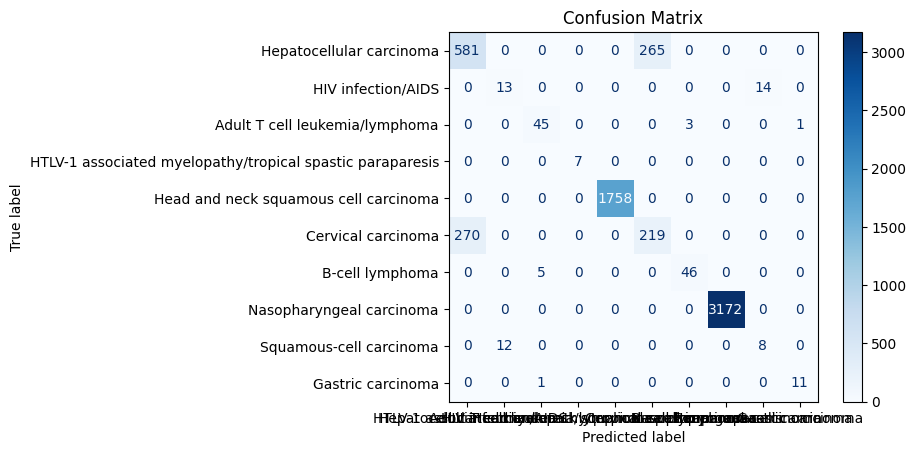

<Figure size 1400x800 with 0 Axes>

In [327]:
cm_rfe = confusion_matrix(y_test, rfe_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm_rfe, display_labels=y.value_counts().index)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.figure(figsize=(14, 8))
plt.show()

### Hyper Parameter Tuning

#### RandomisedSearch Cv

In [328]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 4000, num = 40)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt','log2']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 1000,10)]
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10,14]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4,6,8]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
              'criterion':['entropy','gini']}
print(random_grid)


{'n_estimators': [200, 297, 394, 492, 589, 687, 784, 882, 979, 1076, 1174, 1271, 1369, 1466, 1564, 1661, 1758, 1856, 1953, 2051, 2148, 2246, 2343, 2441, 2538, 2635, 2733, 2830, 2928, 3025, 3123, 3220, 3317, 3415, 3512, 3610, 3707, 3805, 3902, 4000], 'max_features': ['auto', 'sqrt', 'log2'], 'max_depth': [10, 120, 230, 340, 450, 560, 670, 780, 890, 1000], 'min_samples_split': [2, 5, 10, 14], 'min_samples_leaf': [1, 2, 4, 6, 8], 'criterion': ['entropy', 'gini']}


In [329]:
rf=RandomForestClassifier()
rf_randomcv=RandomizedSearchCV(estimator=rf,param_distributions=random_grid,n_iter=100,cv=3,verbose=2,
                               random_state=100,n_jobs=-1)
### fit the randomized model
rf_randomcv.fit(rfe_train,y_train)


Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'criterion': ['entropy', 'gini'],
                                        'max_depth': [10, 120, 230, 340, 450,
                                                      560, 670, 780, 890,
                                                      1000],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4, 6, 8],
                                        'min_samples_split': [2, 5, 10, 14],
                                        'n_estimators': [200, 297, 394, 492,
                                                         589, 687, 784, 882,
                                                         979, 1076, 1174, 1271,
                                                         1369, 1466, 1564, 1661,
                                                         1758, 1856, 1953, 2051,
                                                         2148, 2246, 2343, 2441,
                                                         2538, 2635, 2733, 2830,
                                                         2928, 3025, ...]},
                   random_state=100, verbose=2)

In [330]:
best_random_grid=rf_randomcv.best_estimator_

In [331]:

from sklearn.metrics import accuracy_score
best_random_grid.fit(rfe_train, y_train)
y_pred=best_random_grid.predict(rfe_test)
print(confusion_matrix(y_test,y_pred))
print("Accuracy Score {}".format(accuracy_score(y_test,y_pred)))
print("Classification report: {}".format(classification_report(y_test,y_pred)))


[[ 772    0    0    0    0   74    0    0    0    0]
 [   0   18    0    0    0    0    0    0    9    0]
 [   0    0   42    0    0    0    7    0    0    0]
 [   0    0    0    7    0    0    0    0    0    0]
 [   0    0    0    0 1758    0    0    0    0    0]
 [ 399    0    0    0    0   90    0    0    0    0]
 [   0    0    5    0    0    0   46    0    0    0]
 [   0    0    0    0    0    0    0 3172    0    0]
 [   0   13    0    0    0    0    0    0    7    0]
 [   0    0    6    0    0    0    1    0    0    5]]
Accuracy Score 0.9200746384699113
Classification report:               precision    recall  f1-score   support

           0       0.66      0.91      0.77       846
           1       0.58      0.67      0.62        27
           2       0.79      0.86      0.82        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.55      0.18      0.28       489
           6       0.85      0.90

#### GridSearchCV

In [332]:
param_grid = {
    'criterion': [rf_randomcv.best_params_['criterion']],
    'max_depth': [rf_randomcv.best_params_['max_depth']],
    'max_features': [rf_randomcv.best_params_['max_features']],
    'min_samples_leaf': [rf_randomcv.best_params_['min_samples_leaf'], 
                         rf_randomcv.best_params_['min_samples_leaf']+2, 
                         rf_randomcv.best_params_['min_samples_leaf'] + 4],
    'min_samples_split': [rf_randomcv.best_params_['min_samples_split'] - 2,
                          rf_randomcv.best_params_['min_samples_split'] - 1,
                          rf_randomcv.best_params_['min_samples_split'], 
                          rf_randomcv.best_params_['min_samples_split'] +1,
                          rf_randomcv.best_params_['min_samples_split'] + 2],
    'n_estimators': [rf_randomcv.best_params_['n_estimators'] - 200, rf_randomcv.best_params_['n_estimators'] - 100, 
                     rf_randomcv.best_params_['n_estimators'], 
                     rf_randomcv.best_params_['n_estimators'] + 100, rf_randomcv.best_params_['n_estimators'] + 200]
}

print(param_grid)


{'criterion': ['entropy'], 'max_depth': [670], 'max_features': ['log2'], 'min_samples_leaf': [2, 4, 6], 'min_samples_split': [12, 13, 14, 15, 16], 'n_estimators': [2338, 2438, 2538, 2638, 2738]}


In [333]:
#### Fit the grid_search to the data
rf=RandomForestClassifier()
grid_search=GridSearchCV(estimator=rf,param_grid=param_grid,cv=10,n_jobs=-1,verbose=2)
grid_search.fit(rfe_train,y_train)


Fitting 10 folds for each of 75 candidates, totalling 750 fits


GridSearchCV(cv=10, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'criterion': ['entropy'], 'max_depth': [670],
                         'max_features': ['log2'],
                         'min_samples_leaf': [2, 4, 6],
                         'min_samples_split': [12, 13, 14, 15, 16],
                         'n_estimators': [2338, 2438, 2538, 2638, 2738]},
             verbose=2)

In [334]:
best_grid=grid_search.best_estimator_


In [335]:
best_grid.fit(rfe_train, y_train)
y_pred=best_grid.predict(rfe_test)
print(confusion_matrix(y_test,y_pred))
print("Accuracy Score {}".format(accuracy_score(y_test,y_pred)))
print("Classification report: {}".format(classification_report(y_test,y_pred)))


[[ 766    0    0    0    0   80    0    0    0    0]
 [   0   18    0    0    0    0    0    0    9    0]
 [   0    0   43    0    0    0    6    0    0    0]
 [   0    0    0    7    0    0    0    0    0    0]
 [   0    0    0    0 1758    0    0    0    0    0]
 [ 398    0    0    0    0   91    0    0    0    0]
 [   0    0    4    0    0    0   47    0    0    0]
 [   0    0    0    0    0    0    0 3172    0    0]
 [   0   14    0    0    0    0    0    0    6    0]
 [   0    0    6    0    0    0    1    0    0    5]]
Accuracy Score 0.91945265122065
Classification report:               precision    recall  f1-score   support

           0       0.66      0.91      0.76       846
           1       0.56      0.67      0.61        27
           2       0.81      0.88      0.84        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.53      0.19      0.28       489
           6       0.87      0.92  

In [336]:
cleaned_df.to_csv('MainData.csv')

### Random Forest

In [76]:
rfe_rf = RandomForestClassifier(random_state=42)
rfe_rf.fit(rfe_train, y_train)

RandomForestClassifier(random_state=42)

In [77]:
print(accuracy_score(y_train, rfe_rf.predict(rfe_train)))

0.9999611197511664


In [78]:
print(accuracy_score(y_test, rfe_rf.predict(rfe_test)))

0.9185196703467579


In [89]:
print(classification_report(y_test, rfe_rf.predict(rfe_test)))

              precision    recall  f1-score   support

           0       0.67      0.85      0.75       846
           1       0.58      0.67      0.62        27
           2       0.82      0.94      0.88        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.50      0.27      0.35       489
           6       0.90      0.88      0.89        51
           7       1.00      1.00      1.00      3172
           8       0.44      0.35      0.39        20
           9       1.00      0.50      0.67        12

    accuracy                           0.92      6431
   macro avg       0.79      0.75      0.75      6431
weighted avg       0.91      0.92      0.91      6431



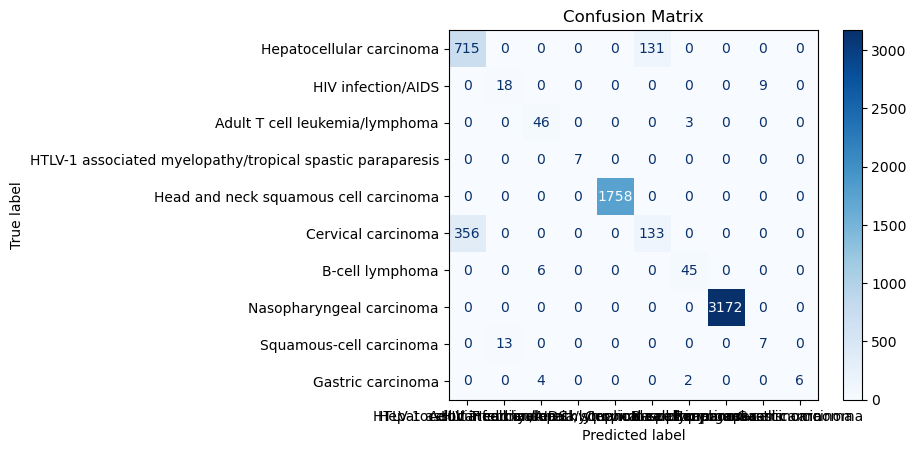

<Figure size 1400x800 with 0 Axes>

In [90]:
rfe_cm_rf = confusion_matrix(y_test, rfe_rf.predict(rfe_test))
disp = ConfusionMatrixDisplay(confusion_matrix=rfe_cm_rf, display_labels=y.value_counts().index)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.figure(figsize=(14, 8))
plt.show()

### Hyper Parameter Tuning

#### RandomizedSearchCV

In [342]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 4000, num = 40)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt','log2']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 1000,10)]
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10,14]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4,6,8]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
              'criterion':['entropy','gini']}
print(random_grid)


{'n_estimators': [200, 297, 394, 492, 589, 687, 784, 882, 979, 1076, 1174, 1271, 1369, 1466, 1564, 1661, 1758, 1856, 1953, 2051, 2148, 2246, 2343, 2441, 2538, 2635, 2733, 2830, 2928, 3025, 3123, 3220, 3317, 3415, 3512, 3610, 3707, 3805, 3902, 4000], 'max_features': ['auto', 'sqrt', 'log2'], 'max_depth': [10, 120, 230, 340, 450, 560, 670, 780, 890, 1000], 'min_samples_split': [2, 5, 10, 14], 'min_samples_leaf': [1, 2, 4, 6, 8], 'criterion': ['entropy', 'gini']}


In [343]:
rf=RandomForestClassifier()
rf_randomcv=RandomizedSearchCV(estimator=rf,param_distributions=random_grid,n_iter=100,cv=3,verbose=2,
                               random_state=100,n_jobs=-1)
### fit the randomized model
rf_randomcv.fit(rfe_train,y_train)



Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'criterion': ['entropy', 'gini'],
                                        'max_depth': [10, 120, 230, 340, 450,
                                                      560, 670, 780, 890,
                                                      1000],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4, 6, 8],
                                        'min_samples_split': [2, 5, 10, 14],
                                        'n_estimators': [200, 297, 394, 492,
                                                         589, 687, 784, 882,
                                                         979, 1076, 1174, 1271,
                                                         1369, 1466, 1564, 1661,
                                                         1758, 1856, 1953, 2051,
                                                         2148, 2246, 2343, 2441,
                                                         2538, 2635, 2733, 2830,
                                                         2928, 3025, ...]},
                   random_state=100, verbose=2)

In [344]:
best_random_grid=rf_randomcv.best_estimator_


In [345]:
from sklearn.metrics import accuracy_score
best_random_grid.fit(rfe_train, y_train)
y_pred=best_random_grid.predict(rfe_test)
print(confusion_matrix(y_test,y_pred))
print("Accuracy Score {}".format(accuracy_score(y_test,y_pred)))
print("Classification report: {}".format(classification_report(y_test,y_pred)))


[[ 838    0    0    0    0    8    0    0    0    0]
 [   0   22    0    0    0    0    0    0    5    0]
 [   0    0   43    0    0    0    6    0    0    0]
 [   0    0    0    7    0    0    0    0    0    0]
 [   0    0    0    0 1758    0    0    0    0    0]
 [ 481    0    0    0    0    8    0    0    0    0]
 [   0    0    2    0    0    0   49    0    0    0]
 [   0    0    0    0    0    0    0 3172    0    0]
 [   0   14    0    0    0    0    0    0    6    0]
 [   0    0    5    0    0    0    2    0    0    5]]
Accuracy Score 0.9186751671590733
Classification report:               precision    recall  f1-score   support

           0       0.64      0.99      0.77       846
           1       0.61      0.81      0.70        27
           2       0.86      0.88      0.87        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.50      0.02      0.03       489
           6       0.86      0.96

#### GridSearchCV

In [346]:
param_grid = {
    'criterion': [rf_randomcv.best_params_['criterion']],
    'max_depth': [rf_randomcv.best_params_['max_depth']],
    'max_features': [rf_randomcv.best_params_['max_features']],
    'min_samples_leaf': [rf_randomcv.best_params_['min_samples_leaf'], 
                         rf_randomcv.best_params_['min_samples_leaf']+2, 
                         rf_randomcv.best_params_['min_samples_leaf'] + 4],
    'min_samples_split': [rf_randomcv.best_params_['min_samples_split'] - 2,
                          rf_randomcv.best_params_['min_samples_split'] - 1,
                          rf_randomcv.best_params_['min_samples_split'], 
                          rf_randomcv.best_params_['min_samples_split'] +1,
                          rf_randomcv.best_params_['min_samples_split'] + 2],
    'n_estimators': [rf_randomcv.best_params_['n_estimators'] - 200, rf_randomcv.best_params_['n_estimators'] - 100, 
                     rf_randomcv.best_params_['n_estimators'], 
                     rf_randomcv.best_params_['n_estimators'] + 100, rf_randomcv.best_params_['n_estimators'] + 200]
}

print(param_grid)



{'criterion': ['entropy'], 'max_depth': [10], 'max_features': ['sqrt'], 'min_samples_leaf': [1, 3, 5], 'min_samples_split': [0, 1, 2, 3, 4], 'n_estimators': [584, 684, 784, 884, 984]}


In [347]:
#### Fit the grid_search to the data
rf=RandomForestClassifier()
grid_search=GridSearchCV(estimator=rf,param_grid=param_grid,cv=10,n_jobs=-1,verbose=2)
grid_search.fit(rfe_train,y_train)


Fitting 10 folds for each of 75 candidates, totalling 750 fits


GridSearchCV(cv=10, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'criterion': ['entropy'], 'max_depth': [10],
                         'max_features': ['sqrt'],
                         'min_samples_leaf': [1, 3, 5],
                         'min_samples_split': [0, 1, 2, 3, 4],
                         'n_estimators': [584, 684, 784, 884, 984]},
             verbose=2)

In [348]:
best_grid=grid_search.best_estimator_


In [349]:
best_grid.fit(rfe_train, y_train)
y_pred=best_grid.predict(rfe_test)
print(confusion_matrix(y_test,y_pred))
print("Accuracy Score {}".format(accuracy_score(y_test,y_pred)))
print("Classification report: {}".format(classification_report(y_test,y_pred)))


[[ 838    0    0    0    0    8    0    0    0    0]
 [   0   21    0    0    0    0    0    0    6    0]
 [   0    0   43    0    0    0    6    0    0    0]
 [   0    0    0    7    0    0    0    0    0    0]
 [   0    0    0    0 1758    0    0    0    0    0]
 [ 480    0    0    0    0    9    0    0    0    0]
 [   0    0    2    0    0    0   49    0    0    0]
 [   0    0    0    0    0    0    0 3172    0    0]
 [   0   14    0    0    0    0    0    0    6    0]
 [   0    0    5    0    0    0    2    0    0    5]]
Accuracy Score 0.9186751671590733
Classification report:               precision    recall  f1-score   support

           0       0.64      0.99      0.77       846
           1       0.60      0.78      0.68        27
           2       0.86      0.88      0.87        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.53      0.02      0.04       489
           6       0.86      0.96

### Naive Bayes

In [350]:
rfe_nb = GaussianNB()
rfe_nb.fit(rfe_train, y_train)

GaussianNB()

In [351]:
print(accuracy_score(y_train, rfe_nb.predict(rfe_train)))

0.9112752721617419


In [352]:
print(accuracy_score(y_test, rfe_nb.predict(rfe_test)))

0.9093453584201524


In [353]:
print(classification_report(y_test, rfe_nb.predict(rfe_test)))

              precision    recall  f1-score   support

           0       0.64      0.96      0.77       846
           1       0.59      1.00      0.74        27
           2       0.82      0.18      0.30        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.40      0.04      0.08       489
           6       0.62      0.57      0.59        51
           7       1.00      1.00      1.00      3172
           8       1.00      0.05      0.10        20
           9       0.17      0.75      0.27        12

    accuracy                           0.91      6431
   macro avg       0.72      0.66      0.58      6431
weighted avg       0.90      0.91      0.89      6431



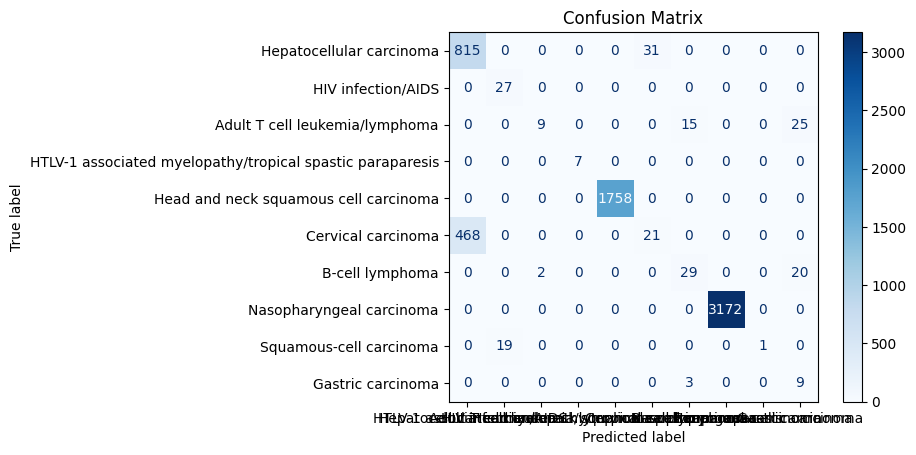

<Figure size 1400x800 with 0 Axes>

In [354]:
rfe_cm_nb = confusion_matrix(y_test, rfe_nb.predict(rfe_test))
disp = ConfusionMatrixDisplay(confusion_matrix=rfe_cm_nb, display_labels=y.value_counts().index)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.figure(figsize=(14, 8))
plt.show()

### Mulinomial NB

In [355]:
rfe_mnb = MultinomialNB()
rfe_mnb.fit(rfe_train, y_train)

MultinomialNB()

In [356]:
print(accuracy_score(y_train, rfe_mnb.predict(rfe_train)))

0.7666796267496112


In [357]:
print(accuracy_score(y_test, rfe_mnb.predict(rfe_test)))

0.7667547815269787


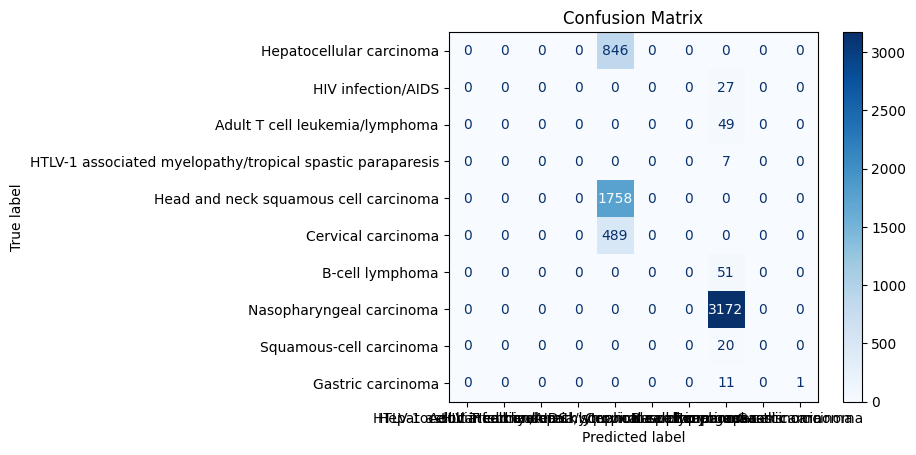

<Figure size 1400x800 with 0 Axes>

In [358]:
rfe_cm_mnb = confusion_matrix(y_test, rfe_mnb.predict(rfe_test))
disp = ConfusionMatrixDisplay(confusion_matrix=rfe_cm_mnb, display_labels=y.value_counts().index)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.figure(figsize=(14, 8))
plt.show()

### XGBoost Classifier

In [359]:
rfe_xg = XGBClassifier()
rfe_xg.fit(rfe_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [360]:
print(accuracy_score(y_train, rfe_xg.predict(rfe_train)))

0.9833203732503888


In [361]:
print(accuracy_score(y_test, rfe_xg.predict(rfe_test)))

0.9164982117866584


In [362]:
print(classification_report(y_test, rfe_xg.predict(rfe_test)))

              precision    recall  f1-score   support

           0       0.67      0.79      0.73       846
           1       0.52      0.52      0.52        27
           2       0.90      0.96      0.93        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.48      0.34      0.39       489
           6       0.94      0.92      0.93        51
           7       1.00      1.00      1.00      3172
           8       0.35      0.35      0.35        20
           9       1.00      0.83      0.91        12

    accuracy                           0.92      6431
   macro avg       0.79      0.77      0.78      6431
weighted avg       0.91      0.92      0.91      6431



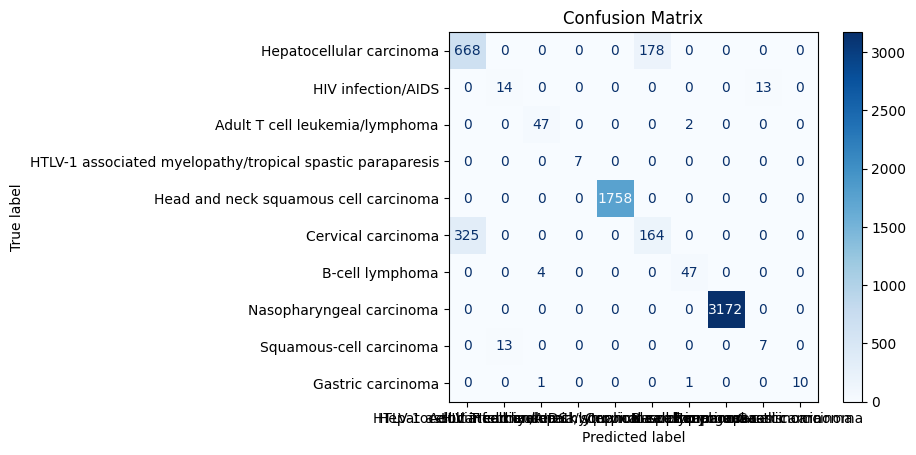

<Figure size 1400x800 with 0 Axes>

In [363]:
rfe_cm_xg = confusion_matrix(y_test, rfe_xg.predict(rfe_test))
disp = ConfusionMatrixDisplay(confusion_matrix=rfe_cm_xg, display_labels=y.value_counts().index)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.figure(figsize=(14, 8))
plt.show()

### Hyperparameter Tuning

#### RandomisedSearchCV

In [364]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 4000, num = 40)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt','log2']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 1000,10)]
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10,14]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4,6,8]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
              'criterion':['entropy','gini']}
print(random_grid)


{'n_estimators': [200, 297, 394, 492, 589, 687, 784, 882, 979, 1076, 1174, 1271, 1369, 1466, 1564, 1661, 1758, 1856, 1953, 2051, 2148, 2246, 2343, 2441, 2538, 2635, 2733, 2830, 2928, 3025, 3123, 3220, 3317, 3415, 3512, 3610, 3707, 3805, 3902, 4000], 'max_features': ['auto', 'sqrt', 'log2'], 'max_depth': [10, 120, 230, 340, 450, 560, 670, 780, 890, 1000], 'min_samples_split': [2, 5, 10, 14], 'min_samples_leaf': [1, 2, 4, 6, 8], 'criterion': ['entropy', 'gini']}


In [365]:
rf=RandomForestClassifier()
rf_randomcv=RandomizedSearchCV(estimator=rf,param_distributions=random_grid,n_iter=100,cv=3,verbose=2,
                               random_state=100,n_jobs=-1)
### fit the randomized model
rf_randomcv.fit(rfe_train,y_train)


Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'criterion': ['entropy', 'gini'],
                                        'max_depth': [10, 120, 230, 340, 450,
                                                      560, 670, 780, 890,
                                                      1000],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4, 6, 8],
                                        'min_samples_split': [2, 5, 10, 14],
                                        'n_estimators': [200, 297, 394, 492,
                                                         589, 687, 784, 882,
                                                         979, 1076, 1174, 1271,
                                                         1369, 1466, 1564, 1661,
                                                         1758, 1856, 1953, 2051,
                                                         2148, 2246, 2343, 2441,
                                                         2538, 2635, 2733, 2830,
                                                         2928, 3025, ...]},
                   random_state=100, verbose=2)

In [366]:
best_random_grid=rf_randomcv.best_estimator_


In [367]:
from sklearn.metrics import accuracy_score
best_random_grid.fit(rfe_train, y_train)
y_pred=best_random_grid.predict(rfe_test)
print(confusion_matrix(y_test,y_pred))
print("Accuracy Score {}".format(accuracy_score(y_test,y_pred)))
print("Classification report: {}".format(classification_report(y_test,y_pred)))



[[ 773    0    0    0    0   73    0    0    0    0]
 [   0   18    0    0    0    0    0    0    9    0]
 [   0    0   42    0    0    0    7    0    0    0]
 [   0    0    0    7    0    0    0    0    0    0]
 [   0    0    0    0 1758    0    0    0    0    0]
 [ 400    0    0    0    0   89    0    0    0    0]
 [   0    0    3    0    0    0   48    0    0    0]
 [   0    0    0    0    0    0    0 3172    0    0]
 [   0   14    0    0    0    0    0    0    6    0]
 [   0    0    5    0    0    0    2    0    0    5]]
Accuracy Score 0.9202301352822267
Classification report:               precision    recall  f1-score   support

           0       0.66      0.91      0.77       846
           1       0.56      0.67      0.61        27
           2       0.84      0.86      0.85        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.55      0.18      0.27       489
           6       0.84      0.94

#### GridSearchCV

In [368]:
param_grid = {
    'criterion': [rf_randomcv.best_params_['criterion']],
    'max_depth': [rf_randomcv.best_params_['max_depth']],
    'max_features': [rf_randomcv.best_params_['max_features']],
    'min_samples_leaf': [rf_randomcv.best_params_['min_samples_leaf'], 
                         rf_randomcv.best_params_['min_samples_leaf']+2, 
                         rf_randomcv.best_params_['min_samples_leaf'] + 4],
    'min_samples_split': [rf_randomcv.best_params_['min_samples_split'] - 2,
                          rf_randomcv.best_params_['min_samples_split'] - 1,
                          rf_randomcv.best_params_['min_samples_split'], 
                          rf_randomcv.best_params_['min_samples_split'] +1,
                          rf_randomcv.best_params_['min_samples_split'] + 2],
    'n_estimators': [rf_randomcv.best_params_['n_estimators'] - 200, rf_randomcv.best_params_['n_estimators'] - 100, 
                     rf_randomcv.best_params_['n_estimators'], 
                     rf_randomcv.best_params_['n_estimators'] + 100, rf_randomcv.best_params_['n_estimators'] + 200]
}

print(param_grid)

{'criterion': ['entropy'], 'max_depth': [780], 'max_features': ['log2'], 'min_samples_leaf': [4, 6, 8], 'min_samples_split': [8, 9, 10, 11, 12], 'n_estimators': [1753, 1853, 1953, 2053, 2153]}


In [369]:
#### Fit the grid_search to the data
rf=RandomForestClassifier()
grid_search=GridSearchCV(estimator=rf,param_grid=param_grid,cv=10,n_jobs=-1,verbose=2)
grid_search.fit(rfe_train,y_train)



Fitting 10 folds for each of 75 candidates, totalling 750 fits


GridSearchCV(cv=10, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'criterion': ['entropy'], 'max_depth': [780],
                         'max_features': ['log2'],
                         'min_samples_leaf': [4, 6, 8],
                         'min_samples_split': [8, 9, 10, 11, 12],
                         'n_estimators': [1753, 1853, 1953, 2053, 2153]},
             verbose=2)

In [370]:
best_grid=grid_search.best_estimator_


In [371]:
best_grid.fit(rfe_train, y_train)
y_pred=best_grid.predict(rfe_test)
print(confusion_matrix(y_test,y_pred))
print("Accuracy Score {}".format(accuracy_score(y_test,y_pred)))
print("Classification report: {}".format(classification_report(y_test,y_pred)))


[[ 767    0    0    0    0   79    0    0    0    0]
 [   0   18    0    0    0    0    0    0    9    0]
 [   0    0   44    0    0    0    5    0    0    0]
 [   0    0    0    7    0    0    0    0    0    0]
 [   0    0    0    0 1758    0    0    0    0    0]
 [ 400    0    0    0    0   89    0    0    0    0]
 [   0    0    3    0    0    0   48    0    0    0]
 [   0    0    0    0    0    0    0 3172    0    0]
 [   0   15    0    0    0    0    0    0    5    0]
 [   0    0    5    0    0    0    2    0    0    5]]
Accuracy Score 0.91945265122065
Classification report:               precision    recall  f1-score   support

           0       0.66      0.91      0.76       846
           1       0.55      0.67      0.60        27
           2       0.85      0.90      0.87        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.53      0.18      0.27       489
           6       0.87      0.94  

### KNN

In [372]:
rfe_knn = KNeighborsClassifier(n_neighbors=7)
rfe_knn.fit(rfe_train, y_train)

KNeighborsClassifier(n_neighbors=7)

In [373]:
print(accuracy_score(y_train, rfe_knn.predict(rfe_train)))

0.9306765163297045


In [374]:
print(accuracy_score(y_test, rfe_knn.predict(rfe_test)))

0.9074793966723682


In [375]:
print(classification_report(y_test, rfe_knn.predict(rfe_test)))

              precision    recall  f1-score   support

           0       0.65      0.79      0.71       846
           1       0.55      0.63      0.59        27
           2       0.82      0.84      0.83        49
           3       0.00      0.00      0.00         7
           4       1.00      1.00      1.00      1758
           5       0.42      0.26      0.32       489
           6       0.76      0.80      0.78        51
           7       1.00      1.00      1.00      3172
           8       0.33      0.25      0.29        20
           9       1.00      0.25      0.40        12

    accuracy                           0.91      6431
   macro avg       0.65      0.58      0.59      6431
weighted avg       0.90      0.91      0.90      6431



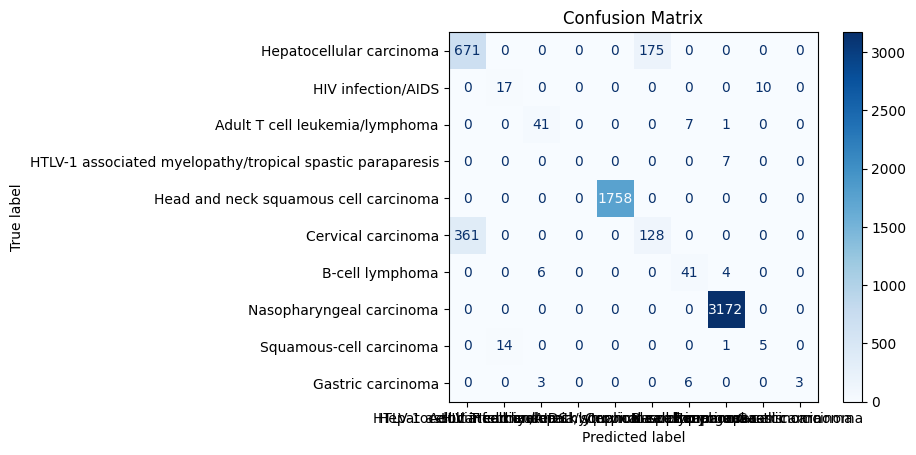

<Figure size 1400x800 with 0 Axes>

In [376]:
rfe_cm_knn = confusion_matrix(y_test, rfe_knn.predict(rfe_test))
disp = ConfusionMatrixDisplay(confusion_matrix=rfe_cm_knn, display_labels=y.value_counts().index)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.figure(figsize=(14, 8))
plt.show()

### Voting Classifier

### Hard

In [377]:
rfe_vc_hard = VotingClassifier(estimators=estimator, voting='hard')
rfe_vc_hard.fit(rfe_train, y_train)

VotingClassifier(estimators=[('RandomForest',
                              RandomForestClassifier(random_state=42)),
                             ('XGB',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None, device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None, gamma=None,
                                            grow_policy=None,
                                            impo...
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            multi_strategy=None,
                                            n_estimators=None, n_jobs=None,
                                            num_parallel_tree=None,
                                            random_state=None, ...)),
                             ('DecisionTree',
                              DecisionTreeClassifier(random_state=42)),
                             ('KNN', KNeighborsClassifier(n_neighbors=4)),
                             ('Gradient Boosting',
                              GradientBoostingClassifier(random_state=42)),
                             ('Ada Boost',
                              AdaBoostClassifier(random_state=42))])

In [378]:
print(accuracy_score(y_train, rfe_vc_hard.predict(rfe_train)))

0.9529937791601866


In [379]:
print(accuracy_score(y_test, rfe_vc_hard.predict(rfe_test)))

0.9186751671590733


In [380]:
print(classification_report(y_test, rfe_vc_hard.predict(rfe_test)))

              precision    recall  f1-score   support

           0       0.64      0.95      0.77       846
           1       0.59      0.74      0.66        27
           2       0.84      0.94      0.88        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.51      0.08      0.14       489
           6       0.90      0.90      0.90        51
           7       1.00      1.00      1.00      3172
           8       0.46      0.30      0.36        20
           9       1.00      0.50      0.67        12

    accuracy                           0.92      6431
   macro avg       0.79      0.74      0.74      6431
weighted avg       0.91      0.92      0.90      6431



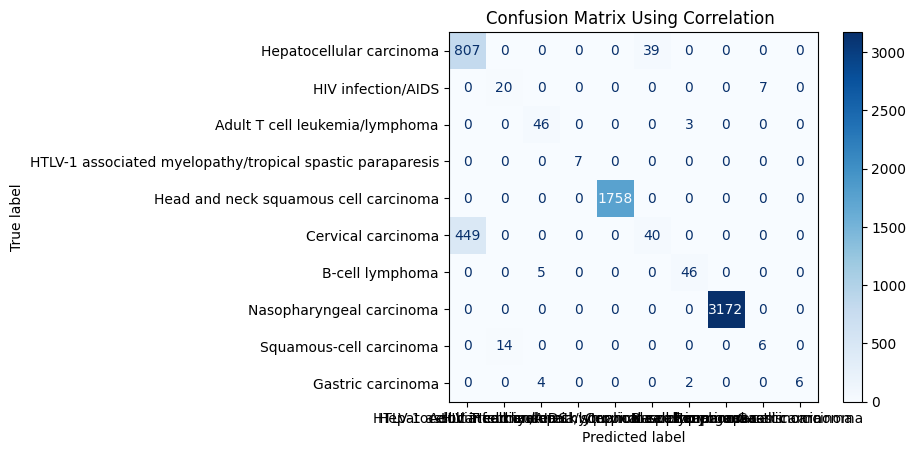

<Figure size 1400x800 with 0 Axes>

In [381]:
rfe_cm_vc_hard = confusion_matrix(y_test, rfe_vc_hard.predict(rfe_test))
disp = ConfusionMatrixDisplay(confusion_matrix=rfe_cm_vc_hard, display_labels=y.value_counts().index)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix Using Correlation ')
plt.figure(figsize=(14, 8))
plt.show()

### Hyperparameter Tuning

#### RandomisedSearchCv

In [382]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 4000, num = 40)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt','log2']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 1000,10)]
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10,14]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4,6,8]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
              'criterion':['entropy','gini']}
print(random_grid)

{'n_estimators': [200, 297, 394, 492, 589, 687, 784, 882, 979, 1076, 1174, 1271, 1369, 1466, 1564, 1661, 1758, 1856, 1953, 2051, 2148, 2246, 2343, 2441, 2538, 2635, 2733, 2830, 2928, 3025, 3123, 3220, 3317, 3415, 3512, 3610, 3707, 3805, 3902, 4000], 'max_features': ['auto', 'sqrt', 'log2'], 'max_depth': [10, 120, 230, 340, 450, 560, 670, 780, 890, 1000], 'min_samples_split': [2, 5, 10, 14], 'min_samples_leaf': [1, 2, 4, 6, 8], 'criterion': ['entropy', 'gini']}


In [383]:
rf=RandomForestClassifier()
rf_randomcv=RandomizedSearchCV(estimator=rf,param_distributions=random_grid,n_iter=100,cv=3,verbose=2,
                               random_state=100,n_jobs=-1)
### fit the randomized model
rf_randomcv.fit(rfe_train,y_train)



Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'criterion': ['entropy', 'gini'],
                                        'max_depth': [10, 120, 230, 340, 450,
                                                      560, 670, 780, 890,
                                                      1000],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4, 6, 8],
                                        'min_samples_split': [2, 5, 10, 14],
                                        'n_estimators': [200, 297, 394, 492,
                                                         589, 687, 784, 882,
                                                         979, 1076, 1174, 1271,
                                                         1369, 1466, 1564, 1661,
                                                         1758, 1856, 1953, 2051,
                                                         2148, 2246, 2343, 2441,
                                                         2538, 2635, 2733, 2830,
                                                         2928, 3025, ...]},
                   random_state=100, verbose=2)

In [384]:
best_random_grid=rf_randomcv.best_estimator_

In [385]:
from sklearn.metrics import accuracy_score
best_random_grid.fit(rfe_train, y_train)
y_pred=best_random_grid.predict(rfe_test)
print(confusion_matrix(y_test,y_pred))
print("Accuracy Score {}".format(accuracy_score(y_test,y_pred)))
print("Classification report: {}".format(classification_report(y_test,y_pred)))

[[ 771    0    0    0    0   75    0    0    0    0]
 [   0   18    0    0    0    0    0    0    9    0]
 [   0    0   42    0    0    0    7    0    0    0]
 [   0    0    0    7    0    0    0    0    0    0]
 [   0    0    0    0 1758    0    0    0    0    0]
 [ 399    0    0    0    0   90    0    0    0    0]
 [   0    0    4    0    0    0   47    0    0    0]
 [   0    0    0    0    0    0    0 3172    0    0]
 [   0   13    0    0    0    0    0    0    7    0]
 [   0    0    6    0    0    0    1    0    0    5]]
Accuracy Score 0.9200746384699113
Classification report:               precision    recall  f1-score   support

           0       0.66      0.91      0.76       846
           1       0.58      0.67      0.62        27
           2       0.81      0.86      0.83        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.55      0.18      0.28       489
           6       0.85      0.92

#### GridSearchCV

In [386]:
param_grid = {
    'criterion': [rf_randomcv.best_params_['criterion']],
    'max_depth': [rf_randomcv.best_params_['max_depth']],
    'max_features': [rf_randomcv.best_params_['max_features']],
    'min_samples_leaf': [rf_randomcv.best_params_['min_samples_leaf'], 
                         rf_randomcv.best_params_['min_samples_leaf']+2, 
                         rf_randomcv.best_params_['min_samples_leaf'] + 4],
    'min_samples_split': [rf_randomcv.best_params_['min_samples_split'] - 2,
                          rf_randomcv.best_params_['min_samples_split'] - 1,
                          rf_randomcv.best_params_['min_samples_split'], 
                          rf_randomcv.best_params_['min_samples_split'] +1,
                          rf_randomcv.best_params_['min_samples_split'] + 2],
    'n_estimators': [rf_randomcv.best_params_['n_estimators'] - 200, rf_randomcv.best_params_['n_estimators'] - 100, 
                     rf_randomcv.best_params_['n_estimators'], 
                     rf_randomcv.best_params_['n_estimators'] + 100, rf_randomcv.best_params_['n_estimators'] + 200]
}

print(param_grid)

{'criterion': ['entropy'], 'max_depth': [670], 'max_features': ['log2'], 'min_samples_leaf': [2, 4, 6], 'min_samples_split': [12, 13, 14, 15, 16], 'n_estimators': [2338, 2438, 2538, 2638, 2738]}


In [387]:
#### Fit the grid_search to the data
rf=RandomForestClassifier()
grid_search=GridSearchCV(estimator=rf,param_grid=param_grid,cv=10,n_jobs=-1,verbose=2)
grid_search.fit(rfe_train,y_train)

Fitting 10 folds for each of 75 candidates, totalling 750 fits


GridSearchCV(cv=10, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'criterion': ['entropy'], 'max_depth': [670],
                         'max_features': ['log2'],
                         'min_samples_leaf': [2, 4, 6],
                         'min_samples_split': [12, 13, 14, 15, 16],
                         'n_estimators': [2338, 2438, 2538, 2638, 2738]},
             verbose=2)

In [388]:
best_grid=grid_search.best_estimator_

In [389]:
best_grid.fit(rfe_train, y_train)
y_pred=best_grid.predict(rfe_test)
print(confusion_matrix(y_test,y_pred))
print("Accuracy Score {}".format(accuracy_score(y_test,y_pred)))
print("Classification report: {}".format(classification_report(y_test,y_pred)))

[[ 776    0    0    0    0   70    0    0    0    0]
 [   0   18    0    0    0    0    0    0    9    0]
 [   0    0   40    0    0    0    9    0    0    0]
 [   0    0    0    7    0    0    0    0    0    0]
 [   0    0    0    0 1758    0    0    0    0    0]
 [ 406    0    0    0    0   83    0    0    0    0]
 [   0    0    3    0    0    0   48    0    0    0]
 [   0    0    0    0    0    0    0 3172    0    0]
 [   0   15    0    0    0    0    0    0    5    0]
 [   0    0    6    0    0    0    2    0    0    4]]
Accuracy Score 0.9191416575960193
Classification report:               precision    recall  f1-score   support

           0       0.66      0.92      0.77       846
           1       0.55      0.67      0.60        27
           2       0.82      0.82      0.82        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.54      0.17      0.26       489
           6       0.81      0.94

### Soft

In [390]:
rfe_vc_soft = VotingClassifier(estimators=estimator, voting='soft')
rfe_vc_soft.fit(rfe_train, y_train)

VotingClassifier(estimators=[('RandomForest',
                              RandomForestClassifier(random_state=42)),
                             ('XGB',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None, device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None, gamma=None,
                                            grow_policy=None,
                                            impo...
                                            monotone_constraints=None,
                                            multi_strategy=None,
                                            n_estimators=None, n_jobs=None,
                                            num_parallel_tree=None,
                                            random_state=None, ...)),
                             ('DecisionTree',
                              DecisionTreeClassifier(random_state=42)),
                             ('KNN', KNeighborsClassifier(n_neighbors=4)),
                             ('Gradient Boosting',
                              GradientBoostingClassifier(random_state=42)),
                             ('Ada Boost',
                              AdaBoostClassifier(random_state=42))],
                 voting='soft')

In [391]:
print(accuracy_score(y_train, rfe_vc_soft.predict(rfe_train)))

0.9992223950233281


In [392]:
print(accuracy_score(y_test, rfe_vc_soft.predict(rfe_test)))

0.9147877468511896


In [393]:
print(classification_report(y_test, rfe_vc_soft.predict(rfe_test)))

              precision    recall  f1-score   support

           0       0.67      0.79      0.72       846
           1       0.58      0.56      0.57        27
           2       0.88      0.92      0.90        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.46      0.31      0.38       489
           6       0.88      0.90      0.89        51
           7       1.00      1.00      1.00      3172
           8       0.43      0.45      0.44        20
           9       1.00      0.75      0.86        12

    accuracy                           0.91      6431
   macro avg       0.79      0.77      0.78      6431
weighted avg       0.91      0.91      0.91      6431



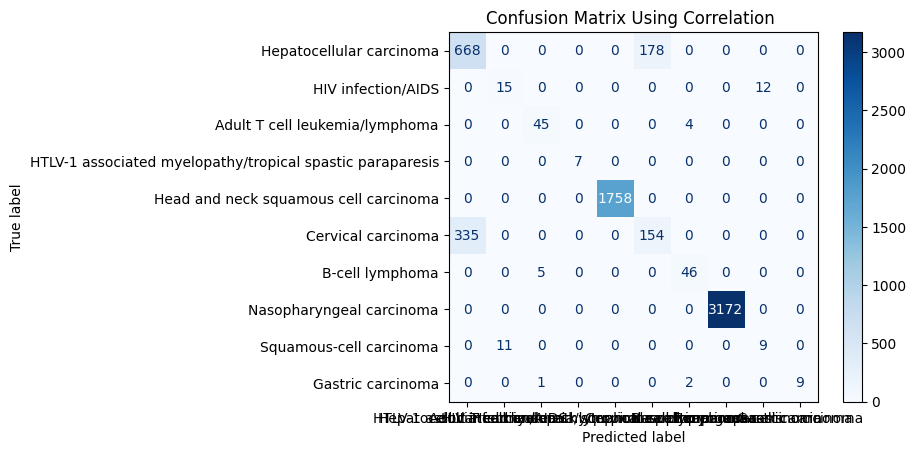

<Figure size 1400x800 with 0 Axes>

In [394]:
rfe_cm_vc_soft = confusion_matrix(y_test, rfe_vc_soft.predict(rfe_test))
disp = ConfusionMatrixDisplay(confusion_matrix=rfe_cm_vc_soft, display_labels=y.value_counts().index)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix Using Correlation ')
plt.figure(figsize=(14, 8))
plt.show()

### Hyperparameter Tuning

#### RandomisedSearchCv

In [395]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 4000, num = 40)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt','log2']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 1000,10)]
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10,14]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4,6,8]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
              'criterion':['entropy','gini']}
print(random_grid)

{'n_estimators': [200, 297, 394, 492, 589, 687, 784, 882, 979, 1076, 1174, 1271, 1369, 1466, 1564, 1661, 1758, 1856, 1953, 2051, 2148, 2246, 2343, 2441, 2538, 2635, 2733, 2830, 2928, 3025, 3123, 3220, 3317, 3415, 3512, 3610, 3707, 3805, 3902, 4000], 'max_features': ['auto', 'sqrt', 'log2'], 'max_depth': [10, 120, 230, 340, 450, 560, 670, 780, 890, 1000], 'min_samples_split': [2, 5, 10, 14], 'min_samples_leaf': [1, 2, 4, 6, 8], 'criterion': ['entropy', 'gini']}


In [396]:
rf=RandomForestClassifier()
rf_randomcv=RandomizedSearchCV(estimator=rf,param_distributions=random_grid,n_iter=100,cv=3,verbose=2,
                               random_state=100,n_jobs=-1)
### fit the randomized model
rf_randomcv.fit(rfe_train,y_train)


Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'criterion': ['entropy', 'gini'],
                                        'max_depth': [10, 120, 230, 340, 450,
                                                      560, 670, 780, 890,
                                                      1000],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4, 6, 8],
                                        'min_samples_split': [2, 5, 10, 14],
                                        'n_estimators': [200, 297, 394, 492,
                                                         589, 687, 784, 882,
                                                         979, 1076, 1174, 1271,
                                                         1369, 1466, 1564, 1661,
                                                         1758, 1856, 1953, 2051,
                                                         2148, 2246, 2343, 2441,
                                                         2538, 2635, 2733, 2830,
                                                         2928, 3025, ...]},
                   random_state=100, verbose=2)

In [397]:
best_random_grid=rf_randomcv.best_estimator_


In [398]:
from sklearn.metrics import accuracy_score
best_random_grid.fit(rfe_train, y_train)
y_pred=best_random_grid.predict(rfe_test)
print(confusion_matrix(y_test,y_pred))
print("Accuracy Score {}".format(accuracy_score(y_test,y_pred)))
print("Classification report: {}".format(classification_report(y_test,y_pred)))

[[ 840    0    0    0    0    6    0    0    0    0]
 [   0   23    0    0    0    0    0    0    4    0]
 [   0    0   43    0    0    0    6    0    0    0]
 [   0    0    0    7    0    0    0    0    0    0]
 [   0    0    0    0 1758    0    0    0    0    0]
 [ 481    0    0    0    0    8    0    0    0    0]
 [   0    0    3    0    0    0   48    0    0    0]
 [   0    0    0    0    0    0    0 3172    0    0]
 [   0   14    0    0    0    0    0    0    6    0]
 [   0    0    6    0    0    0    1    0    0    5]]
Accuracy Score 0.918986160783704
Classification report:               precision    recall  f1-score   support

           0       0.64      0.99      0.78       846
           1       0.62      0.85      0.72        27
           2       0.83      0.88      0.85        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.57      0.02      0.03       489
           6       0.87      0.94 

#### GridSearchCV

In [399]:
param_grid = {
    'criterion': [rf_randomcv.best_params_['criterion']],
    'max_depth': [rf_randomcv.best_params_['max_depth']],
    'max_features': [rf_randomcv.best_params_['max_features']],
    'min_samples_leaf': [rf_randomcv.best_params_['min_samples_leaf'], 
                         rf_randomcv.best_params_['min_samples_leaf']+2, 
                         rf_randomcv.best_params_['min_samples_leaf'] + 4],
    'min_samples_split': [rf_randomcv.best_params_['min_samples_split'] - 2,
                          rf_randomcv.best_params_['min_samples_split'] - 1,
                          rf_randomcv.best_params_['min_samples_split'], 
                          rf_randomcv.best_params_['min_samples_split'] +1,
                          rf_randomcv.best_params_['min_samples_split'] + 2],
    'n_estimators': [rf_randomcv.best_params_['n_estimators'] - 200, rf_randomcv.best_params_['n_estimators'] - 100, 
                     rf_randomcv.best_params_['n_estimators'], 
                     rf_randomcv.best_params_['n_estimators'] + 100, rf_randomcv.best_params_['n_estimators'] + 200]
}

print(param_grid)


{'criterion': ['entropy'], 'max_depth': [10], 'max_features': ['sqrt'], 'min_samples_leaf': [1, 3, 5], 'min_samples_split': [0, 1, 2, 3, 4], 'n_estimators': [584, 684, 784, 884, 984]}


In [400]:
#### Fit the grid_search to the data
rf=RandomForestClassifier()
grid_search=GridSearchCV(estimator=rf,param_grid=param_grid,cv=10,n_jobs=-1,verbose=2)
grid_search.fit(rfe_train,y_train)

Fitting 10 folds for each of 75 candidates, totalling 750 fits


GridSearchCV(cv=10, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'criterion': ['entropy'], 'max_depth': [10],
                         'max_features': ['sqrt'],
                         'min_samples_leaf': [1, 3, 5],
                         'min_samples_split': [0, 1, 2, 3, 4],
                         'n_estimators': [584, 684, 784, 884, 984]},
             verbose=2)

In [401]:
best_grid=grid_search.best_estimator_

In [402]:
best_grid.fit(rfe_train, y_train)
y_pred=best_grid.predict(rfe_test)
print(confusion_matrix(y_test,y_pred))
print("Accuracy Score {}".format(accuracy_score(y_test,y_pred)))
print("Classification report: {}".format(classification_report(y_test,y_pred)))

[[ 839    0    0    0    0    7    0    0    0    0]
 [   0   21    0    0    0    0    0    0    6    0]
 [   0    0   43    0    0    0    6    0    0    0]
 [   0    0    0    7    0    0    0    0    0    0]
 [   0    0    0    0 1758    0    0    0    0    0]
 [ 481    0    0    0    0    8    0    0    0    0]
 [   0    0    3    0    0    0   48    0    0    0]
 [   0    0    0    0    0    0    0 3172    0    0]
 [   0   15    0    0    0    0    0    0    5    0]
 [   0    0    6    0    0    0    1    0    0    5]]
Accuracy Score 0.9183641735344426
Classification report:               precision    recall  f1-score   support

           0       0.64      0.99      0.77       846
           1       0.58      0.78      0.67        27
           2       0.83      0.88      0.85        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.53      0.02      0.03       489
           6       0.87      0.94

# Models We Can Use

In [403]:
rfe_dt

DecisionTreeClassifier(random_state=42)

In [404]:
i_xg

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [405]:
rfe_rf

RandomForestClassifier(random_state=42)

In [406]:
c_dt

DecisionTreeClassifier(random_state=42)

In [407]:
i_dt

DecisionTreeClassifier(random_state=42)

In [408]:
i_rf

RandomForestClassifier(random_state=42)

# Testing with OOB_SCORE

In [409]:
test_rf_t = RandomForestClassifier(oob_score=True, random_state=42).fit(rfe_train, y_train)
test_rf_f = RandomForestClassifier(oob_score=False, random_state=42).fit(rfe_train, y_train)

## When True

In [410]:
print(accuracy_score(y_train, test_rf_t.predict(rfe_train)))

0.9999611197511664


In [411]:
print(accuracy_score(y_test, test_rf_t.predict(rfe_test)))

0.9185196703467579


In [412]:
print(classification_report(y_test, test_rf_t.predict(rfe_test)))

              precision    recall  f1-score   support

           0       0.67      0.85      0.75       846
           1       0.58      0.67      0.62        27
           2       0.82      0.94      0.88        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.50      0.27      0.35       489
           6       0.90      0.88      0.89        51
           7       1.00      1.00      1.00      3172
           8       0.44      0.35      0.39        20
           9       1.00      0.50      0.67        12

    accuracy                           0.92      6431
   macro avg       0.79      0.75      0.75      6431
weighted avg       0.91      0.92      0.91      6431



## When False

In [413]:
print(accuracy_score(y_train, test_rf_f.predict(rfe_train)))

0.9999611197511664


In [414]:
print(accuracy_score(y_test, test_rf_f.predict(rfe_test)))

0.9185196703467579


In [415]:
print(classification_report(y_test, test_rf_f.predict(rfe_test)))

              precision    recall  f1-score   support

           0       0.67      0.85      0.75       846
           1       0.58      0.67      0.62        27
           2       0.82      0.94      0.88        49
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00      1758
           5       0.50      0.27      0.35       489
           6       0.90      0.88      0.89        51
           7       1.00      1.00      1.00      3172
           8       0.44      0.35      0.39        20
           9       1.00      0.50      0.67        12

    accuracy                           0.92      6431
   macro avg       0.79      0.75      0.75      6431
weighted avg       0.91      0.92      0.91      6431



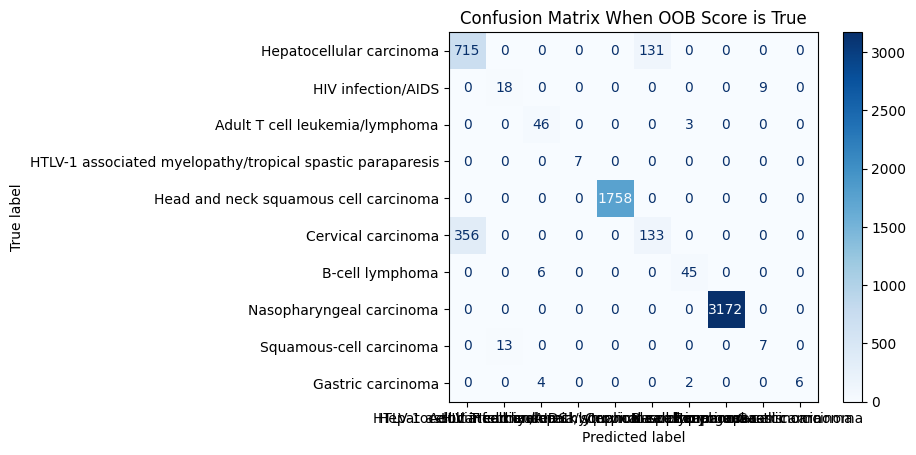

<Figure size 1400x800 with 0 Axes>

In [416]:
test_cm_rf = confusion_matrix(y_test, test_rf_t.predict(rfe_test))
test_disp = ConfusionMatrixDisplay(confusion_matrix=test_cm_rf, display_labels=y.value_counts().index)
test_disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix When OOB Score is True')
plt.figure(figsize=(14, 8))
plt.show()

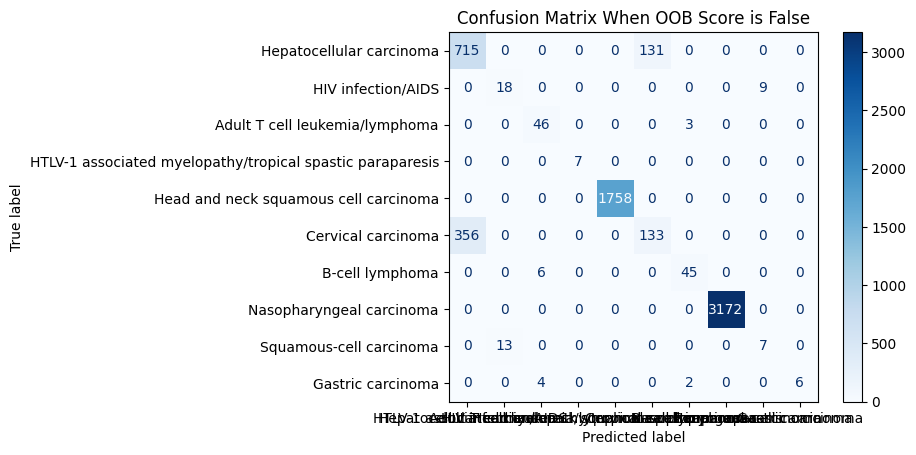

<Figure size 1400x800 with 0 Axes>

In [417]:
test_cm_rf_f = confusion_matrix(y_test, test_rf_f.predict(rfe_test))
test_disp = ConfusionMatrixDisplay(confusion_matrix=test_cm_rf_f, display_labels=y.value_counts().index)
test_disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix When OOB Score is False')
plt.figure(figsize=(14, 8))
plt.show()

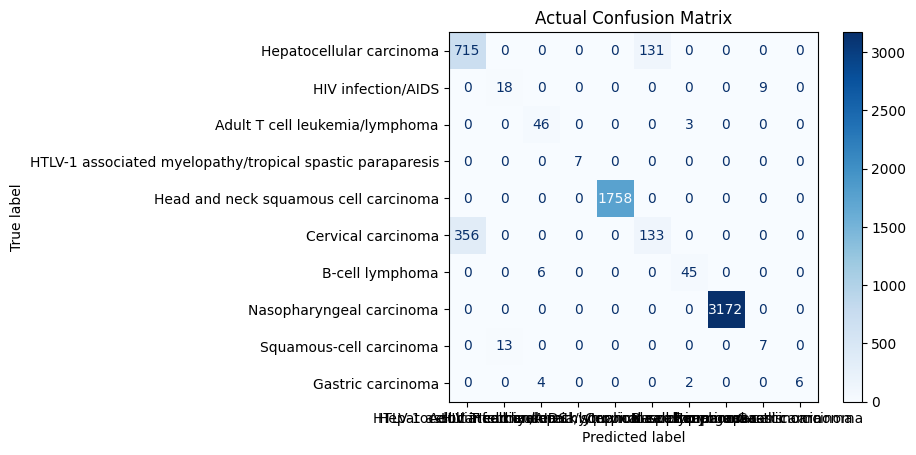

<Figure size 1400x800 with 0 Axes>

In [418]:
rfe_cm_rf = confusion_matrix(y_test, rfe_rf.predict(rfe_test))
disp = ConfusionMatrixDisplay(confusion_matrix=rfe_cm_rf, display_labels=y.value_counts().index)
disp.plot(cmap=plt.cm.Blues)
plt.title('Actual Confusion Matrix')
plt.figure(figsize=(14, 8))
plt.show()

## Lime

In [1]:
!pip install lime

## RFECV with Random Forest

In [79]:
import lime
import lime.lime_tabular

In [80]:
import matplotlib.pyplot as plt


In [84]:
explainer = lime.lime_tabular.LimeTabularExplainer(training_data = rfe_train.values,
    mode='classification',
    feature_names=rfe_train.columns)

In [103]:
import os
output_folder = 'explanations'
os.makedirs(output_folder, exist_ok=True)

predicted_class = rfe_rf.predict([rfe_test.iloc[20]])[0]
predicted_proba = rfe_rf.predict_proba([rfe_test.iloc[20]])[0]

exp = explainer.explain_instance(rfe_test.iloc[20], rfe_rf.predict_proba)
exp.show_in_notebook(show_table = True)
fig = exp.as_pyplot_figure()
ax = fig.axes[0]  # Get the main axes of the plot
ax.set_title(f"Predicted Class - {categories[int(predicted_class)]}", fontsize=14, color='blue')

# Save the plot as an image
file_path = os.path.join(output_folder, 'explanation_7.png')
fig.savefig(file_path, bbox_inches='tight')

In [104]:
exp = explainer.explain_instance(rfe_test.iloc[9], rfe_rf.predict_proba)
exp.show_in_notebook(show_table = True)
predicted_class = rfe_rf.predict([rfe_test.iloc[9]])[0]
predicted_proba = rfe_rf.predict_proba([rfe_test.iloc[9]])[0]
fig = exp.as_pyplot_figure()
# Save the plot as an image
ax = fig.axes[0]  # Get the main axes of the plot
ax.set_title(f"Predicted Class - {categories[int(predicted_class)]}", fontsize=14, color='blue')

file_path = os.path.join(output_folder, 'explanation_4.png')
fig.savefig(file_path, bbox_inches='tight')

In [105]:
a = 85
exp = explainer.explain_instance(rfe_test.iloc[a], rfe_rf.predict_proba)
exp.show_in_notebook(show_table = True)
predicted_class = rfe_rf.predict([rfe_test.iloc[a]])[0]
predicted_proba = rfe_rf.predict_proba([rfe_test.iloc[a]])[0]
fig = exp.as_pyplot_figure()
# Save the plot as an image
ax = fig.axes[0]  # Get the main axes of the plot
ax.set_title(f"Predicted Class - {categories[int(predicted_class)]}", fontsize=14, color='blue')

file_path = os.path.join(output_folder, 'explanation_2.png')
fig.savefig(file_path, bbox_inches='tight')

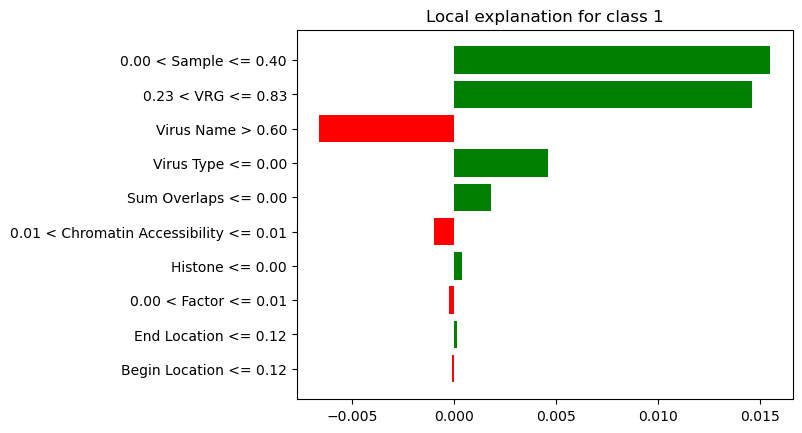

In [106]:
exp.as_pyplot_figure()

# Bar Plot For Model Performance

In [324]:
feature_selection_methods = ["Information Gain", "Recursive Feature Elimination", "Variance Threshold", "Pearson Correlation Coefficient"]

models = [
    "Logistic Regression",
    "Decision Tree",
    "Random Forest",
    "Naive Bayes",
    "XGBoost Classifier",
    "KNN",
    "Support Vector Machine",
    "Voting Classifier (Hard)",
    "Voting Classifier (Soft)",
    "ZeroR Classifier"
]

metrics = ["Accuracy", "Precision", "Recall", "F1 score"]

performance_data = {
    "Logistic Regression": {
        "Information Gain": [91, 85, 91, 87],
        "Recursive Feature Elimination": [91, 85, 91, 87],
        "Variance Threshold": [77, 62, 77, 68],
        "Pearson Correlation Coefficient": [91, 85, 91, 87],
    },
    "Decision Tree": {
        "Information Gain": [91, 91, 91, 91],
        "Recursive Feature Elimination": [91, 91, 91, 91],
        "Variance Threshold": [78, 66, 78, 70],
        "Pearson Correlation Coefficient": [91, 91, 91, 91],
    },
    "Random Forest": {
        "Information Gain": [91, 91, 91, 91],
        "Recursive Feature Elimination": [92, 91, 92, 91],
        "Variance Threshold": [78, 66, 78, 70],
        "Pearson Correlation Coefficient": [92, 91, 92, 91],
    },
    "Naive Bayes": {
        "Information Gain": [91, 90, 91, 88],
        "Recursive Feature Elimination": [91, 90, 91, 89],
        "Variance Threshold": [64, 79, 64, 57],
        "Pearson Correlation Coefficient": [91, 89, 91, 88],
    },
    "XGBoost Classifier": {
        "Information Gain": [91, 91, 91, 91],
        "Recursive Feature Elimination": [92, 91, 92, 91],
        "Variance Threshold": [78, 66, 78, 70],
        "Pearson Correlation Coefficient": [91, 90, 91, 91],
    },
    "KNN": {
        "Information Gain": [91, 90, 91, 90],
        "Recursive Feature Elimination": [91, 90, 91, 90],
        "Variance Threshold": [65, 82, 65, 58],
        "Pearson Correlation Coefficient": [91, 90, 91, 90],
    },
    "Support Vector Machine": {
        "Information Gain": [92, 87, 92, 88],
        "Recursive Feature Elimination": [91, 87, 91, 88],
        "Variance Threshold": [77, 62, 77, 68],
        "Pearson Correlation Coefficient": [91, 86, 91, 88],
    },
    "Voting Classifier (Hard)": {
        "Information Gain": [92, 91, 92, 90],
        "Recursive Feature Elimination": [92, 91, 92, 90],
        "Variance Threshold": [78, 66, 78, 70],
        "Pearson Correlation Coefficient": [92, 91, 92, 90],
    },
    "Voting Classifier (Soft)": {
        "Information Gain": [91, 91, 91, 91],
        "Recursive Feature Elimination": [91, 91, 91, 91],
        "Variance Threshold": [78, 66, 78, 70],
        "Pearson Correlation Coefficient": [92, 91, 92, 91],
    },
    "ZeroR Classifier": {
        "Information Gain": [49, 24, 49, 33],
        "Recursive Feature Elimination": [49, 24, 49, 33],
        "Variance Threshold": [49, 24, 49, 33],
        "Pearson Correlation Coefficient": [49, 24, 49, 33],
    },
}


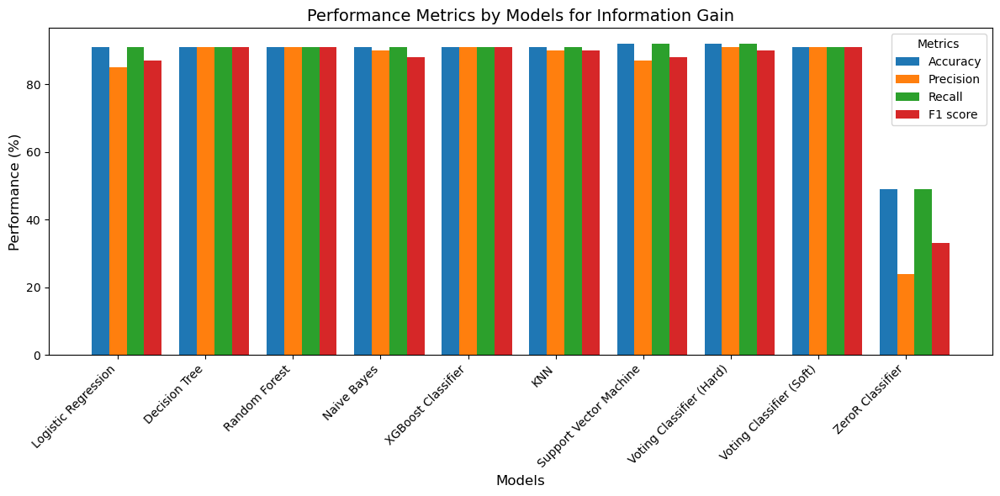

Plot saved: plots/Information_Gain_performance.png


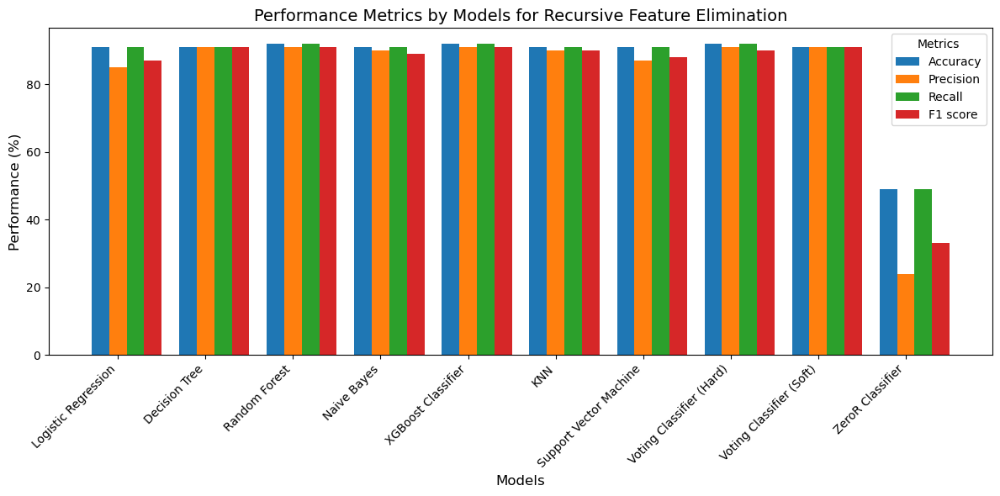

Plot saved: plots/Recursive_Feature_Elimination_performance.png


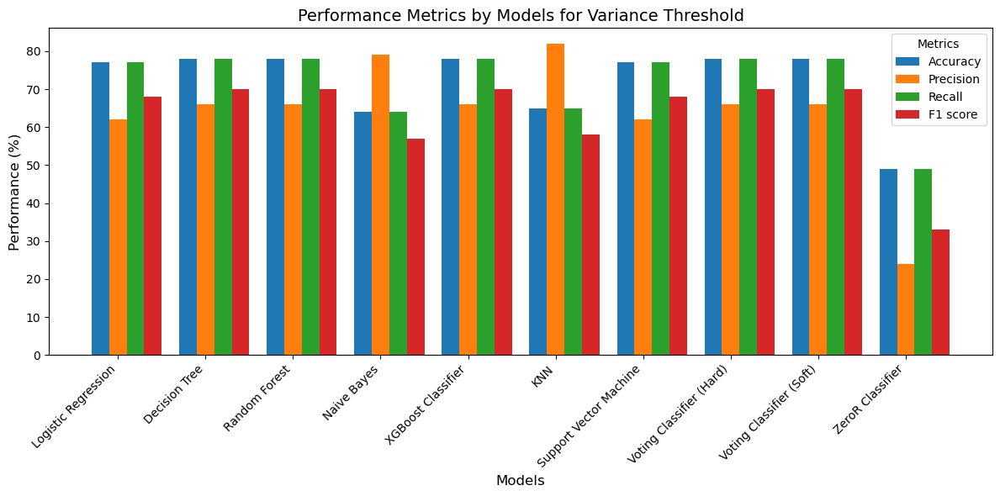

Plot saved: plots/Variance_Threshold_performance.png


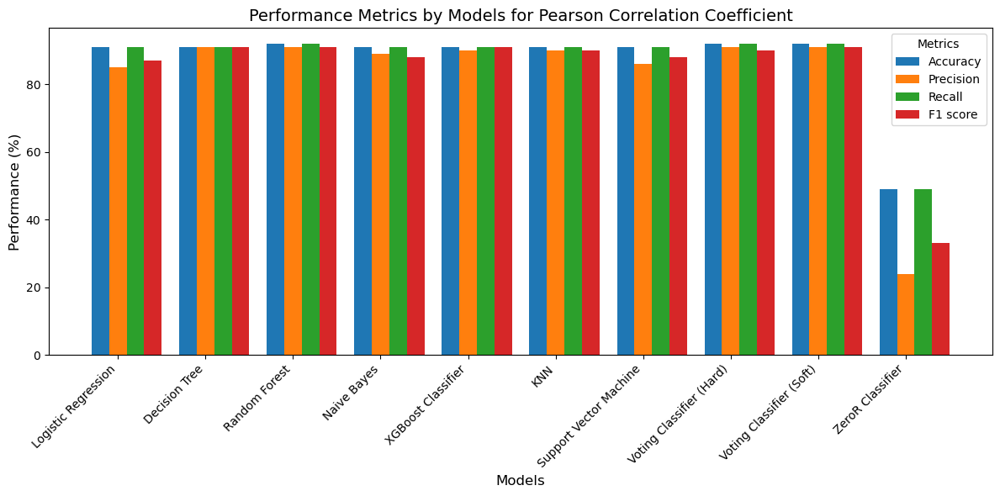

Plot saved: plots/Pearson_Correlation_Coefficient_performance.png


In [342]:
for method in feature_selection_methods:
    plt.figure(figsize=(12, 6))
    width = 0.2  
    x = np.arange(len(models))
    
    for i, metric in enumerate(metrics):
        values = [performance_data[model][method][i] for model in models if method in performance_data[model]]
        plt.bar(x + i * width, values, width, label=metric)
    
    plt.title(f'Performance Metrics by Models for {method}', fontsize=14)
    plt.xlabel('Models', fontsize=12)
    plt.ylabel('Performance (%)', fontsize=12)
    plt.xticks(x + width, models, rotation=45, ha='right')
    plt.legend(title="Metrics", fontsize=10)
    plt.tight_layout()
    file_path = os.path.join(plot_folder, f"{method.replace(' ', '_')}_performance.png")
    plt.savefig(file_path)
    plt.show()
    print(f"Plot saved: {file_path}")